# Mashable articles: share prediction, classification, & topicality clustering
### By: Kyle Ziegler, Venkat Panyam, and Chris Roy

[Proposal](https://docs.google.com/document/d/1EF2hO73eL2OnqqItnvtulWejDULbUjXQOdt2ymJrpk8/edit?tab=t.0)

## Imports

In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import os

In [ ]:
# Run this and grant permissions for Colab to mount the shared folder for project files.
# You will first need to Add a shortcut in your "MyDrive" to the "M2" folder from "Shared With Me" in your Drive

from google.colab import drive
drive.mount("/content/drive")
shared_path = "/content/drive/MyDrive/M2"
os.chdir(shared_path)

Mounted at /content/drive


## Import Data

Read from UCI Dataset

Files:
- /content/OnlineNewsPopularity/OnlineNewsPopularity.names
- /content/OnlineNewsPopularity/OnlineNewsPopularity.csv

In [ ]:
# Read the CSV file into a pandas DataFrame
df = pd.read_csv('./content/OnlineNewsPopularity/OnlineNewsPopularity.csv')

df.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [ ]:
# !pip install trafilatura beautifulsoup4
import trafilatura
from concurrent.futures import ThreadPoolExecutor, as_completed

def download_article_text(url):
    """Downloads article text from a given URL."""
    try:
        downloaded = trafilatura.fetch_url(url)
        if downloaded:
            return trafilatura.extract(downloaded)
        else:
            return None
    except Exception as e:
        print(f"Error downloading {url}: {e}")
        return None

# Use ThreadPoolExecutor for parallel downloads
# Adjust max_workers based on your system and network capabilities
with ThreadPoolExecutor(max_workers=10) as executor:
    future_to_url = {executor.submit(download_article_text, url): url for url in df['url']}
    article_texts = {}
    for future in as_completed(future_to_url):
        url = future_to_url[future]
        try:
            text = future.result()
            article_texts[url] = text
        except Exception as exc:
            print(f'{url} generated an exception: {exc}')

# Create a new DataFrame or add a column to the existing one
df['article_text'] = df['url'].map(article_texts)

df.head()

In [ ]:
df.article_text.head()

In [ ]:
df.shape, df.iat[0,61]

In [ ]:
# Save the data frame with article content as a pkl file so we can load it next time

df.to_pickle("./content/OnlineNewsPopularity/all_features.pkl")

In [ ]:
# df.to_csv('./content/OnlineNewsPopularity/all_features.csv', index=False)


In [ ]:
max_rows = df.shape[0]

In [ ]:
import aiohttp, asyncio, time
from bs4 import BeautifulSoup

# Function to fetch article content and metadata asynchronously
async def fetch_article(session, url, get_html=False):
    try:
        async with session.get(url, timeout=30) as response:
            response.raise_for_status() # Raise an exception for bad status codes
            content = await response.text()
            soup = BeautifulSoup(content, 'html.parser')
            # print(content)

            # Extract title
            title = soup.find("meta", property="og:title")
            if title:
              title = title["content"]
            else:
              title = None
            # print("title: ", title)

            # Extract author (common patterns)
            author = soup.find("meta", property="article:author")
            if author:
              author = author["content"]
            else:
              author = None
            # print("author: ", author)

            # url = soup.find("meta", property="og:url")

            # Extract publish date (common patterns)
            publish_date = soup.find("meta", property="article:published_time")
            if publish_date:
              publish_date = publish_date["content"]
            else:
              publish_date = None
            # print("publish_date: ", publish_date)

            if get_html:
              article_content = content
            else:
              article_content = str(soup.find(id="article"))

            return url, article_content, title, author, publish_date

    except aiohttp.ClientError as e:
        print(f"Error fetching {url}: {e}")
        return url, None, None, None, None
    except asyncio.TimeoutError:
        print(f"Timeout fetching {url}")
        return url, None, None, None, None
    except Exception as e:
        print(f"An unexpected error occurred fetching {url}: {e}")
        return url, None, None, None, None

# Function to process articles in batches
async def process_articles(urls, batch_size=10, delay=0.1, get_html=False):
    results = []
    async with aiohttp.ClientSession() as session:
        for i in range(0, len(urls), batch_size):
            batch_urls = urls[i:i+batch_size]
            tasks = [fetch_article(session, url, get_html) for url in batch_urls]
            batch_results = await asyncio.gather(*tasks)
            results.extend(batch_results)
            # Implement rate limiting
            time.sleep(delay)
    return results

In [ ]:
print(time.time())
articles_dfs = {}  # Store DataFrames in a dictionary
articles_df_list = []

for i in range(int(np.ceil(df.shape[0] / 10000))):
  lo, hi = i*10000, min((i+1)*10000-1, max_rows)
  # lo, hi = i*10000+500, min((i)*10000+501-1, max_rows)   # for testing; 1 row per group

  # Get the list of URLs (remove leading/trailing whitespace)
  urls = df.loc[lo:hi,'url'].str.strip().tolist()

  # Filter out invalid URLs (e.g., 'http://')
  urls = [url for url in urls if url.startswith('http')]

  # Process articles (adjust batch_size and delay as needed)
  print(f"Starting to fetch {len(urls)} articles... {lo}-{hi}")
  batch_size = 20
  get_html = False
  article_data = await process_articles(urls, batch_size=batch_size, delay=0.5, get_html=get_html)
  # print(time.time())

  # Create a new DataFrame for the downloaded content and metadata
  articles_dfs[f'articles_df_{i}'] = pd.DataFrame(article_data, columns=['url', 'article_content', 'article_title', 'article_author', 'article_publish_date'])
  articles_df_list.append(f'articles_df_{i}')

  # save each as a pkl file in case there are errors
  articles_dfs[f'articles_df_{i}'].to_pickle(f'/content/articles_df_{i}.pkl')

  print(articles_dfs[f'articles_df_{i}'].shape)
  print(time.time())

print(articles_df_list)
# Concatenate from the dictionary
concatenated_df = pd.concat([articles_dfs[name] for name in articles_df_list], ignore_index=True)
print(concatenated_df.shape)

# save consolidated df as pkl file
concatenated_df.to_pickle(f'/content/articles_df_consolidated.pkl')

1747942099.3557413
Starting to fetch 10000 articles... 0-9999
(10000, 5)
1747943134.0694876
Starting to fetch 10000 articles... 10000-19999
Error fetching http://mashable.com/2013/10/16/young-adult-books-cry/: 404, message='Not Found', url='https://mashable.com/2013/10/16/young-adult-books-cry/'
(10000, 5)
1747944143.7567039
Starting to fetch 10000 articles... 20000-29999
(10000, 5)
1747945163.7092156
Starting to fetch 9644 articles... 30000-39644
Error fetching http://mashable.com/2014/08/14/cool-bike-accessories/: 404, message='Not Found', url='https://mashable.com/2014/08/14/cool-bike-accessories/'
Timeout fetching http://mashable.com/2014/09/04/samsung-note-4-edge-hangout/
Error fetching http://mashable.com/2014/12/16/los-angeles-cosby-no-charges/: 404, message='Not Found', url='https://mashable.com/2014/12/16/los-angeles-cosby-no-charges/'
(9644, 5)
1747946181.1344526
['articles_df_0', 'articles_df_1', 'articles_df_2', 'articles_df_3']
(39644, 5)


## Supervised

### Feature Engineering

In [ ]:
# Import packages and mount Drive
#
# Load data from pickle file (with article content) and trim column names

df = pd.read_pickle("./content/OnlineNewsPopularity/all_features.pkl")
df.columns = df.columns.str.strip()

df.shape

In [ ]:
# Concatente with article title, author and publish date

df_ = pd.read_pickle("./content/OnlineNewsPopularity/article_titles_df.pkl")
df_.rename(columns={"url": "url_"}, inplace=True)
df = pd.concat([df, df_], axis=1)
df_ = None

print(df.shape, (df.url != df.url_).sum())

if (df.url != df.url_).sum() == 0:
  df.drop("url_", axis=1, inplace=True)

print(df.shape)

In [ ]:
# Are there articles for which content is no longer available

print(df.article_title.isna().sum(), df.article_text.isna().sum())
df[df.article_text.isna()]

# Three articles do not have content or title (verified manually that they are no longer available)

In [ ]:
# Create a new feature "channel" combining the "data_channel_is_..." columns into a single value

channel_cols = df.columns[df.columns.str.contains("data_channel_is_")].to_list()
df["channel"] = np.argmax(df[channel_cols].to_numpy(), axis=1, keepdims=True)

df[channel_cols + ["channel"]].sample(5)

In [ ]:
# Optional: filter or preprocess content
df['article_text'] = df['article_text'].fillna('')

# Step 2: Embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')
content_embeddings = model.encode(df['article_text'].tolist(), batch_size=32, show_progress_bar=True)

Batches:   0%|          | 0/1239 [00:00<?, ?it/s]

In [ ]:
print(content_embeddings.shape)
np.save("content_embeddings.npy", content_embeddings)

(39644, 384)


In [ ]:
from sentence_transformers import SentenceTransformer

df['article_title'] = df['article_title'].fillna('')
model = SentenceTransformer('all-MiniLM-L6-v2')
title_embeddings = model.encode(df['article_title'].tolist(), batch_size=64, show_progress_bar=True)
np.save("title_embeddings.npy", title_embeddings)

In [ ]:
# Save to a new pickle file after featuer engineering for Supervised Learning
# Stock features (unscaled) + embeddings of title and content

print(df.shape)
df.to_pickle("./content/OnlineNewsPopularity/all_features_v2.pkl")

### Modeling: Predict Article Category

#### Imports and Settings

In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from itertools import combinations
import pickle
import joblib
import shap

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, ConfusionMatrixDisplay, confusion_matrix, \
 accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, log_loss, top_k_accuracy_score

from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_validate, RandomizedSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.neural_network import MLPClassifier

from xgboost import XGBClassifier
# from sentence_transformers import SentenceTransformer

# suppress warnings
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_colwidth', 100)
pd.set_option('display.max_rows', 200)

In [ ]:
# Run this and grant permissions for Colab to mount the shared folder for project files.
# You will first need to Add a shortcut in your "MyDrive" to the "M2" folder from "Shared With Me" in your Drive

from google.colab import drive
drive.mount("/content/drive")
shared_path = "/content/drive/MyDrive/M2/content/OnlineNewsPopularity"
os.chdir(shared_path)
os.listdir()

Mounted at /content/drive


['OnlineNewsPopularity.csv',
 'OnlineNewsPopularity.names',
 'all_features.pkl',
 'article_titles_df.pkl',
 'all_features_v2.pkl',
 'title_embeddings.npy',
 'content_embeddings.npy',
 'title_embeddings_small.npy',
 'all_features_v2_with_embeddings.pkl',
 'word_df.pkl',
 '.ipynb_checkpoints',
 'best_model_cl_0.pkl',
 'trained_models_20250612_1947.pkl',
 'trained_base_models.pkl',
 'feature_contrib_xgb_base.csv',
 'df_sup_cl_enhanced_cl.pkl',
 'best_model_cl_xgb_1.pkl',
 'xgb_enh.pkl',
 'best_model_cl_xgb_0.pkl',
 'df_hyper_results.pkl',
 'xgb_final_tuned.pkl',
 'shap_values_xgb_cl.pkl',
 'asp_model_results_summary.pkl',
 'asp_model_results_summary.csv',
 'df_learning_results_cl.pkl']

#### Helper Functions

In [ ]:
epsilon = np.finfo(float).eps

# load article data (original, with article content added)

def get_article_data_from_pkl(pkl_file):
    # load data from pkl file
    df = pd.read_pickle(pkl_file)
    print(f"Article data loaded from pkl file {pkl_file}- Shape: {df.shape}")

    return df
# end get_article_data_from_pkl

def get_num_features(df, exclude_cols=[]):
  num_cols = df.select_dtypes(include=["number"]).columns.to_list()
  return [col for col in num_cols if col not in exclude_cols]
# end get_num_features

def load_saved_embeddings(embeddings_file):
    return np.load(embeddings_file)
# end load_saved_embeddings

# Reduce the size of the title embeddings to 64 tokens from 384
# Input: title_embeddings from above
# Output: title_embeddings_small.npy file (new)
def get_title_embeddings_small(title_embeddings, n_components=64):

  def reduce_dimensions(embeddings, n_components=64):
    pca = PCA(n_components=n_components)
    return pca.fit_transform(embeddings)

  if not os.path.exists("title_embeddings.npy"):
    title_embeddings_small = reduce_dimensions(title_embeddings)
    print(f"Reduced embeddings for article titles: {title_embeddings_small.shape}")

    # save these as an .npy file
    np.save("title_embeddings_small.npy", title_embeddings_small)
  else:
    title_embeddings_small = load_saved_embeddings("title_embeddings_small.npy")
    print(f"Loaded reduced embeddings for article titles: {title_embeddings_small.shape}")

  title_embeddings_small_cols = [f"title_embedding_small_{i}" for i in range(title_embeddings_small.shape[1])]

  return title_embeddings_small, title_embeddings_small_cols
# end get_title_embeddings_small

# set up variables
def get_col_groups(df):
  # what are the "channels" we are trying to predict
  channel_dict = {i:c.replace("data_channel_is_", "") for i,c in enumerate(df.columns[df.columns.str.contains("data_channel_is_")])}
  # {0: 'lifestyle', 1: 'entertainment', 2: 'bus', 3: 'socmed', 4: 'tech', 5: 'world'}
  channel_dict[2] = 'business'
  channel_dict[3] = 'social media'
  channel_dict[4] = 'technology'

  data_channel_cols = [col for col in df.columns if col.startswith("data_channel_is_")]
  LDA_cols = [col for col in df.columns if col.startswith("LDA_0")]
  c_target = "channel"

  return channel_dict, data_channel_cols, LDA_cols, c_target
# end get_col_groups

In [ ]:
def get_feature_importances(model, feature_names, top_n=20, show_feat_imp=True):
  # feature_names is the names of the tabular features used in the model
  # Get feature importances from the trained XGBoost model
  try:
    feature_importances = model.feature_importances_
  except:
    print("Model does not support feature importance")
    return pd.DataFrame(columns=["feature", "importance"])

  # Create a DataFrame to store feature names and their importances
  df_importance = pd.DataFrame({
      "feature": feature_names,
      "importance": feature_importances
  })

  # Sort the features by importance in descending order
  df_feat_importance = df_importance.sort_values('importance', ascending=False)
  # get top-n of these
  df_feat_importance_topn = df_feat_importance.head(top_n)

  if show_feat_imp:
    # Print the feature importances
    print("Feature Importances:")
    print(df_feat_importance_topn)

    # Visualize the feature importances
    ht = int(top_n*0.25)
    plt.figure(figsize=(10, ht))
    sns.barplot(x="importance", y="feature", data=df_feat_importance_topn) # Display top_n features
    plt.title(f"Top {top_n} Feature Importances")
    plt.xlabel("Importance Score")
    plt.ylabel("Feature")
    plt.tight_layout()
    plt.show()

  return df_feat_importance
# end get_feature_importances

In [ ]:
# classification models / training

clf_models = {
    "dummy_most_frequent": DummyClassifier(
        strategy="most_frequent"
        ),
    "dummy_uniform": DummyClassifier(
        strategy="uniform"
        ),
    "GaussianNB": GaussianNB(
        ),
    "kNN": KNeighborsClassifier(
        n_neighbors=3,
        n_jobs=-1,
        ),
    "LogisticRegression": LogisticRegression(
        multi_class="multinomial",
        solver="lbfgs",
        max_iter=1000,
        n_jobs=-1,
        penalty="l2",
        C=1.0,
        random_state=42,
        ),
    "RidgeClassifier": RidgeClassifier(
        random_state=42
        ),
    "RandomForest": RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        random_state=42
        ),
    "xgb": XGBClassifier(
        objective="multi:softmax",
        num_class=6,
        tree_method="hist",
        use_label_encoder=False,
        eval_metric="mlogloss",
        n_jobs=-1,
        random_state=42,
        ),
    "MLP": MLPClassifier(
        hidden_layer_sizes=(128,64,32),
        activation='relu',
        solver='adam',
        alpha=0.0001,
        batch_size='auto',
        learning_rate='constant',
        learning_rate_init=0.001,
        max_iter=200,
        shuffle=True,
        random_state=42,
    ),
    "SVC_rbf": SVC(
        kernel="rbf",
        decision_function_shape="ovr",
        probability=True,
        random_state=42,
        ),
    "SVC_linear": SVC(
        kernel="linear",
        probability=True,
        random_state=42,
        ),
    }

models_no_scaling = ["dummy_most_frequent", "dummy_uniform", "xgb", "RandomForest"]
# models_needing_normalize_data = ["GaussianNB", "kNN", "LogisticRegression", "RidgeClassifier", "SVC_linear", "SVC_rbf", "MLP"]
models_needing_normalize_data = [mdl for mdl in clf_models if mdl not in models_no_scaling]

def transform_skewed_features(X, numeric_columns, skew_threshold=0.75):
    """Log-transform skewed numeric features."""
    for col in numeric_columns:
      print(f"Skew for {col}")
      if abs(X[col].skew()) > skew_threshold:
        X[col] = np.log1p(X[col])
      return X
# emd transformed_skewed_features

def preprocess_data(df):
    # Drop rows with missing article text
    df = df.dropna(subset=["article_text"])
    return df
# end preprocess_data

# get polynomial terms of a given degree of the input features

def get_poly_features(df, features, degree=2):
  poly = PolynomialFeatures(degree)
  return poly.fit_transform(df[features]), poly.get_feature_names_out()
# end get_poly_features

# Since the LDA terms are the top features, let's add combinations of 2,3,4 of the LDA columns (lda_cols) as new features
def add_LDA_col_sums(df, lda_cols):
  print(f"input shape: {df.shape}")
  df = df.drop(columns=[col for col in df_sup_cl.columns if col.startswith("combined_LDA_")])
  print(f"input shape after dropping combined_LDA_ columns: {df.shape}")

  # add combinations of 2-4 columns from lda_cols to df
  for i in range(2,5):
    for combination in combinations(lda_cols, i):
      new_col_name = "combined_" + "_".join(combination)
      df[new_col_name] = df[list(combination)].sum(axis=1)

  print(f"output shape: {df.shape}")
  return df
# end add_LDA_col_sums

# some classifiers do not support predict_proba and hence metrics that need probabilities
def get_valid_metrics(clf, all_metrics):
    if hasattr(clf, "predict_proba"):
        return all_metrics
    else:
        return [m for m in all_metrics if m not in ["neg_log_loss", "roc_auc_ovr", "roc_auc_ovo"]]
# get_valid_metrics

# train one or more models and return a dictionary with entries for each
def train_classification_model(df, all_features, target_cl, random_state=42,
                               features_to_scale=None, models=["xgb"], test_size=0.2,
                               metrics=["accuracy","precision_macro","recall_macro","f1_macro","neg_log_loss","roc_auc_ovr","roc_auc_ovo"],
                               preprocess=False, return_X_test=False, n_splits=5, top_n=15, show_feat_imp=False,
                               show_classif_rpt=True, show_conf_matrix=False):

  dttm = datetime.now().strftime("%Y%m%d_%H%M")
  models_pkl_file = f"trained_models_{dttm}.pkl"
  trained_models = {}
  # if save_models:
  #   with open(models_pkl_file, "wb") as f:
  #     pickle.dump(trained_models, f)

  cv_summary = []
  test_metrics = []

  if models is None or models==[]:
    models = ["xgb"]
  elif models==["all"]:
    models = [k for k in clf_models]

  for mdl in models:
    if mdl not in clf_models:
      raise ValueError(f"Model {mdl} not supported")

  # preprocess input data
  print(f"Input data - shape: {df.shape}")
  if preprocess:
    df = preprocess_data(df)
  print(f"Preprocessed data - shape: {df.shape}")

  # Train-test split
  X = df[all_features]
  y = df[target_cl]

  X_train, X_test, y_train, y_test = train_test_split(
      X, y, test_size=test_size, stratify=y, random_state=random_state)
  print(f"Train, test split - shape: {X_train.shape}, {y_train.shape}, {X_test.shape}, {y_test.shape}")

  # Feature scaling if needed
  if features_to_scale is None or features_to_scale==[]:
    features_to_scale = all_features.copy()

  # Identify binary features (likely one-hot encoded)
  ohe_cols = [col for col in features_to_scale if set(X_train[col].unique()) <= {0, 1}]
  print(f"One-hot encoded features: {ohe_cols}")
  numeric_features = [col for col in features_to_scale if col not in ohe_cols]

  # Pre-copy for scaling/transforming
  X_train_scaled = X_train.copy()
  X_test_scaled = X_test.copy()

  # Transform skewed features (only numeric ones)
  X_train_scaled = transform_skewed_features(X_train_scaled, numeric_features)
  X_test_scaled = transform_skewed_features(X_test_scaled, numeric_features)

  # Pre-scale only numeric features
  scaler = StandardScaler()
  X_train_scaled[numeric_features] = scaler.fit_transform(X_train_scaled[numeric_features])
  X_test_scaled[numeric_features] = scaler.transform(X_test_scaled[numeric_features])
  print(f"Normalized features - shape: {X_train_scaled.shape}, {X_test_scaled.shape}")

  print(f"Training models: {models}")
  for mdl in models:

    print("")
    print(datetime.now())
    print(f"Model: {mdl}")
    clf = clf_models[mdl]
    valid_metrics_for_clf = get_valid_metrics(clf, metrics)

    use_scaled = mdl in models_needing_normalize_data
    if use_scaled:
      print(f"Using normalized features - shape: {X_train_scaled.shape}, {X_test_scaled.shape}")
      X_train_final = X_train_scaled.copy()
      X_test_final = X_test_scaled.copy()
    else:
      X_train_final = X_train.copy()
      X_test_final = X_test.copy()

    print(f"Final train, test split - shape: {X_train_final.shape}, {y_train.shape}, {X_test_final.shape}, {y_test.shape}")

    # Cross-validation
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=random_state)
    cv_results = cross_validate(clf, X_train_final, y_train, cv=cv, scoring=valid_metrics_for_clf, return_train_score=False)

    # print metric values for each cross validation
    for metric in valid_metrics_for_clf:
      cv_scores = cv_results[f"test_{metric}"]
      print(f"\tCV {metric.capitalize()}: Mean = {np.mean(cv_scores):.4f}, Std = {np.std(cv_scores):.4f}")
      cv_summary.append({
          "model": mdl,
          "metric": metric,
          "mean": np.mean(cv_scores),
          "std": np.std(cv_scores)
          })

    # Fit on entire training data and predict on test data
    clf.fit(X_train_final, y_train)
    y_pred = clf.predict(X_test_final)

    # print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    if show_classif_rpt:
      print("Classification Report:")
      print(classification_report(y_test, y_pred))

    # get confusion matrix
    if show_conf_matrix:
      conf_matrix = confusion_matrix(y_test, y_pred)
      ConfusionMatrixDisplay(conf_matrix, display_labels=clf.classes_).plot(cmap="YlGnBu")
      plt.title(f"Confusion Matrix for {mdl}")
      plt.show()

    # print metric values for final model against Test
    accu = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, average="macro")
    reca = recall_score(y_test, y_pred, average="macro")
    f1 = f1_score(y_test, y_pred, average="macro")
    logloss = None
    roc_auc_ovr = None
    roc_auc_ovo = None

    if hasattr(clf, "predict_proba"):
      y_pred_proba = clf.predict_proba(X_test_final)
      logloss = log_loss(y_test, y_pred_proba)
      roc_auc_ovr = roc_auc_score(y_test, y_pred_proba, average="macro", multi_class="ovr")
      roc_auc_ovo = roc_auc_score(y_test, y_pred_proba, average="macro", multi_class="ovo")
    else:
      y_pred_proba = None

    test_metrics.append({"model": mdl, "metric":"accuracy", "value":accu})
    test_metrics.append({"model": mdl, "metric":"precision_macro", "value":prec})
    test_metrics.append({"model": mdl, "metric":"recall_macro", "value":reca})
    test_metrics.append({"model": mdl, "metric":"f1_macro", "value":f1})
    test_metrics.append({"model": mdl, "metric":"neg_log_loss", "value":logloss})
    test_metrics.append({"model": mdl, "metric":"roc_auc_ovr", "value":roc_auc_ovr})
    test_metrics.append({"model": mdl, "metric":"roc_auc_ovo", "value":roc_auc_ovo})

    print(f"Test Accuracy: {accu:.4f}")
    print(f"Test Precision: {prec:.4f}")
    print(f"Test Recall: {reca:.4f}")
    print(f"Test F1: {f1:.4f}")
    if logloss is not None:
      print(f"Test Log Loss: {logloss:.4f}")
    if roc_auc_ovr is not None:
      print(f"Test ROC AUC (ovr): {roc_auc_ovr:.4f}")
    if roc_auc_ovo is not None:
      print(f"Test ROC AUC (ovo): {roc_auc_ovo:.4f}")

    # # Store results
    # if save_models:
    #   with open(models_pkl_file, "rb") as f:
    #     trained_models = pickle.load(f)

    trained_models[mdl] = {
        "model": clf,
        "cv_results": cv_results,
        "y_pred": y_pred,
        "y_test": y_test,
        "y_pred_proba": y_pred_proba,
    }

    if return_X_test:
      trained_models[mdl]["X_train"] = X_train_final
      trained_models[mdl]["y_train"] = y_train
      trained_models[mdl]["X_test"] = X_test_final

    df_feature_importance = get_feature_importances(clf, all_features, top_n=top_n, show_feat_imp=show_feat_imp)
    trained_models[mdl]["feat_imp"] = df_feature_importance

    # # Save
    # if save_models:
    #   with open(models_pkl_file, "wb") as f:
    #     pickle.dump(trained_models, f)
    #     trained_models = {}

  return trained_models, pd.DataFrame(cv_summary), pd.DataFrame(test_metrics)
# end train_classification_model

metrics = ["accuracy","precision_macro","recall_macro","f1_macro","neg_log_loss","roc_auc_ovr","roc_auc_ovo"]

#### Load data and embeddings, set up variables

In [ ]:
# Load the original features from pkl file (v2 containing original features and article content, title, etc.)
# These is the original data and has not undergone any transformations

# variables available after running this cell-
#   df_sup_cl                   - unprocessed original features (dataframe)
#   target_cl                   - target column for classification- "Category/channel" (string)
#   title_embeddings            - title embeddings of size 384 (numpy array)
#   title_embedding_cols        - column names for title_embeddings (list)
#   title_embeddings_small      - title embeddings of size 384 (numpy array)
#   title_embedding_small_cols  - column names for title_embeddings (list)
#   content_embeddings          - article text embeddings of size 384 (numpy array)
#   content_embedding_cols      - column names for content_embeddings (list)
#   lda_cols                    - LDA_0* columns in the original dataset (list)
#   channel_cols                - data_channel_is_* columns in the original dataset (list)
#   channel_dict                - Category/channel values and descriptions (dictionary)
#   vars_to_skip_cl             - list of columns to skip for classification task
#   features_cl_orig            - numeric features from dataset excluding vars_to_skip_cl, target and channel_cols

df_sup_cl = get_article_data_from_pkl("all_features_v2.pkl")
# convert article_publish_date to datetime
df_sup_cl['article_publish_date'] = pd.to_datetime(df_sup_cl['article_publish_date'])

# Load the embeddings from saved files for potential use as additional features

title_embeddings = load_saved_embeddings("title_embeddings.npy")
print(f"Loaded title embeddings - {title_embeddings.shape}")
title_embedding_cols = [f"title_embedding_{i}" for i in range(title_embeddings.shape[1])]

content_embeddings = load_saved_embeddings("content_embeddings.npy")
print(f"Loaded content embeddings - {content_embeddings.shape}")
content_embedding_cols = [f"content_embedding_{i}" for i in range(content_embeddings.shape[1])]

title_embeddings_small, title_embeddings_small_cols = get_title_embeddings_small(title_embeddings)

# create variables for column groups for data_channel_is_ columns, LDA_ columns, target col for classification and the dictionary mapping "channel" id to category
channel_dict, channel_cols, lda_cols, target_cl = get_col_groups(df_sup_cl)
print(f"Categories : {channel_dict}")
print(f"Channel/article category columns (drop for classification): {channel_cols}")
print(f"LDA columns: {lda_cols}")
print(f"Target column for classification: {target_cl}")

vars_to_skip_cl = ["timedelta", "shares"]
features_cl_orig = get_num_features(df_sup_cl, exclude_cols=channel_cols+[target_cl]+vars_to_skip_cl)
print(f"Numeric features excluding one-hot encoded category, shares, timedelta and the target (category) - {len(features_cl_orig)} : {features_cl_orig}")


Article data loaded from pkl file all_features_v2.pkl- Shape: (39644, 67)
Loaded title embeddings - (39644, 384)
Loaded content embeddings - (39644, 384)
Loaded reduced embeddings for article titles: (39644, 64)
Categories : {0: 'lifestyle', 1: 'entertainment', 2: 'business', 3: 'social media', 4: 'technology', 5: 'world'}
Channel/article category columns (drop for classification): ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world']
LDA columns: ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04']
Target column for classification: channel
Numeric features excluding one-hot encoded category, shares, timedelta and the target (category) - 52 : ['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens', 'num_hrefs', 'num_self_hrefs', 'num_imgs', 'num_videos', 'average_token_length', 'num_keywords', 'kw_min_min', 'kw_max_min', 'kw_avg_min',

In [ ]:
# dataframe for supervised task- classification of category
df_sup_cl.shape

(39644, 67)

In [ ]:
df_sup_cl.describe().T

,count,mean,std,min,25%,50%,75%,max
timedelta,39644.0,354.530471,214.163767,8.00000,164.000000,339.000000,542.000000,731.000000
n_tokens_title,39644.0,10.398749,2.114037,2.00000,9.000000,10.000000,12.000000,23.000000
n_tokens_content,39644.0,546.514731,471.107508,0.00000,246.000000,409.000000,716.000000,8474.000000
n_unique_tokens,39644.0,0.548216,3.520708,0.00000,0.470870,0.539226,0.608696,701.000000
n_non_stop_words,39644.0,0.996469,5.231231,0.00000,1.000000,1.000000,1.000000,1042.000000
n_non_stop_unique_tokens,39644.0,0.689175,3.264816,0.00000,0.625739,0.690476,0.754630,650.000000
num_hrefs,39644.0,10.883690,11.332017,0.00000,4.000000,8.000000,14.000000,304.000000
num_self_hrefs,39644.0,3.293638,3.855141,0.00000,1.000000,3.000000,4.000000,116.000000
num_imgs,39644.0,4.544143,8.309434,0.00000,1.000000,1.000000,4.000000,128.000000
num_videos,39644.0,1.249874,4.107855,0.00000,0.000000,0.000000,1.000000,91.000000


In [ ]:
missing_values = df_sup_cl.isnull().sum()
missing_values[missing_values > 0]

,0
article_text,5
article_content,3
article_title,3
article_author,651
article_publish_date,3


In [ ]:
s = df_sup_cl[target_cl].value_counts().sort_index()
s_sum = s.sum()
s_percentage = (s / s_sum * 100).round(2)
pd.DataFrame({"count": s, "percentage": s_percentage})

,count,percentage
channel,,
0,8233,20.77
1,7057,17.80
2,6258,15.79
3,2323,5.86
4,7346,18.53
5,8427,21.26


In [ ]:
pd.DataFrame([[k, v] for k,v in channel_dict.items()], columns=["Category", "Description"])

,Category,Description
0,0,lifestyle
1,1,entertainment
2,2,business
3,3,social media
4,4,technology
5,5,world


#### Train 11 models on the base data
(including 2 dummy models)
Then add additional features and retrain the best performing model

In [ ]:
# train all models on the base data
trained_models_base, train_metrics_base, test_metrics_base = train_classification_model(
    df=df_sup_cl, all_features=features_cl_orig, target_cl=target_cl, models=["all"])

Input data - shape: (39644, 67)
Preprocessed data - shape: (39644, 67)
Train, test split - shape: (31715, 52), (31715,), (7929, 52), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 52), (7929, 52)
Training models: ['dummy_most_frequent', 'dummy_uniform', 'GaussianNB', 'kNN', 'LogisticRegression', 'RidgeClassifier', 'RandomForest', 'xgb', 'MLP', 'SVC_rbf', 'SVC_linear']

2025-06-13 23:48:10.854727
Model: dummy_most_frequent
Final train, test split - shape: (31715, 52), (31715,), (7929, 52), (7929,)
	CV Accuracy: Mean = 0.2126, Std = 0.0001
	CV Precision_macro: Mean = 0.0354, Std = 0.0000
	CV Recall_macro: Mean = 0.1667, Std = 0.0000
	CV F1_macro: Mean = 0.0584, Std = 0.0000
	CV Neg_log_loss: Mean = -28.3815, Std = 0.0028
	CV Roc_auc_ovr: Mean = 0.500

In [ ]:
# save the trained models dictionary and the crossval results from the above run so we can use them later without rerunning the training step

# with open("trained_base_models.pkl", "wb") as f:
#   pickle.dump((trained_models_base, train_metrics_base, test_metrics_base), f)

# to restore these in a later run, use-
trained_models_base, train_metrics_base, test_metrics_base = pickle.load(open("trained_base_models.pkl", "rb"))
cv_no_dummy = train_metrics_base[(~train_metrics_base["model"].str.startswith("dummy")) & (train_metrics_base["metric"] != "neg_log_loss")]

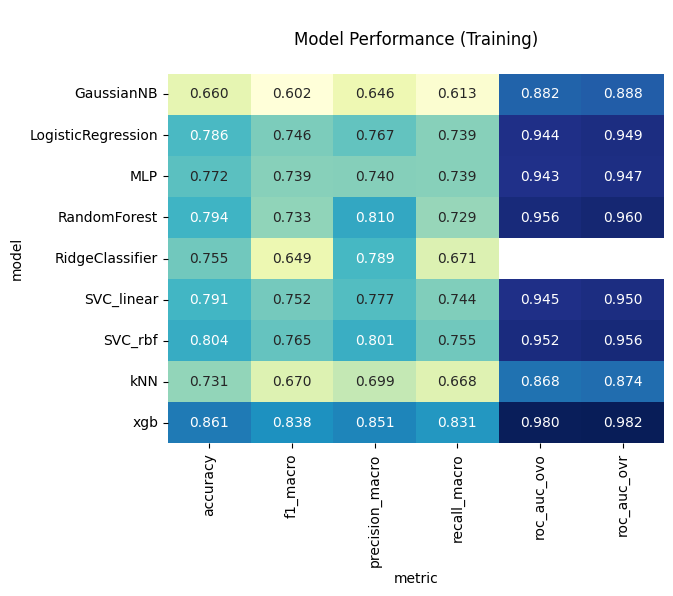

In [ ]:
crosstab = cv_no_dummy.pivot(index="model", columns="metric", values="mean")
sns.heatmap(crosstab, annot=True, fmt=".3f", cmap="YlGnBu", cbar=False)
plt.title("\nModel Performance (Training)\n")
plt.show()

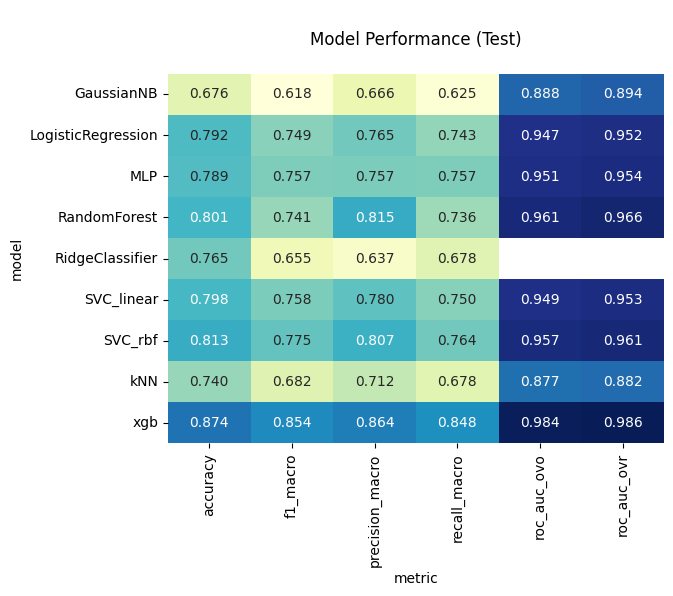

In [ ]:
test_metrics_no_dummy = test_metrics_base[(~test_metrics_base["model"].str.startswith("dummy")) & (test_metrics_base["metric"] != "neg_log_loss")]
crosstab = test_metrics_no_dummy.pivot(index="model", columns="metric", values="value")
sns.heatmap(crosstab, annot=True, fmt=".3f", cmap="YlGnBu", cbar=False)
plt.title("\nModel Performance (Test)\n")
plt.show()

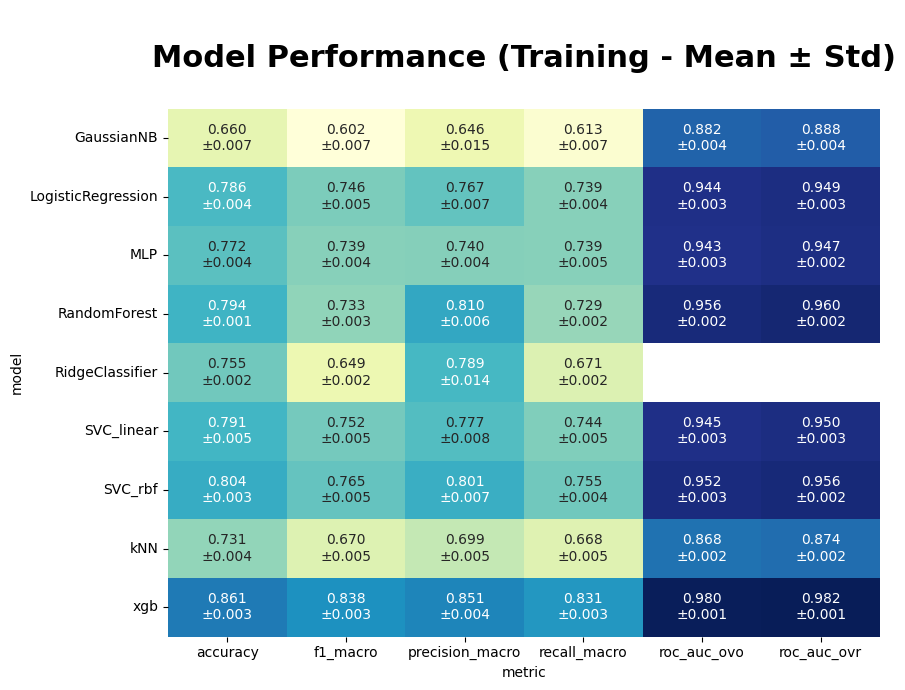

In [ ]:
# Pivot for heatmap data
heatmap_data = cv_no_dummy.pivot(index="model", columns="metric", values="mean")

# Create annotation text (mean \n std)
annot_data = cv_no_dummy.copy()
annot_data['annot'] = annot_data.apply(lambda row: f"{row['mean']:.3f}\n±{row['std']:.3f}", axis=1)
annot = annot_data.pivot(index='model', columns='metric', values='annot')

# Plot heatmap with combined annotations
plt.figure(figsize=(9,7))
sns.heatmap(heatmap_data, annot=annot, fmt="", cmap="YlGnBu", cbar_kws={"label": "Mean Value"}, cbar=False)
plt.title("\nModel Performance (Training - Mean ± Std)\n", fontweight="bold", fontsize=22)
plt.tight_layout()
plt.show()

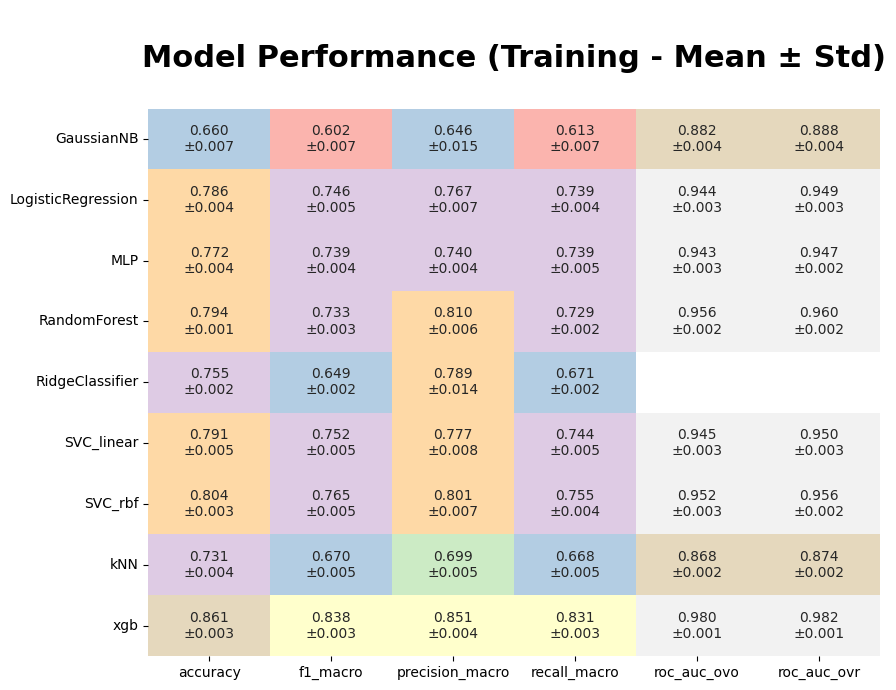

In [ ]:
# Pivot for heatmap data
heatmap_data = cv_no_dummy.pivot(index="model", columns="metric", values="mean")

# Create annotation text (mean \n std)
annot_data = cv_no_dummy.copy()
annot_data['annot'] = annot_data.apply(lambda row: f"{row['mean']:.3f}\n±{row['std']:.3f}", axis=1)
annot = annot_data.pivot(index='model', columns='metric', values='annot')

# Plot heatmap with combined annotations
plt.figure(figsize=(9,7))
sns.heatmap(heatmap_data, annot=annot, fmt="", cmap="Pastel1", cbar_kws={"label": "Mean Value"}, cbar=False)
plt.title("\nModel Performance (Training - Mean ± Std)\n", fontweight="bold", fontsize=22)
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
plt.show()

In [ ]:
from tabulate import tabulate

# Convert the DataFrame to a list of dictionaries
train_metrics_base["score_with_std"] = train_metrics_base.apply(
    lambda row: f"{row['mean']:.3f} ± {row['std']:.3f}", axis=1
)
pivot_score = train_metrics_base.pivot(index="model", columns="metric", values="score_with_std")

# Display
print(tabulate(pivot_score.reset_index(), headers="keys", tablefmt="grid"))


+----+---------------------+---------------+---------------+-----------------+-------------------+----------------+---------------+---------------+
|    | model               | accuracy      | f1_macro      | neg_log_loss    | precision_macro   | recall_macro   | roc_auc_ovo   | roc_auc_ovr   |
+====+=====================+===============+===============+=================+===================+================+===============+===============+
|  0 | GaussianNB          | 0.660 ± 0.007 | 0.602 ± 0.007 | -3.306 ± 0.157  | 0.646 ± 0.015     | 0.613 ± 0.007  | 0.882 ± 0.004 | 0.888 ± 0.004 |
+----+---------------------+---------------+---------------+-----------------+-------------------+----------------+---------------+---------------+
|  1 | LogisticRegression  | 0.786 ± 0.004 | 0.746 ± 0.005 | -0.603 ± 0.015  | 0.767 ± 0.007     | 0.739 ± 0.004  | 0.944 ± 0.003 | 0.949 ± 0.003 |
+----+---------------------+---------------+---------------+-----------------+-------------------+--------------

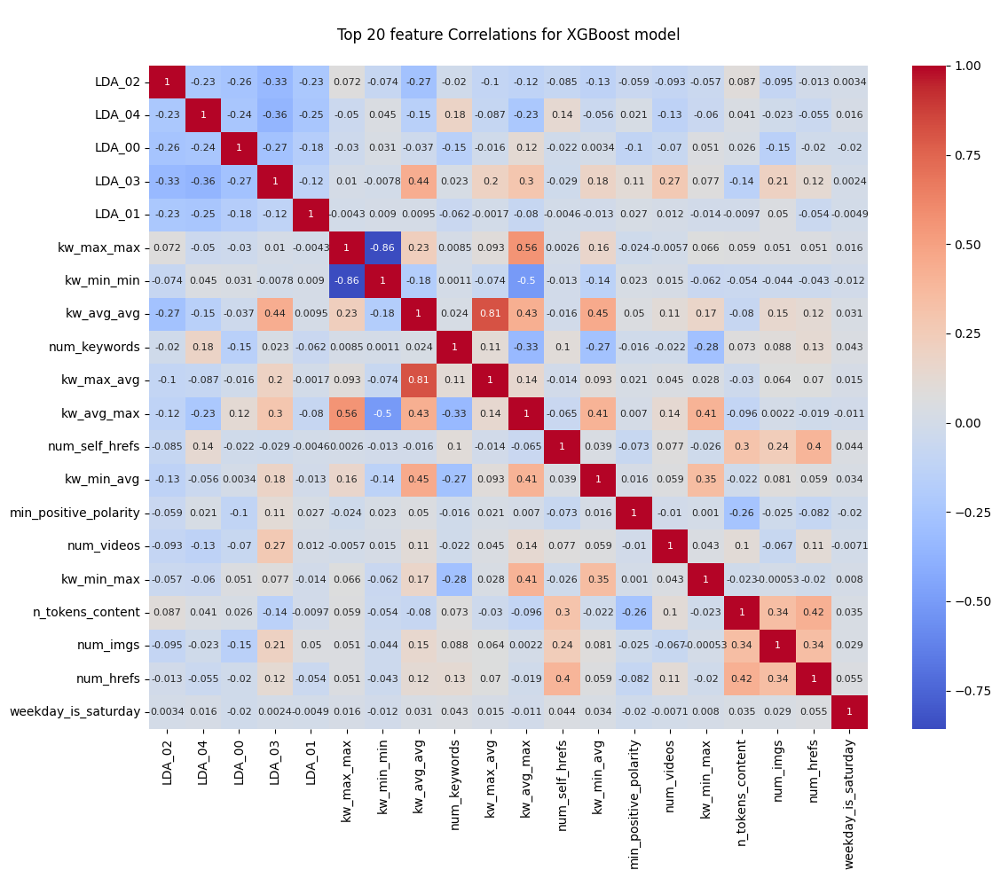

In [ ]:
df_feature_importance_base = trained_models_base["xgb"]["feat_imp"]
feat_corr = df_sup_cl[df_feature_importance_base["feature"].head(20).to_list()].corr()
# display as heatmap
plt.figure(figsize=(12,10))
# plt.rcParams.update({'font.size': 10})
sns.heatmap(feat_corr, annot=True, cmap='coolwarm', annot_kws={"fontsize":8})
plt.title("\nTop 20 feature Correlations for XGBoost model\n")
plt.tight_layout()
plt.show()

In [ ]:
# save the feature contributions for xgb base model

df_feature_importance_base.to_csv("feature_contrib_xgb_base.csv", index=False)

(39644, 67)
(39644, 107)
Input data - shape: (39644, 107)
Preprocessed data - shape: (39644, 107)
Train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 92), (7929, 92)
Training models: ['xgb']

2025-06-23 15:33:49.321424
Model: xgb
Final train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
	CV Accuracy: Mean = 0.8841, Std = 0.0020
	CV Precision_macro: Mean = 0.8764, Std = 0.0031
	CV Recall_macro: Mean = 0.8629, Std = 0.0019
	CV F1_macro: Mean = 0.8685, Std = 0.0020
	CV Neg_log_loss: Mean = -0.3036, Std = 0.0095
	CV Roc_auc_ovr: Mean = 0.9883, Std = 0.0007
	CV Roc_auc_ovo: Mean = 0.9870, Std = 0.0008
Classification Report:
              precision    recall  f1-score   support

 

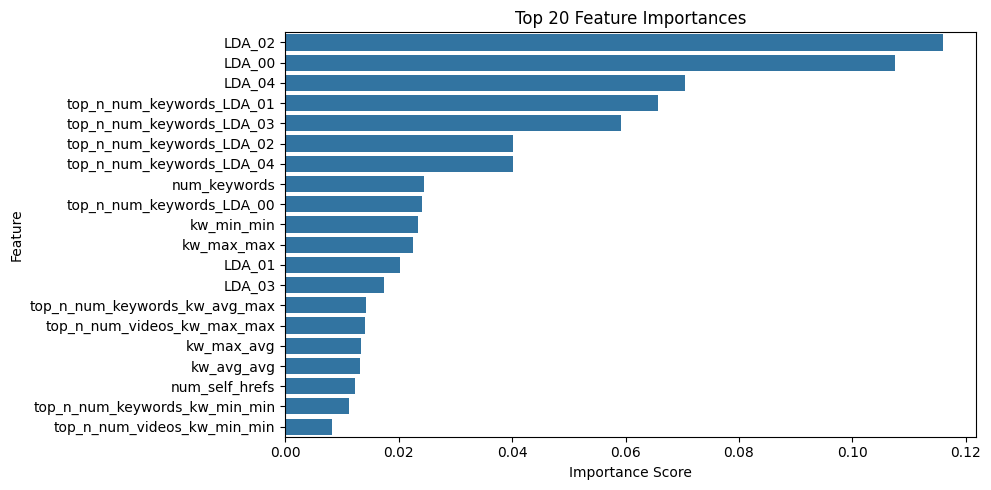

In [ ]:
# input: df_feature_importance_base (either from current session or if unavailable, load from saved csv file)
# output: new columns that are equal to num_keywords multiplied by the top 20 features from the base xgb model
# Try using several features with low correlation to other features

n_features = 20
df_sup_cl.drop(columns=[col for col in df_sup_cl if col.startswith("top_n_")], inplace=True)
print(df_sup_cl.shape)

try:
  df_feature_importance_base.shape
except NameError:
  df_feature_importance_base = pd.read_csv("feature_contrib_xgb_base.csv")

top_n_features = df_feature_importance_base["feature"].head(n_features).to_list()

# add new columns to df_sup_cl using product of df_sup_cl["num_keywords"] and df_sup_cl values of the top 20 feature values from df_feature_importance
top_n_new_num_keywords_features = [f"top_n_num_keywords_{col}" for col in top_n_features]
df_sup_cl[top_n_new_num_keywords_features] = df_sup_cl[top_n_features].multiply(df_sup_cl["num_keywords"], axis="index")

# add similar features for num_videos column
top_n_new_num_videos_features = [f"top_n_num_videos_{col}" for col in top_n_features]
df_sup_cl[top_n_new_num_videos_features] = df_sup_cl[top_n_features].multiply(df_sup_cl["num_videos"], axis="index")

# add similar features for kw_max_avg column
# top_n_new_kw_max_avg_features = [f"top_n_kw_max_avg_{col}" for col in top_n_features]
# df_sup_cl[top_n_new_kw_max_avg_features] = df_sup_cl[top_n_features].multiply(df_sup_cl["kw_max_avg"], axis="index")

# for n_non_stop_words, num_videos, min_positive_polarity, create similar new features
# num_self_hrefs did not improve score
# add similar features for min_positive_polarity column (did not improve score)

print(df_sup_cl.shape)

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    # all_features = features_cl_orig + top_n_new_num_keywords_features,  # Test acc 0.8953
    # all_features = features_cl_orig + top_n_new_num_videos_features,  # Test acc 0.8754
    # all_features = features_cl_orig + top_n_new_kw_max_avg_features,  # Test acc 0.8724
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features, # Test acc 0.8962
    # all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + top_n_new_kw_max_avg_features, # Test acc 0.8962
    # all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + top_n_new_min_positive_polarity_features, # Test acc 0.8903
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20)

In [ ]:
top_n_new_num_keywords_features = [col for col in df_sup_cl.columns if col.startswith("top_n_num_keywords_")]
top_n_new_num_videos_features = [col for col in df_sup_cl.columns if col.startswith("top_n_num_videos_")]

Input data - shape: (39644, 107)
Preprocessed data - shape: (39644, 107)
Train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 92), (7929, 92)
Training models: ['xgb']

2025-06-14 01:22:32.358674
Model: xgb
Final train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
	CV Accuracy: Mean = 0.8841, Std = 0.0020
	CV Precision_macro: Mean = 0.8764, Std = 0.0031
	CV Recall_macro: Mean = 0.8629, Std = 0.0019
	CV F1_macro: Mean = 0.8685, Std = 0.0020
	CV Neg_log_loss: Mean = -0.3036, Std = 0.0095
	CV Roc_auc_ovr: Mean = 0.9883, Std = 0.0007
	CV Roc_auc_ovo: Mean = 0.9870, Std = 0.0008
Classification Report:
              precision    recall  f1-score   support

           0       0.88   

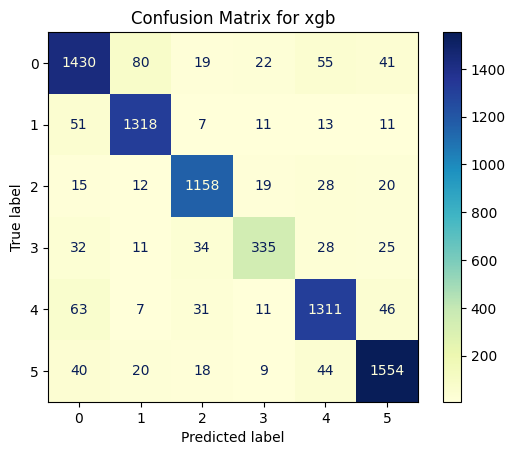

Test Accuracy: 0.8962
Test Precision: 0.8877
Test Recall: 0.8771
Test F1: 0.8818
Test Log Loss: 0.2780
Test ROC AUC (ovr): 0.9903
Test ROC AUC (ovo): 0.9891
Feature Importances:
                          feature  importance
33                         LDA_02    0.115952
31                         LDA_00    0.107426
35                         LDA_04    0.070485
56      top_n_num_keywords_LDA_01    0.065727
55      top_n_num_keywords_LDA_03    0.059234
52      top_n_num_keywords_LDA_02    0.040240
53      top_n_num_keywords_LDA_04    0.040111
10                   num_keywords    0.024475
54      top_n_num_keywords_LDA_00    0.024181
11                     kw_min_min    0.023334
15                     kw_max_max    0.022500
32                         LDA_01    0.020178
34                         LDA_03    0.017461
62  top_n_num_keywords_kw_avg_max    0.014302
77    top_n_num_videos_kw_max_max    0.014142
18                     kw_max_avg    0.013381
19                     kw_avg_avg    0.0

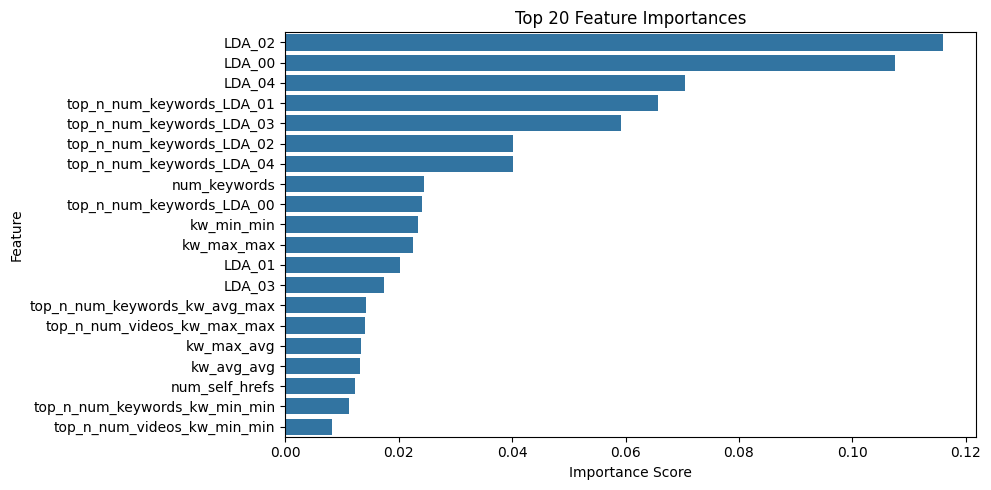

In [ ]:
# show classification report for the best model
trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features, # Test acc 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

In [ ]:
# This is the best performing model so far, save the data

with open("xgb_enh.pkl", "wb") as f:
  pickle.dump((trained_models_enh, cv_summary_enh, test_summary_enh), f)

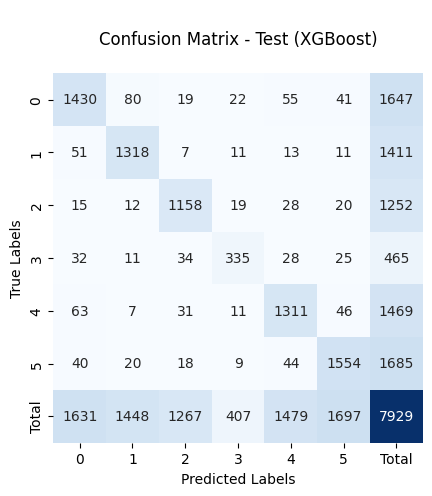

In [ ]:
# display confusion matrix
y_pred = trained_models_enh["xgb"]["y_pred"]
y_test = trained_models_enh["xgb"]["y_test"]

cm = confusion_matrix(y_test, y_pred)

# Convert to Pandas DataFrame
df_cm = pd.DataFrame(cm)
# Calculate row totals
df_cm['Total'] = df_cm.sum(axis=1)
# Calculate column totals
df_cm.loc['Total'] = df_cm.sum(axis=0)

sns.heatmap(df_cm, annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"fontsize":10}, square=True)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("\nConfusion Matrix - Test (XGBoost)\n")
plt.show()

In [ ]:
# Since the LDA terms are the top features, let's add combinations of 2,3,4 of the LDA columns (lda_cols) as new features

from itertools import combinations

df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("combined_LDA_")], inplace=True)
df_sup_cl.shape

# add combinations of 2-4 columns from lda_cols to df_sup_cl
for i in range(2,5):
  for combination in combinations(lda_cols, i):
    new_col_name = "combined_" + "_".join(combination)
    df_sup_cl[new_col_name] = df_sup_cl[list(combination)].sum(axis=1)

print(df_sup_cl.shape)
print(df_sup_cl.columns)

(39644, 132)
Index(['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
       'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens',
       'num_hrefs', 'num_self_hrefs', 'num_imgs',
       ...
       'combined_LDA_00_LDA_03_LDA_04', 'combined_LDA_01_LDA_02_LDA_03',
       'combined_LDA_01_LDA_02_LDA_04', 'combined_LDA_01_LDA_03_LDA_04',
       'combined_LDA_02_LDA_03_LDA_04', 'combined_LDA_00_LDA_01_LDA_02_LDA_03',
       'combined_LDA_00_LDA_01_LDA_02_LDA_04',
       'combined_LDA_00_LDA_01_LDA_03_LDA_04',
       'combined_LDA_00_LDA_02_LDA_03_LDA_04',
       'combined_LDA_01_LDA_02_LDA_03_LDA_04'],
      dtype='object', length=132)


Input data - shape: (39644, 132)
Preprocessed data - shape: (39644, 132)
Train, test split - shape: (31715, 117), (31715,), (7929, 117), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 117), (7929, 117)
Training models: ['xgb', 'RandomForest']

2025-06-14 01:57:52.936440
Model: xgb
Final train, test split - shape: (31715, 117), (31715,), (7929, 117), (7929,)
	CV Accuracy: Mean = 0.8825, Std = 0.0036
	CV Precision_macro: Mean = 0.8757, Std = 0.0067
	CV Recall_macro: Mean = 0.8617, Std = 0.0038
	CV F1_macro: Mean = 0.8675, Std = 0.0044
	CV Neg_log_loss: Mean = -0.3067, Std = 0.0110
	CV Roc_auc_ovr: Mean = 0.9882, Std = 0.0008
	CV Roc_auc_ovo: Mean = 0.9869, Std = 0.0008
Classification Report:
              precision    recall  f1-score   support

    

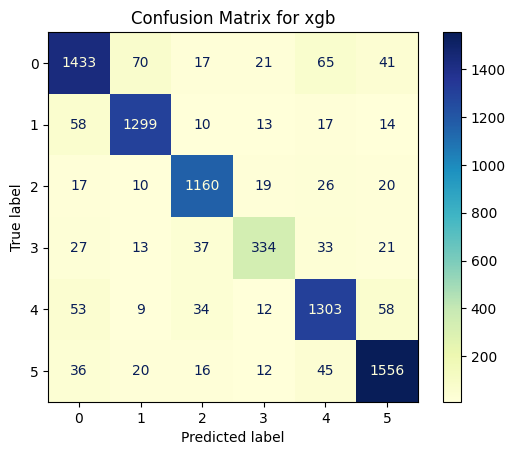

Test Accuracy: 0.8936
Test Precision: 0.8841
Test Recall: 0.8743
Test F1: 0.8787
Test Log Loss: 0.2829
Test ROC AUC (ovr): 0.9900
Test ROC AUC (ovo): 0.9888
Feature Importances:
                                  feature  importance
112  combined_LDA_00_LDA_01_LDA_02_LDA_03    0.119490
31                                 LDA_00    0.110798
33                                 LDA_02    0.100152
114  combined_LDA_00_LDA_01_LDA_03_LDA_04    0.051423
35                                 LDA_04    0.046297
97                 combined_LDA_01_LDA_03    0.041407
56              top_n_num_keywords_LDA_01    0.035929
55              top_n_num_keywords_LDA_03    0.032756
52              top_n_num_keywords_LDA_02    0.025969
53              top_n_num_keywords_LDA_04    0.023396
106         combined_LDA_00_LDA_02_LDA_04    0.022036
102         combined_LDA_00_LDA_01_LDA_02    0.020898
116  combined_LDA_01_LDA_02_LDA_03_LDA_04    0.017259
54              top_n_num_keywords_LDA_00    0.014890
103         

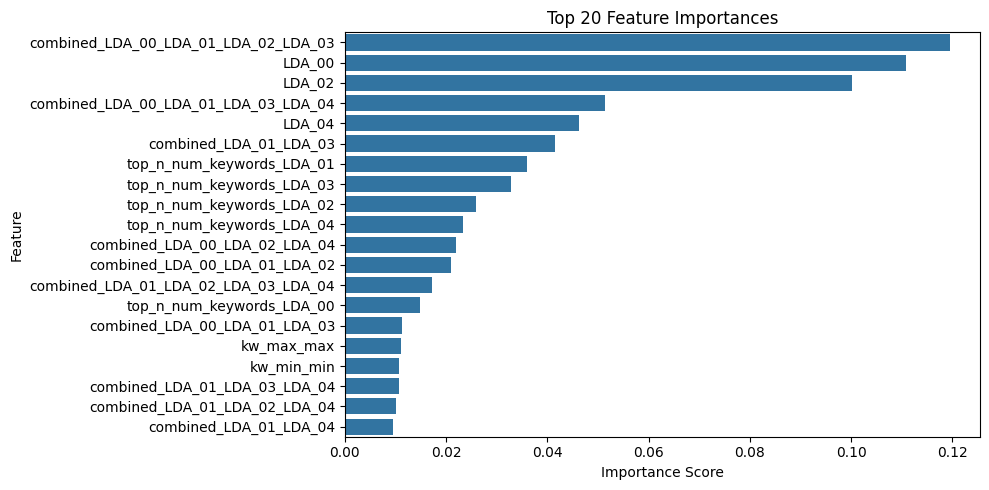


2025-06-14 02:00:19.796530
Model: RandomForest
Final train, test split - shape: (31715, 117), (31715,), (7929, 117), (7929,)
	CV Accuracy: Mean = 0.8252, Std = 0.0038
	CV Precision_macro: Mean = 0.8244, Std = 0.0045
	CV Recall_macro: Mean = 0.7803, Std = 0.0047
	CV F1_macro: Mean = 0.7899, Std = 0.0049
	CV Neg_log_loss: Mean = -0.4838, Std = 0.0065
	CV Roc_auc_ovr: Mean = 0.9730, Std = 0.0013
	CV Roc_auc_ovo: Mean = 0.9699, Std = 0.0014
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.78      0.80      1647
           1       0.88      0.84      0.86      1411
           2       0.82      0.90      0.86      1252
           3       0.80      0.43      0.56       465
           4       0.78      0.88      0.83      1469
           5       0.87      0.90      0.88      1685

    accuracy                           0.83      7929
   macro avg       0.83      0.79      0.80      7929
weighted avg       0.83      0.83      0.83    

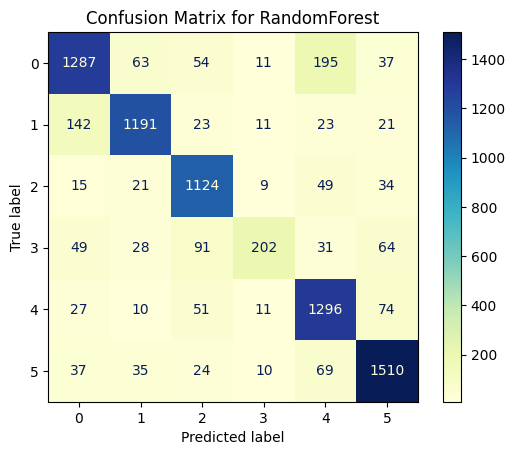

Test Accuracy: 0.8336
Test Precision: 0.8291
Test Recall: 0.7893
Test F1: 0.7994
Test Log Loss: 0.4712
Test ROC AUC (ovr): 0.9754
Test ROC AUC (ovo): 0.9723
Feature Importances:
                                  feature  importance
114  combined_LDA_00_LDA_01_LDA_03_LDA_04    0.057623
100                combined_LDA_02_LDA_04    0.040833
93                 combined_LDA_00_LDA_02    0.037558
33                                 LDA_02    0.037480
52              top_n_num_keywords_LDA_02    0.034304
56              top_n_num_keywords_LDA_01    0.034041
55              top_n_num_keywords_LDA_03    0.032286
95                 combined_LDA_00_LDA_04    0.031911
106         combined_LDA_00_LDA_02_LDA_04    0.031035
103         combined_LDA_00_LDA_01_LDA_03    0.029791
54              top_n_num_keywords_LDA_00    0.028623
116  combined_LDA_01_LDA_02_LDA_03_LDA_04    0.027923
108         combined_LDA_01_LDA_02_LDA_03    0.027327
110         combined_LDA_01_LDA_03_LDA_04    0.024941
97          

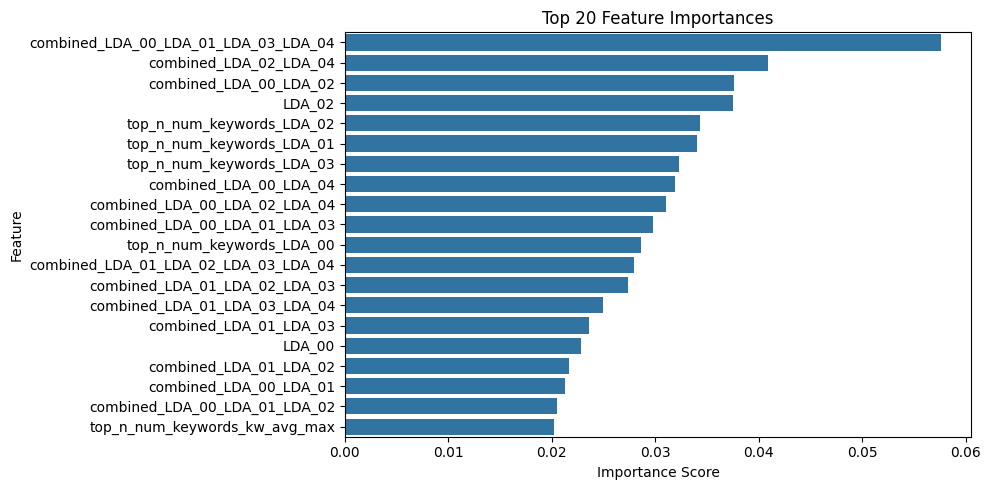

In [ ]:
# Rerun xgb model and Random Forest model training
# use original numeric features except shares, timedelta, channel and data_channel_is_ columns
# + new interaction terms from above

lda_combinations = [col for col in df_sup_cl.columns if col.startswith("combined_LDA_")]

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + lda_combinations, # Test acc 0.8936 xgb, 0.8336 RandomForest
    target_cl=target_cl, models=["xgb","RandomForest"], show_feat_imp=True, top_n=20, show_conf_matrix=True)

Input data - shape: (39644, 132)
Preprocessed data - shape: (39644, 132)
Train, test split - shape: (31715, 31), (31715,), (7929, 31), (7929,)
One-hot encoded features: []
Skew for LDA_00
Skew for LDA_00
Normalized features - shape: (31715, 31), (7929, 31)
Training models: ['xgb']

2025-06-14 02:08:25.864012
Model: xgb
Final train, test split - shape: (31715, 31), (31715,), (7929, 31), (7929,)
	CV Accuracy: Mean = 0.8113, Std = 0.0018
	CV Precision_macro: Mean = 0.7911, Std = 0.0039
	CV Recall_macro: Mean = 0.7757, Std = 0.0021
	CV F1_macro: Mean = 0.7805, Std = 0.0023
	CV Neg_log_loss: Mean = -0.4683, Std = 0.0073
	CV Roc_auc_ovr: Mean = 0.9705, Std = 0.0012
	CV Roc_auc_ovo: Mean = 0.9674, Std = 0.0012
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78      1647
           1       0.84      0.89      0.87      1411
           2       0.82      0.86      0.84      1252
           3       0.68      0.53      0.60    

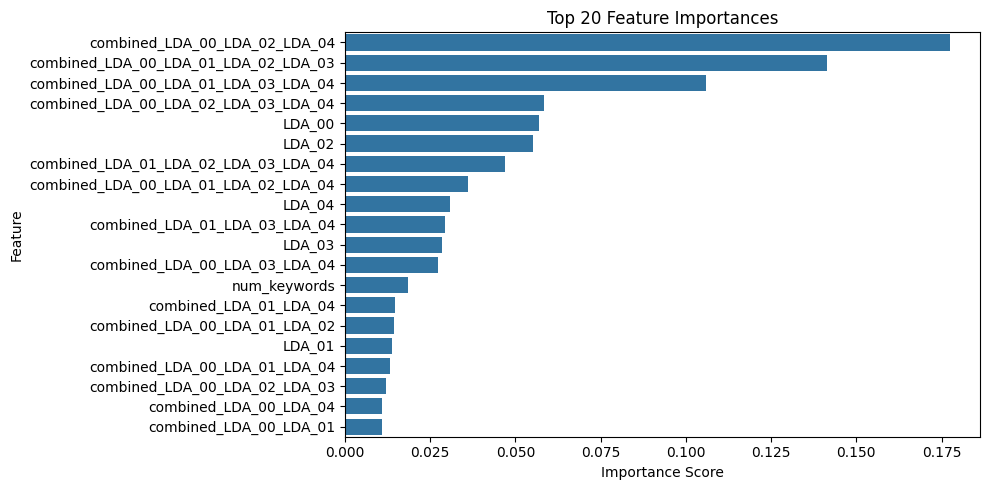

In [ ]:
# What if we train xgboost model with just the LDA columns

lda_combinations = [col for col in df_sup_cl.columns if col.startswith("combined_LDA_")]
# lda_cols are the 5 values from the dataset
imp_features = ["num_keywords", "is_weekend", "kw_max_max", "kw_min_min", "num_imgs", "num_videos", "num_hrefs"]

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    # all_features=lda_cols + lda_combinations, # Test acc 0.8236
    # all_features=lda_cols + lda_combinations + imp_features, # Test acc 0.8319
    all_features=lda_cols + lda_combinations + ["num_keywords"], # Test acc 0.8258
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20)

In [ ]:
df_sup_cl["imgs_per_keyword"] = df_sup_cl["num_imgs"] / df_sup_cl["num_keywords"]
df_sup_cl["videos_per_keyword"] = df_sup_cl["num_videos"] / df_sup_cl["num_keywords"]
df_sup_cl["hrefs_per_keyword"] = df_sup_cl["num_hrefs"] / df_sup_cl["num_keywords"]

exp = 1/3
df_sup_cl["wknd_global_subjectivity"] = df_sup_cl["global_subjectivity"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_global_sentiment_polarity"] = df_sup_cl["global_sentiment_polarity"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_global_rate_positive_words"] = df_sup_cl["global_rate_positive_words"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_global_rate_negative_words"] = df_sup_cl["global_rate_negative_words"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_rate_positive_words"] = df_sup_cl["rate_positive_words"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_rate_negative_words"] = df_sup_cl["rate_negative_words"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_title_subjectivity"] = df_sup_cl["title_subjectivity"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_title_sentiment_polarity"] = df_sup_cl["title_sentiment_polarity"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_abs_title_subjectivity"] = df_sup_cl["abs_title_subjectivity"] ** exp * df_sup_cl["is_weekend"]
df_sup_cl["wknd_abs_title_sentiment_polarity"] = df_sup_cl["abs_title_sentiment_polarity"] ** exp * df_sup_cl["is_weekend"]

addl_cols = [col for col in df_sup_cl.columns if col.startswith("wknd_")] + ["imgs_per_keyword", "videos_per_keyword", "hrefs_per_keyword"]

df_sup_cl.shape

(39644, 145)

Input data - shape: (39644, 145)
Preprocessed data - shape: (39644, 145)
Train, test split - shape: (31715, 130), (31715,), (7929, 130), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 130), (7929, 130)
Training models: ['xgb']

2025-06-14 02:10:38.126193
Model: xgb
Final train, test split - shape: (31715, 130), (31715,), (7929, 130), (7929,)
	CV Accuracy: Mean = 0.8821, Std = 0.0030
	CV Precision_macro: Mean = 0.8746, Std = 0.0055
	CV Recall_macro: Mean = 0.8610, Std = 0.0036
	CV F1_macro: Mean = 0.8666, Std = 0.0039
	CV Neg_log_loss: Mean = -0.3076, Std = 0.0101
	CV Roc_auc_ovr: Mean = 0.9880, Std = 0.0007
	CV Roc_auc_ovo: Mean = 0.9868, Std = 0.0008
Classification Report:
              precision    recall  f1-score   support

           0       0

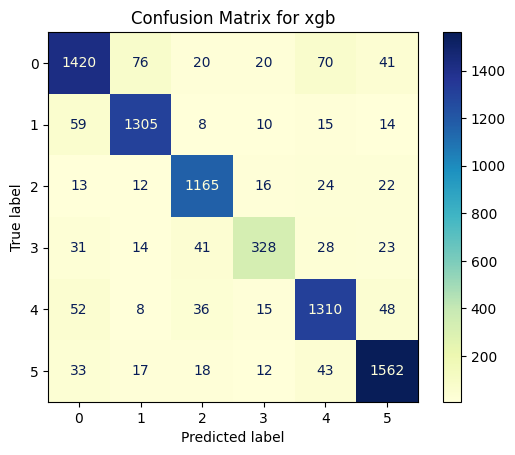

Test Accuracy: 0.8942
Test Precision: 0.8849
Test Recall: 0.8736
Test F1: 0.8785
Test Log Loss: 0.2798
Test ROC AUC (ovr): 0.9905
Test ROC AUC (ovo): 0.9894
Feature Importances:
                                  feature  importance
125  combined_LDA_00_LDA_01_LDA_02_LDA_03    0.141518
31                                 LDA_00    0.105722
33                                 LDA_02    0.101711
127  combined_LDA_00_LDA_01_LDA_03_LDA_04    0.049008
35                                 LDA_04    0.041667
110                combined_LDA_01_LDA_03    0.037182
56              top_n_num_keywords_LDA_01    0.034399
55              top_n_num_keywords_LDA_03    0.030665
52              top_n_num_keywords_LDA_02    0.023338
53              top_n_num_keywords_LDA_04    0.022230
115         combined_LDA_00_LDA_01_LDA_02    0.021453
119         combined_LDA_00_LDA_02_LDA_04    0.020728
129  combined_LDA_01_LDA_02_LDA_03_LDA_04    0.016728
54              top_n_num_keywords_LDA_00    0.014147
15          

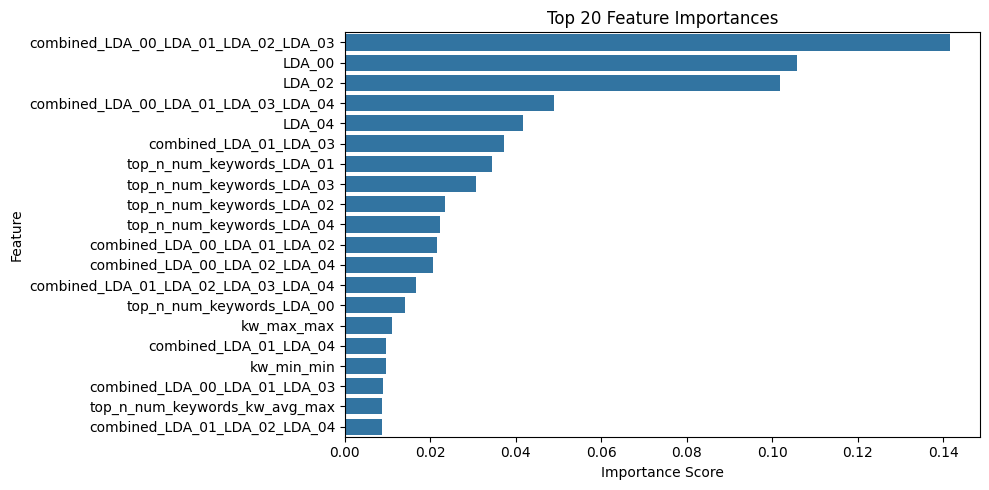

In [ ]:
# xgboost with new features added

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    # all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + addl_cols, # Test acc 0.8941, prev 0.8962
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + addl_cols + lda_combinations, # Test acc 0.8942 prev 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

In [ ]:
# save this dataset
# df_sup_cl.to_pickle("df_sup_cl_enhanced_cl.pkl")

In [ ]:
# reload (for future runs)
df_sup_cl = pd.read_pickle("df_sup_cl_enhanced_cl.pkl")
df_sup_cl.shape

(39644, 145)

Input data - shape: (39644, 209)
Preprocessed data - shape: (39644, 209)
Train, test split - shape: (31715, 156), (31715,), (7929, 156), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 156), (7929, 156)
Training models: ['xgb']

2025-06-14 02:32:34.674134
Model: xgb
Final train, test split - shape: (31715, 156), (31715,), (7929, 156), (7929,)
	CV Accuracy: Mean = 0.8799, Std = 0.0019
	CV Precision_macro: Mean = 0.8736, Std = 0.0036
	CV Recall_macro: Mean = 0.8563, Std = 0.0032
	CV F1_macro: Mean = 0.8632, Std = 0.0030
	CV Neg_log_loss: Mean = -0.3210, Std = 0.0095
	CV Roc_auc_ovr: Mean = 0.9870, Std = 0.0005
	CV Roc_auc_ovo: Mean = 0.9856, Std = 0.0006
Classification Report:
              precision    recall  f1-score   support

           0       0

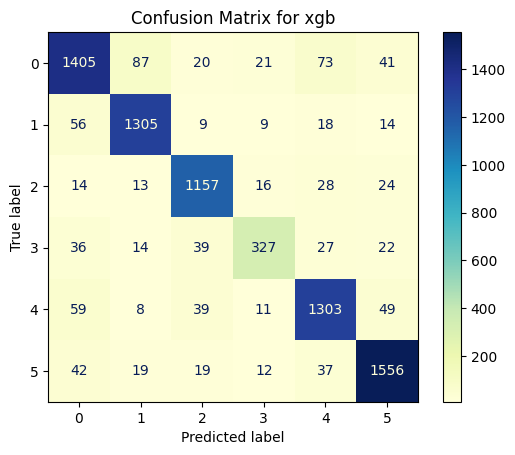

Test Accuracy: 0.8895
Test Precision: 0.8818
Test Recall: 0.8693
Test F1: 0.8746
Test Log Loss: 0.2970
Test ROC AUC (ovr): 0.9892
Test ROC AUC (ovo): 0.9878
Feature Importances:
                          feature  importance
33                         LDA_02    0.112994
31                         LDA_00    0.097899
35                         LDA_04    0.071383
56      top_n_num_keywords_LDA_01    0.061762
55      top_n_num_keywords_LDA_03    0.047753
52      top_n_num_keywords_LDA_02    0.041505
53      top_n_num_keywords_LDA_04    0.033813
54      top_n_num_keywords_LDA_00    0.021549
32                         LDA_01    0.019795
34                         LDA_03    0.017731
11                     kw_min_min    0.015644
10                   num_keywords    0.015389
15                     kw_max_max    0.015333
18                     kw_max_avg    0.013418
19                     kw_avg_avg    0.011978
62  top_n_num_keywords_kw_avg_max    0.011438
6                  num_self_hrefs    0.0

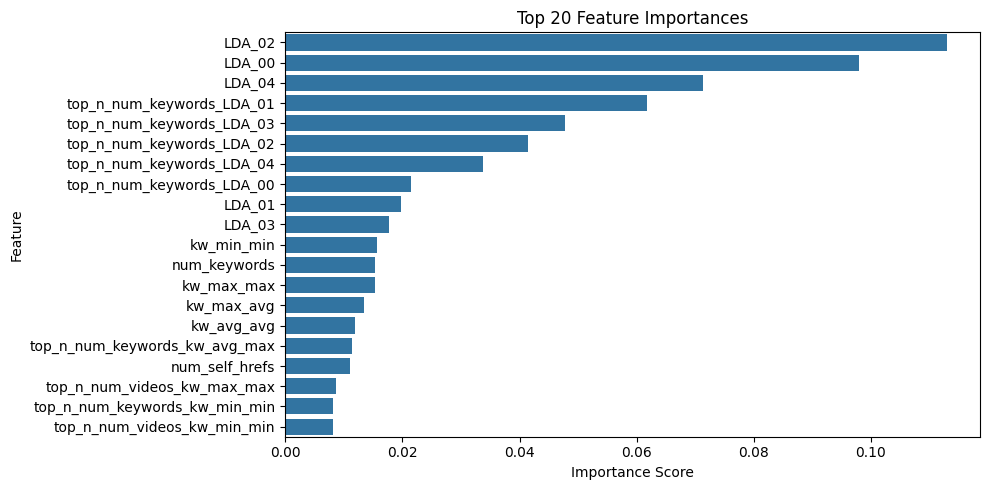

In [ ]:
# Try adding embeddings

df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("title_embedding_") or col.startswith("content_embedding_")], inplace=True)

# add title embeddings to df_sup_cl
df_sup_cl = pd.concat([df_sup_cl, pd.DataFrame(title_embeddings_small, columns=title_embeddings_small_cols)], axis=1)

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + title_embeddings_small_cols, # Test acc 0.8895 prev 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

Input data - shape: (39644, 529)
Preprocessed data - shape: (39644, 529)
Train, test split - shape: (31715, 476), (31715,), (7929, 476), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 476), (7929, 476)
Training models: ['xgb']

2025-06-14 02:40:52.091238
Model: xgb
Final train, test split - shape: (31715, 476), (31715,), (7929, 476), (7929,)
	CV Accuracy: Mean = 0.8737, Std = 0.0024
	CV Precision_macro: Mean = 0.8652, Std = 0.0050
	CV Recall_macro: Mean = 0.8487, Std = 0.0021
	CV F1_macro: Mean = 0.8551, Std = 0.0031
	CV Neg_log_loss: Mean = -0.3391, Std = 0.0070
	CV Roc_auc_ovr: Mean = 0.9860, Std = 0.0005
	CV Roc_auc_ovo: Mean = 0.9843, Std = 0.0006
Classification Report:
              precision    recall  f1-score   support

           0       0

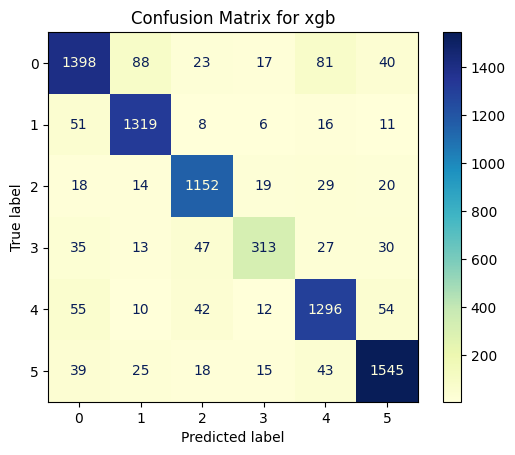

Test Accuracy: 0.8857
Test Precision: 0.8773
Test Recall: 0.8627
Test F1: 0.8686
Test Log Loss: 0.3101
Test ROC AUC (ovr): 0.9882
Test ROC AUC (ovo): 0.9867
Feature Importances:
                          feature  importance
33                         LDA_02    0.091678
31                         LDA_00    0.079376
35                         LDA_04    0.060599
56      top_n_num_keywords_LDA_01    0.040764
55      top_n_num_keywords_LDA_03    0.030210
52      top_n_num_keywords_LDA_02    0.022852
53      top_n_num_keywords_LDA_04    0.017363
32                         LDA_01    0.013419
54      top_n_num_keywords_LDA_00    0.013340
10                   num_keywords    0.012625
34                         LDA_03    0.011837
18                     kw_max_avg    0.009351
77    top_n_num_videos_kw_max_max    0.009093
19                     kw_avg_avg    0.008934
11                     kw_min_min    0.008523
15                     kw_max_max    0.008088
6                  num_self_hrefs    0.0

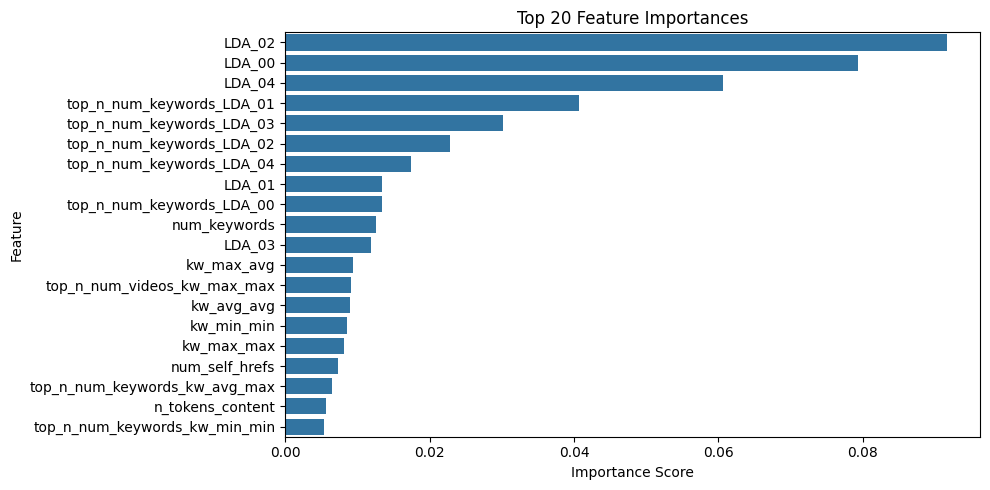

In [ ]:
# Try adding embeddings (full title embeddings)

df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("title_embedding_") or col.startswith("content_embedding_")], inplace=True)

# add title embeddings to df_sup_cl
df_sup_cl = pd.concat([df_sup_cl, pd.DataFrame(title_embeddings, columns=title_embedding_cols)], axis=1)

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + title_embedding_cols, # Test acc 0.8857 prev 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

Input data - shape: (39644, 529)
Preprocessed data - shape: (39644, 529)
Train, test split - shape: (31715, 476), (31715,), (7929, 476), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 476), (7929, 476)
Training models: ['xgb']

2025-06-14 02:58:41.693137
Model: xgb
Final train, test split - shape: (31715, 476), (31715,), (7929, 476), (7929,)
	CV Accuracy: Mean = 0.8747, Std = 0.0031
	CV Precision_macro: Mean = 0.8664, Std = 0.0057
	CV Recall_macro: Mean = 0.8482, Std = 0.0037
	CV F1_macro: Mean = 0.8553, Std = 0.0044
	CV Neg_log_loss: Mean = -0.3361, Std = 0.0100
	CV Roc_auc_ovr: Mean = 0.9862, Std = 0.0009
	CV Roc_auc_ovo: Mean = 0.9846, Std = 0.0010
Classification Report:
              precision    recall  f1-score   support

           0       0

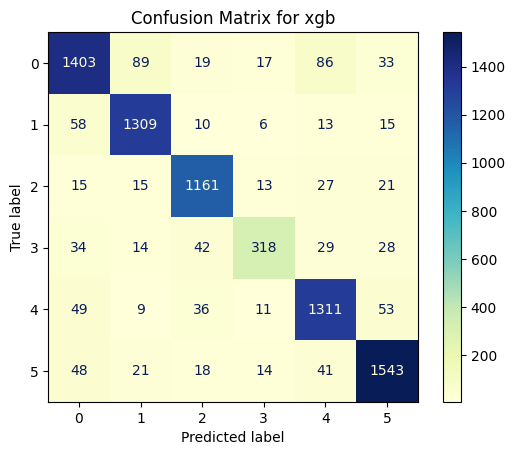

Test Accuracy: 0.8885
Test Precision: 0.8824
Test Recall: 0.8665
Test F1: 0.8730
Test Log Loss: 0.3123
Test ROC AUC (ovr): 0.9880
Test ROC AUC (ovo): 0.9864
Feature Importances:
                          feature  importance
33                         LDA_02    0.092424
31                         LDA_00    0.071414
35                         LDA_04    0.059928
56      top_n_num_keywords_LDA_01    0.040088
55      top_n_num_keywords_LDA_03    0.030933
52      top_n_num_keywords_LDA_02    0.024489
53      top_n_num_keywords_LDA_04    0.017908
54      top_n_num_keywords_LDA_00    0.014119
32                         LDA_01    0.012563
34                         LDA_03    0.011459
10                   num_keywords    0.010607
18                     kw_max_avg    0.009069
19                     kw_avg_avg    0.009037
15                     kw_max_max    0.008649
11                     kw_min_min    0.008185
6                  num_self_hrefs    0.007313
77    top_n_num_videos_kw_max_max    0.0

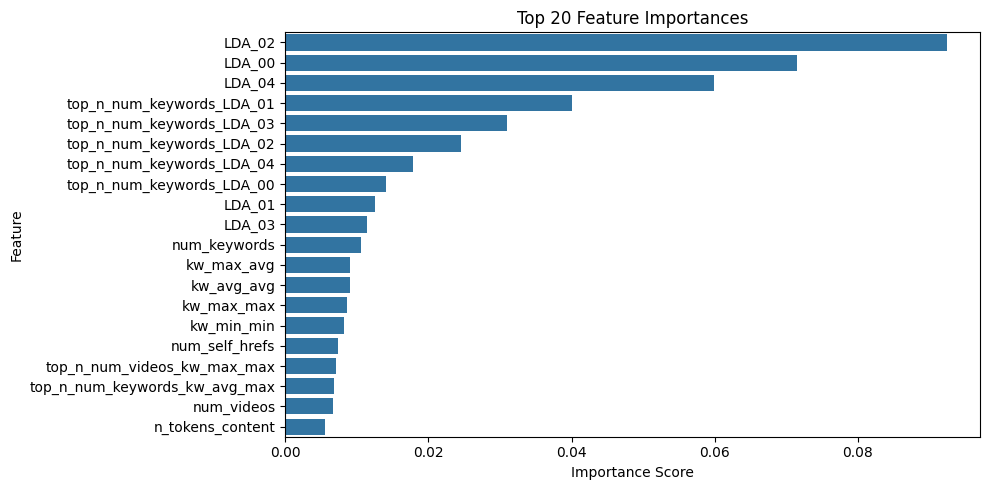

In [ ]:
# Try adding embeddings (content embeddings)

df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("title_embedding_") or col.startswith("content_embedding_")], inplace=True)

# add title embeddings to df_sup_cl
df_sup_cl = pd.concat([df_sup_cl, pd.DataFrame(content_embeddings, columns=content_embedding_cols)], axis=1)

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features + content_embedding_cols, # Test acc 0.8885 prev 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

Input data - shape: (39644, 593)
Preprocessed data - shape: (39644, 593)
Train, test split - shape: (31715, 500), (31715,), (7929, 500), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 500), (7929, 500)
Training models: ['xgb']

2025-06-14 03:19:29.237767
Model: xgb
Final train, test split - shape: (31715, 500), (31715,), (7929, 500), (7929,)
	CV Accuracy: Mean = 0.8476, Std = 0.0030
	CV Precision_macro: Mean = 0.8376, Std = 0.0048
	CV Recall_macro: Mean = 0.8101, Std = 0.0034
	CV F1_macro: Mean = 0.8187, Std = 0.0037
	CV Neg_log_loss: Mean = -0.4212, Std = 0.0134
	CV Roc_auc_ovr: Mean = 0.9779, Std = 0.0017
	CV Roc_auc_ovo: Mean = 0.9753, Std = 0.0018
Classification Report:
              precision    recall  f1-score   support

           0       0

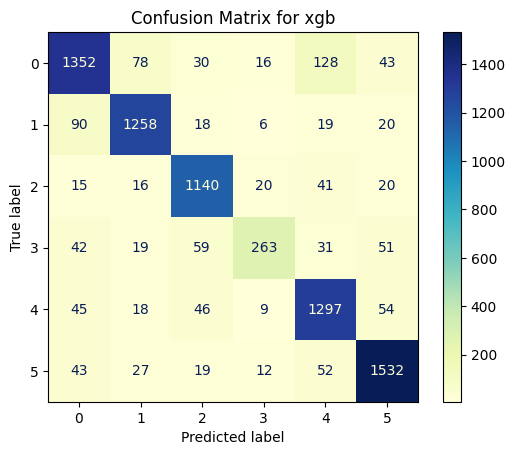

Test Accuracy: 0.8629
Test Precision: 0.8556
Test Recall: 0.8301
Test F1: 0.8391
Test Log Loss: 0.3791
Test ROC AUC (ovr): 0.9819
Test ROC AUC (ovo): 0.9795
Feature Importances:
                       feature  importance
33                      LDA_02    0.055158
35                      LDA_04    0.054634
31                      LDA_00    0.047124
34                      LDA_03    0.029636
32                      LDA_01    0.025618
19                  kw_avg_avg    0.014098
18                  kw_max_avg    0.011891
11                  kw_min_min    0.011513
15                  kw_max_max    0.011378
16                  kw_avg_max    0.008216
6               num_self_hrefs    0.008098
43       min_positive_polarity    0.007426
10                num_keywords    0.007340
1             n_tokens_content    0.006617
17                  kw_min_avg    0.006527
5                    num_hrefs    0.005277
8                   num_videos    0.005230
14                  kw_min_max    0.004932
7    

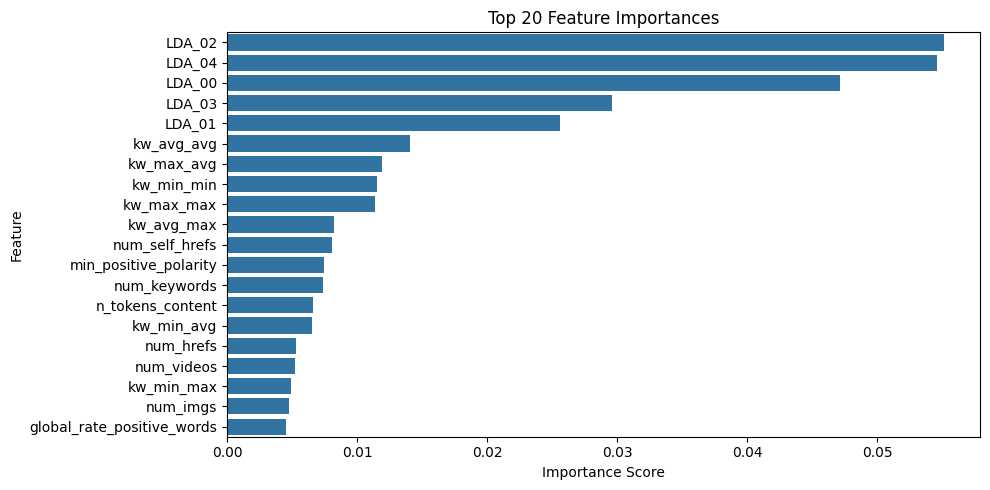

In [ ]:
# Try just embeddings

df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("title_embedding_") or col.startswith("content_embedding_")], inplace=True)

# add title embeddings to df_sup_cl
df_sup_cl = pd.concat([df_sup_cl,
                       pd.DataFrame(content_embeddings, columns=content_embedding_cols),
                       pd.DataFrame(title_embeddings_small, columns=title_embeddings_small_cols)
                       ], axis=1)

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + content_embedding_cols + title_embeddings_small_cols, # Test acc 0.8629 prev 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True)

In [ ]:
df_sup_cl.drop(columns=[col for col in df_sup_cl.columns if col.startswith("title_embedding_") or col.startswith("content_embedding_")], inplace=True)
df_sup_cl.shape

(39644, 145)

#### Best model

In [ ]:
# If running this section directly, setup the df and vars

# reload (for future runs)
df_sup_cl = pd.read_pickle("df_sup_cl_enhanced_cl.pkl")

top_n_new_num_keywords_features = [col for col in df_sup_cl.columns if col.startswith("top_n_num_keywords_")]
top_n_new_num_videos_features = [col for col in df_sup_cl.columns if col.startswith("top_n_num_videos_")]

df_sup_cl.shape

(39644, 145)

Input data - shape: (39644, 145)
Preprocessed data - shape: (39644, 145)
Train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
One-hot encoded features: ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday', 'is_weekend']
Skew for n_tokens_title
Skew for n_tokens_title
Normalized features - shape: (31715, 92), (7929, 92)
Training models: ['xgb']

2025-06-16 15:05:58.708661
Model: xgb
Final train, test split - shape: (31715, 92), (31715,), (7929, 92), (7929,)
	CV Accuracy: Mean = 0.8841, Std = 0.0020
	CV Precision_macro: Mean = 0.8764, Std = 0.0031
	CV Recall_macro: Mean = 0.8629, Std = 0.0019
	CV F1_macro: Mean = 0.8685, Std = 0.0020
	CV Neg_log_loss: Mean = -0.3036, Std = 0.0095
	CV Roc_auc_ovr: Mean = 0.9883, Std = 0.0007
	CV Roc_auc_ovo: Mean = 0.9870, Std = 0.0008
Classification Report:
              precision    recall  f1-score   support

           0       0.88   

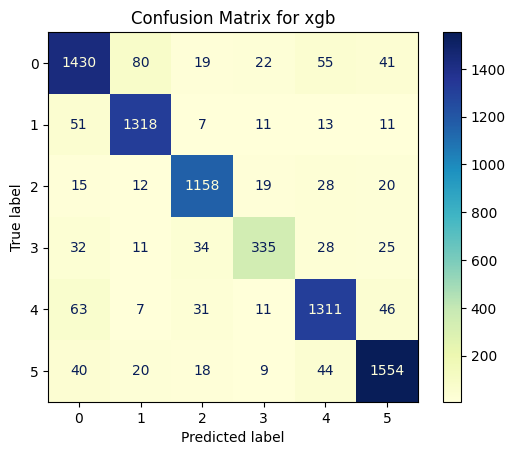

Test Accuracy: 0.8962
Test Precision: 0.8877
Test Recall: 0.8771
Test F1: 0.8818
Test Log Loss: 0.2780
Test ROC AUC (ovr): 0.9903
Test ROC AUC (ovo): 0.9891
Feature Importances:
                          feature  importance
33                         LDA_02    0.115952
31                         LDA_00    0.107426
35                         LDA_04    0.070485
56      top_n_num_keywords_LDA_01    0.065727
55      top_n_num_keywords_LDA_03    0.059234
52      top_n_num_keywords_LDA_02    0.040240
53      top_n_num_keywords_LDA_04    0.040111
10                   num_keywords    0.024475
54      top_n_num_keywords_LDA_00    0.024181
11                     kw_min_min    0.023334
15                     kw_max_max    0.022500
32                         LDA_01    0.020178
34                         LDA_03    0.017461
62  top_n_num_keywords_kw_avg_max    0.014302
77    top_n_num_videos_kw_max_max    0.014142
18                     kw_max_avg    0.013381
19                     kw_avg_avg    0.0

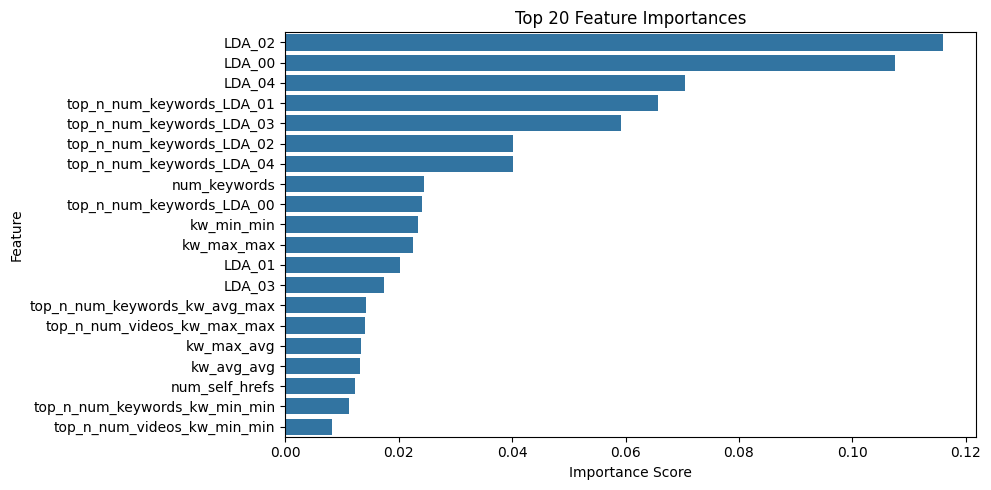

In [ ]:
# xgboost model with the best score so far

trained_models_enh, cv_summary_enh, test_summary_enh = train_classification_model(
    df=df_sup_cl,
    all_features=features_cl_orig + top_n_new_num_keywords_features + top_n_new_num_videos_features, # Test acc 0.8962
    target_cl=target_cl, models=["xgb"], show_feat_imp=True, top_n=20, show_classif_rpt=True, show_conf_matrix=True, return_X_test=True)

In [ ]:
# Save to pickle
# with open("xgb_enh.pkl", "wb") as f:
#     pickle.dump((trained_models_enh, cv_summary_enh, test_summary_enh), f)

# read pickle (for future runs)
with open("xgb_enh.pkl", "rb") as f:
    trained_models_enh, cv_summary_enh, test_summary_enh = pickle.load(f)

In [ ]:
# save best model

best_model = trained_models_enh["xgb"]["model"]
# joblib.dump(best_model, "best_model_cl_xgb_0.pkl")
best_model


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_class=6, num_parallel_tree=None, ...)

In [ ]:
X_train = trained_models_enh["xgb"]["X_train"]
y_train = trained_models_enh["xgb"]["y_train"]
X_test = trained_models_enh["xgb"]["X_test"]
y_test = trained_models_enh["xgb"]["y_test"]
y_pred = trained_models_enh["xgb"]["y_pred"]
y_pred_proba = trained_models_enh["xgb"]["y_pred_proba"]

idx_train = X_train.index
idx_test = X_test.index

print(accuracy_score(y_test, y_pred), accuracy_score(y_test, trained_models_enh["xgb"]["model"].predict(X_test)))

X_train.shape, X_test.shape, y_train.shape, y_test.shape, y_pred.shape, y_pred_proba.shape

0.8962038088031278 0.8962038088031278


((31715, 92), (7929, 92), (31715,), (7929,), (7929,), (7929, 6))

In [ ]:
# what is the top-2 test accuracy?

top_k_accuracy_score(y_test, trained_models_enh["xgb"]["model"].predict_proba(X_test), k=2).round(4)


np.float64(0.9798)

top-2 test accuracy is 0.98

In [ ]:
# does using class weight parameter improve model accuracy?

from sklearn.utils.class_weight import compute_sample_weight
sample_weights = compute_sample_weight(
    class_weight='balanced',
    y=y_train
)

clf_xgb = XGBClassifier(**best_model.get_params(), sample_weight=sample_weights)

# Cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_results = cross_validate(clf_xgb, X_train, y_train, cv=cv, scoring="accuracy", return_train_score=False)

# print metric values for each cross validation
print(cv_results)
for k, v in cv_results.items():
  print(f"{k}: {v.mean():.4f} {v.std():.4f}")

print(X_train.shape, y_train.shape)
# Fit on entire training data and predict on test data
clf_xgb.fit(X_train, y_train)
y_pred = clf_xgb.predict(X_test)

print((accuracy_score(y_test, y_pred)), (accuracy_score(trained_models_enh["xgb"]["y_test"], clf_xgb.predict(trained_models_enh["xgb"]["X_test"]))))
# 0.8962038088031278 with sample_weight (no improvement)

{'fit_time': array([17.40634871, 18.069628  , 16.46742725, 38.46311092, 16.73991179]), 'score_time': array([0.11798263, 0.11963272, 0.11570954, 0.12095332, 0.11298823]), 'test_score': array([0.88759262, 0.88443954, 0.88412423, 0.88239004, 0.88191707])}
fit_time: 21.4293 8.5350
score_time: 0.1175 0.0028
test_score: 0.8841 0.0020
(31715, 92) (31715,)
0.8962038088031278 0.8962038088031278


The model accuracy did not improve when we used the sample_weight hyperparameter.

#### Hyperparameters for the best model

In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 386.6/386.6 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.5/242.5 kB 17.2 MB/s eta 0:00:00


In [ ]:
import optuna

valid_metrics_for_clf=["accuracy"]

def objective(trial):
    params = {
        "objective": "multi:softmax",
        "num_class": 6,
        "tree_method": "hist",
        "use_label_encoder": False,
        "eval_metric": "mlogloss",
        "n_estimators": trial.suggest_int("n_estimators", 100, 500),
        "max_depth": trial.suggest_int("max_depth", 5, 15),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
    }

    model = XGBClassifier(**params, n_jobs=-1, random_state=42)

    # Cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    cv_results = cross_validate(model, X_train, y_train, cv=cv, scoring=valid_metrics_for_clf, return_train_score=False)

    # print metric scores
    for metric in valid_metrics_for_clf:
      cv_scores = cv_results[f"test_{metric}"]
      # print(f"\tCV {metric.capitalize()}: Mean = {np.mean(cv_scores):.4f}, Std = {np.std(cv_scores):.4f}")

    return cv_scores.mean()

study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=25)

print("Best params:", study.best_params)
print("Best CV accuracy:", study.best_value)

# Fit the final model
best_params = study.best_params
best_params.update({
    "objective": "multi:softmax",
    "num_class": 6,
    "tree_method": "hist",
    "use_label_encoder": False,
    "eval_metric": "mlogloss",
    "n_jobs": -1,
    "random_state": 42
})
best_model = XGBClassifier(**best_params)

best_model.fit(X_train, y_train)

y_pred_ = best_model.predict(X_test)
print(f"Test Accuracy: {accuracy_score(y_test, y_pred_):.4f}")

[I 2025-06-14 04:57:02,082] A new study created in memory with name: no-name-6c853ff4-6a85-407e-87f5-36b285b4a000
[I 2025-06-14 05:00:38,441] Trial 0 finished with value: 0.8831152451521362 and parameters: {'n_estimators': 361, 'max_depth': 14, 'learning_rate': 0.08594806683236535, 'subsample': 0.7607508875484865, 'colsample_bytree': 0.8881951912105328, 'gamma': 1.110126878210933}. Best is trial 0 with value: 0.8831152451521362.
[I 2025-06-14 05:02:27,156] Trial 1 finished with value: 0.8840296389720953 and parameters: {'n_estimators': 233, 'max_depth': 5, 'learning_rate': 0.12175985520995843, 'subsample': 0.8445719259388447, 'colsample_bytree': 0.9416252777073935, 'gamma': 1.105391970937215}. Best is trial 1 with value: 0.8840296389720953.
[I 2025-06-14 05:05:03,888] Trial 2 finished with value: 0.8779441904461611 and parameters: {'n_estimators': 339, 'max_depth': 11, 'learning_rate': 0.08580294930284807, 'subsample': 0.99580956984368, 'colsample_bytree': 0.9237415902387758, 'gamma': 

Best params: {'n_estimators': 497, 'max_depth': 11, 'learning_rate': 0.0337566167874433, 'subsample': 0.6899447303781147, 'colsample_bytree': 0.9020563060906003, 'gamma': 0.4282838097398176}
Best CV accuracy: 0.8867728204319721
Test Accuracy: 0.8942


In [ ]:
# joblib.dump(best_model, "best_model_cl_xgb_1.pkl")

best_model = joblib.load("best_model_cl_xgb_1.pkl")
best_model


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9020563060906003, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='mlogloss', feature_types=None,
              gamma=0.4282838097398176, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.0337566167874433,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=11, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=497, n_jobs=-1, num_class=6,
              num_parallel_tree=None, ...)

#### Ablation studies

In [ ]:
# load the feature importances of the best model so far

try:
  feat_imp_xgb = trained_models_enh["xgb"]["feat_imp"]
except NameError:
  with open("xgb_enh.pkl", "rb") as f:
    trained_models_enh, cv_summary_enh, test_summary_enh = pickle.load(f)
    feat_imp_xgb = trained_models_enh["xgb"]["feat_imp"]

feat_imp_xgb.shape

(92, 2)

In [ ]:
X_train = trained_models_enh["xgb"]["X_train"]
y_train = trained_models_enh["xgb"]["y_train"]
X_test = trained_models_enh["xgb"]["X_test"]
y_test = trained_models_enh["xgb"]["y_test"]
y_pred = trained_models_enh["xgb"]["y_pred"]
y_pred_proba = trained_models_enh["xgb"]["y_pred_proba"]

idx_train = X_train.index
idx_test = X_test.index

print(accuracy_score(y_test, y_pred), accuracy_score(y_test, trained_models_enh["xgb"]["model"].predict(X_test)))

best_model = trained_models_enh["xgb"]["model"]
X_train.shape, X_test.shape, y_train.shape, y_test.shape, y_pred.shape, y_pred_proba.shape

0.8962038088031278 0.8962038088031278


((31715, 92), (7929, 92), (31715,), (7929,), (7929,), (7929, 6))

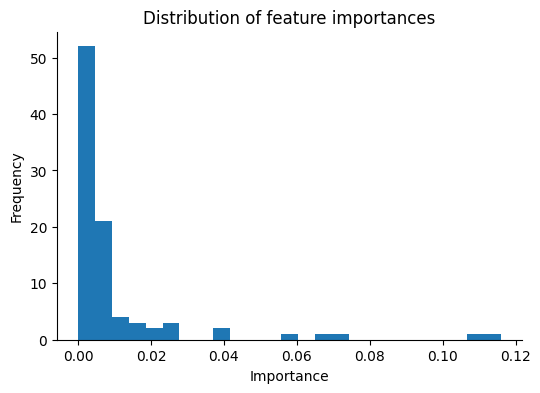

In [ ]:
figsize = (6, 4)
plt.figure(figsize=figsize)
feat_imp_xgb['importance'].plot(kind='hist', bins=25, title='importance')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.title("Distribution of feature importances")
plt.xlabel("Importance")
plt.ylabel("Frequency")
plt.show()

In [ ]:
def evaluate_ablation(X_train, y_train, X_test, y_test, drop_features=[], model=XGBClassifier(use_label_encoder=False, eval_metric="mlogloss")):

  X_train_ab = X_train.drop(columns=drop_features, axis=1)
  X_test_ab = X_test.drop(columns=drop_features, axis=1)

  model.fit(X_train_ab, y_train)

  y_pred = model.predict(X_test_ab)
  top1_acc = accuracy_score(y_test, y_pred)
  top2_acc = top_k_accuracy_score(y_test, model.predict_proba(X_test_ab), k=2)

  return top1_acc, top2_acc

def get_ablation_results(X_train, y_train, X_test, y_test, features, model=XGBClassifier(use_label_encoder=False, eval_metric="mlogloss"), grouped=False):

  results = []
  base_top1, base_top2 = evaluate_ablation(X_train, y_train, X_test, y_test, drop_features=[], model=model)
  print(f"Base model top1 and top2 accuracies: {base_top1:.4f}, {base_top2:.4f}")
  results.append({
      "feature_dropped": "None",
      "top1_accuracy": base_top1,
      "top2_accuracy": base_top2
  })

  if grouped:
    print(f"\nEvaluating ablation studies")
    top1, top2 = evaluate_ablation(X_train, y_train, X_test, y_test, drop_features=features, model=model)
    print(f"... feature dropped: {features}  top1 accuracy: {top1}  top2 accuracy: {top2}")
    results.append({
        "feature_dropped": features,
        "top1_accuracy": top1,
        "top2_accuracy": top2
    })
  else:
    print(f"\nEvaluating ablation studies- {len(features)} features...")
    for f in features:
      top1, top2 = evaluate_ablation(X_train, y_train, X_test, y_test, drop_features=[f], model=model)
      print(f"... feature dropped: {f}  top1 accuracy: {top1}  top2 accuracy: {top2}")
      results.append({
          "feature_dropped": f,
          "top1_accuracy": top1,
          "top2_accuracy": top2
      })

  if len(results) == 0:
    return pd.DataFrame(columns=["feature_dropped", "top1_accuracy", "top2_accuracy"])
  else:
    return pd.DataFrame(results).sort_values(by="top1_accuracy")


In [ ]:
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='mlogloss',
              feature_types=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=-1, num_class=6, num_parallel_tree=None, ...)

In [ ]:
# Try removing the top 20 and bottom 20 features and see how it impacts top-1 and top-2 accuracies of the best model

k = 20
top_features = feat_imp_xgb["feature"].head(k).tolist()
bottom_features = feat_imp_xgb["feature"].tail(k).tolist()
features_to_remove = top_features + bottom_features

df_ablation_results = get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model)
df_ablation_results.shape


Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies- 40 features...
... feature dropped: LDA_02  top1 accuracy: 0.8926724681548746  top2 accuracy: 0.97982091058141
... feature dropped: LDA_00  top1 accuracy: 0.8921679909194098  top2 accuracy: 0.9796947912725438
... feature dropped: LDA_04  top1 accuracy: 0.8945642577878673  top2 accuracy: 0.9799470298902762
... feature dropped: top_n_num_keywords_LDA_01  top1 accuracy: 0.887627695800227  top2 accuracy: 0.9789380754193467
... feature dropped: top_n_num_keywords_LDA_03  top1 accuracy: 0.8897717240509522  top2 accuracy: 0.9764156892420229
... feature dropped: top_n_num_keywords_LDA_02  top1 accuracy: 0.8920418716105436  top2 accuracy: 0.9779291209484172
... feature dropped: top_n_num_keywords_LDA_04  top1 accuracy: 0.8898978433598184  top2 accuracy: 0.9781813595661496
... feature dropped: num_keywords  top1 accuracy: 0.8962038088031278  top2 accuracy: 0.97982091058141
... feature dropped: top_n_num_keywords_LD

(41, 3)

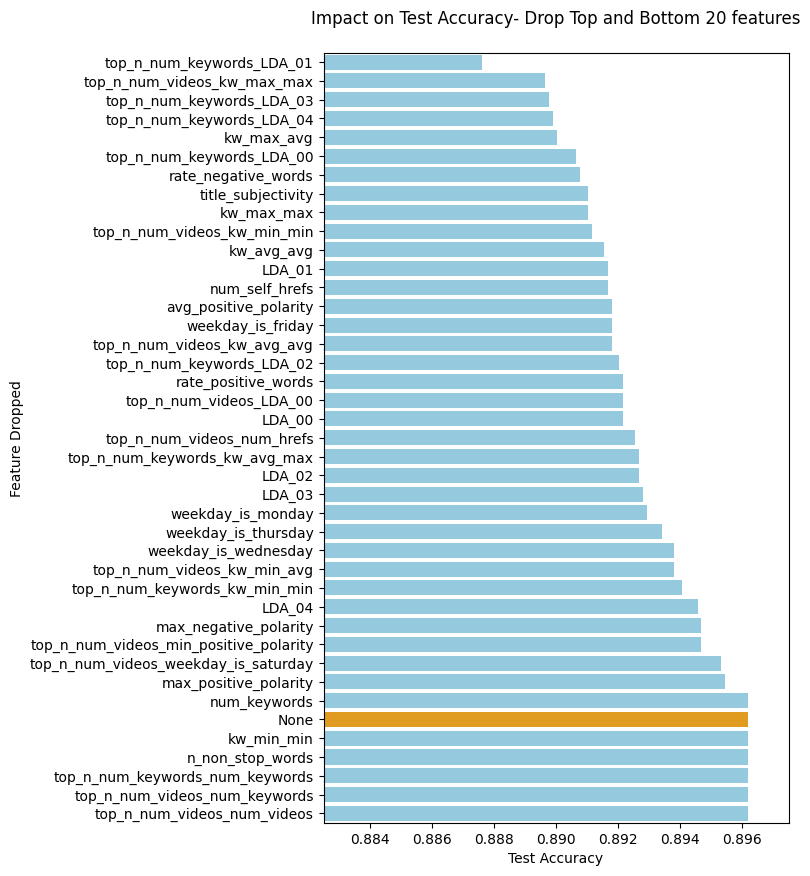

In [ ]:
plt.figure(figsize=(6, 10))
colors = ["orange" if str(val) == "None" else "skyblue" for val in df_ablation_results["feature_dropped"]]

sns.barplot(data=df_ablation_results, x="top1_accuracy", y="feature_dropped", palette=colors)
plt.title(f"Impact on Test Accuracy- Drop Top and Bottom {k} features\n")
plt.xlim(0.8825, 0.8975)
plt.xlabel("Test Accuracy")
plt.ylabel("Feature Dropped")
plt.show()

In [ ]:
# what happens if we drop the bottom 6 columns from the chart as a group

features_to_remove = df_ablation_results.loc[(df_ablation_results["top1_accuracy"] >= 0.896) & (df_ablation_results["feature_dropped"] != "None"), "feature_dropped"].to_list()
get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model, grouped=True)


Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies
... feature dropped: ['num_keywords', 'kw_min_min', 'n_non_stop_words', 'top_n_num_keywords_num_keywords', 'top_n_num_videos_num_keywords', 'top_n_num_videos_num_videos']  top1 accuracy: 0.8940597805524025  top2 accuracy: 0.9795686719636776


,feature_dropped,top1_accuracy,top2_accuracy
1,"[num_keywords, kw_min_min, n_non_stop_words, top_n_num_keywords_num_keywords, top_n_num_videos_n...",0.894060,0.979569
0,None,0.896204,0.979821


In [ ]:
# what happens if we drop the bottom 6 columns from the chart as a group

features_to_remove = df_ablation_results.loc[(df_ablation_results["top1_accuracy"] >= 0.896) & (df_ablation_results["feature_dropped"] != "None"), "feature_dropped"].to_list()
get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model, grouped=True)


Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies
... feature dropped: ['num_keywords', 'kw_min_min', 'n_non_stop_words', 'top_n_num_keywords_num_keywords', 'top_n_num_videos_num_keywords', 'top_n_num_videos_num_videos']  top1 accuracy: 0.8940597805524025  top2 accuracy: 0.9795686719636776


,feature_dropped,top1_accuracy,top2_accuracy
1,"[num_keywords, kw_min_min, n_non_stop_words, top_n_num_keywords_num_keywords, top_n_num_videos_n...",0.894060,0.979569
0,None,0.896204,0.979821


In [ ]:
feat_imp_xgb.describe()

,importance
count,92.000000
mean,0.010870
std,0.019752
min,0.000000
25%,0.003138
50%,0.004093
75%,0.007779
max,0.115952


In [ ]:
# what happens if we remove around 50% of the features?

features_to_remove = feat_imp_xgb.loc[(feat_imp_xgb["importance"] <= 0.0045), "feature"].to_list()
print(f"Removing {len(features_to_remove)} features (as a single group)...")
get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model, grouped=True)

Removing 52 features (as a single group)...
Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies
... feature dropped: ['weekday_is_saturday', 'global_subjectivity', 'top_n_num_videos_LDA_01', 'top_n_num_videos_num_self_hrefs', 'global_rate_positive_words', 'min_negative_polarity', 'top_n_num_videos_LDA_02', 'top_n_num_keywords_min_positive_polarity', 'top_n_num_keywords_kw_min_avg', 'global_sentiment_polarity', 'top_n_num_videos_num_imgs', 'kw_max_min', 'top_n_num_videos_kw_min_max', 'self_reference_min_shares', 'n_non_stop_unique_tokens', 'kw_avg_min', 'n_unique_tokens', 'global_rate_negative_words', 'weekday_is_tuesday', 'top_n_num_keywords_weekday_is_saturday', 'self_reference_max_shares', 'self_reference_avg_sharess', 'title_sentiment_polarity', 'average_token_length', 'top_n_num_keywords_num_hrefs', 'n_tokens_title', 'abs_title_sentiment_polarity', 'top_n_num_videos_LDA_04', 'top_n_num_videos_kw_avg_max', 'is_weekend', 'abs_title_subjectivity', 'avg_neg

,feature_dropped,top1_accuracy,top2_accuracy
1,"[weekday_is_saturday, global_subjectivity, top_n_num_videos_LDA_01, top_n_num_videos_num_self_hr...",0.892672,0.979821
0,None,0.896204,0.979821


In [ ]:
# what is the effect of removing around 40 features?

features_to_remove = feat_imp_xgb.loc[(feat_imp_xgb["importance"] <= 0.004), "feature"].to_list()
print(f"Removing {len(features_to_remove)} features (as a single group)...")
get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model, grouped=True)

Removing 43 features (as a single group)...
Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies
... feature dropped: ['global_sentiment_polarity', 'top_n_num_videos_num_imgs', 'kw_max_min', 'top_n_num_videos_kw_min_max', 'self_reference_min_shares', 'n_non_stop_unique_tokens', 'kw_avg_min', 'n_unique_tokens', 'global_rate_negative_words', 'weekday_is_tuesday', 'top_n_num_keywords_weekday_is_saturday', 'self_reference_max_shares', 'self_reference_avg_sharess', 'title_sentiment_polarity', 'average_token_length', 'top_n_num_keywords_num_hrefs', 'n_tokens_title', 'abs_title_sentiment_polarity', 'top_n_num_videos_LDA_04', 'top_n_num_videos_kw_avg_max', 'is_weekend', 'abs_title_subjectivity', 'avg_negative_polarity', 'rate_positive_words', 'avg_positive_polarity', 'top_n_num_videos_kw_min_avg', 'max_positive_polarity', 'top_n_num_videos_LDA_00', 'title_subjectivity', 'weekday_is_monday', 'max_negative_polarity', 'top_n_num_videos_kw_avg_avg', 'top_n_num_videos_nu

,feature_dropped,top1_accuracy,top2_accuracy
1,"[global_sentiment_polarity, top_n_num_videos_num_imgs, kw_max_min, top_n_num_videos_kw_min_max, ...",0.893303,0.979443
0,None,0.896204,0.979821


In [ ]:
# what happens if we keep only the top 20 or so features

features_to_remove = feat_imp_xgb.loc[(feat_imp_xgb["importance"] <= 0.0077), "feature"].to_list()
print(f"Removing {len(features_to_remove)} features (as a single group)...")
get_ablation_results(X_train, y_train, X_test, y_test, features_to_remove, model=best_model, grouped=True)

Removing 68 features (as a single group)...
Base model top1 and top2 accuracies: 0.8962, 0.9798

Evaluating ablation studies
... feature dropped: ['top_n_num_keywords_kw_min_max', 'top_n_num_keywords_kw_max_max', 'num_videos', 'top_n_num_keywords_num_self_hrefs', 'top_n_num_videos_kw_max_avg', 'top_n_num_keywords_num_imgs', 'top_n_num_keywords_kw_max_avg', 'top_n_num_keywords_n_tokens_content', 'num_hrefs', 'top_n_num_videos_LDA_03', 'kw_min_max', 'top_n_num_keywords_num_videos', 'num_imgs', 'weekday_is_sunday', 'top_n_num_keywords_kw_avg_avg', 'top_n_num_videos_n_tokens_content', 'weekday_is_saturday', 'global_subjectivity', 'top_n_num_videos_LDA_01', 'top_n_num_videos_num_self_hrefs', 'global_rate_positive_words', 'min_negative_polarity', 'top_n_num_videos_LDA_02', 'top_n_num_keywords_min_positive_polarity', 'top_n_num_keywords_kw_min_avg', 'global_sentiment_polarity', 'top_n_num_videos_num_imgs', 'kw_max_min', 'top_n_num_videos_kw_min_max', 'self_reference_min_shares', 'n_non_stop_u

,feature_dropped,top1_accuracy,top2_accuracy
1,"[top_n_num_keywords_kw_min_max, top_n_num_keywords_kw_max_max, num_videos, top_n_num_keywords_nu...",0.890276,0.980073
0,None,0.896204,0.979821


#### Learning curves

In [ ]:
# load the model with the best performance metrics so far and the dataset

df_sup_cl = pd.read_pickle("df_sup_cl_enhanced_cl.pkl")

# load  data from pkl file created from best xgb model
with open("xgb_enh.pkl", "rb") as f:
  xgb_model_enh, train_metrics_xgb, test_metrics_xgb = pickle.load(f)

print(df_sup_cl.shape)

X_train = xgb_model_enh["xgb"]["X_train"]
y_train = xgb_model_enh["xgb"]["y_train"]
X_test = xgb_model_enh["xgb"]["X_test"]
y_test = xgb_model_enh["xgb"]["y_test"]
y_pred = xgb_model_enh["xgb"]["y_pred"]
y_pred_proba = xgb_model_enh["xgb"]["y_pred_proba"]

idx_train = X_train.index
idx_test = X_test.index

xgb_final = xgb_model_enh["xgb"]["model"]

print(accuracy_score(y_test, y_pred))
print(accuracy_score(y_test, xgb_final.predict(X_test)))

X_train.shape, X_test.shape, y_train.shape, y_test.shape, y_pred.shape, y_pred_proba.shape

(39644, 145)
0.8962038088031278
0.8962038088031278


((31715, 92), (7929, 92), (31715,), (7929,), (7929,), (7929, 6))

In [ ]:
# use best_model (xgb_final from previous cell)
# fit training data in increments of 3500
# split X_train, y_train
random_state = 42
training_results = []

for train_size in np.arange(0.099, 1.000, 0.1):
  print(f"train_size = {train_size.round(3)}")
  test_size = 1 - train_size
  xgb_ = xgb_final
  X_train_, _, y_train_, _ = train_test_split(
      X_train, y_train, test_size=test_size.round(3), stratify=y_train, random_state=random_state)
  # print(f"X_train.shape = {X_train_.shape}, y_train_.shape = {y_train_.shape}")
  sample_size = X_train_.shape[0]

  # Cross-validation
  cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  cv_results = cross_validate(xgb_, X_train_, y_train_, cv=cv, scoring="accuracy", return_train_score=False)
  cv_mean, cv_std = np.mean(cv_results["test_score"]), np.std(cv_results["test_score"])

  xgb_.fit(X_train_, y_train_)
  # use original X_test, y_test for test score
  test_accuracy = accuracy_score(y_test, xgb_.predict(X_test))
  print(f"sample size: {sample_size} training score- mean: {cv_mean} std: {cv_std} test accuracy: {test_accuracy}")

  training_results.append({"sample_size": sample_size,
                           "cv_mean_accuracy": cv_mean,
                           "cv_std_accuracy": cv_std,
                           "test_accuracy": test_accuracy,
                           "feat_importance": xgb_.feature_importances_})

df_learning_results = pd.DataFrame(training_results)


train_size = 0.099
sample size: 3139 training score- mean: 0.8407130304046161 std: 0.015444102067544378 test accuracy: 0.8534493630974902
train_size = 0.199
sample size: 6311 training score- mean: 0.8616707635205589 std: 0.007119880036427103 test accuracy: 0.8650523395131795
train_size = 0.299
sample size: 9482 training score- mean: 0.8690162570703464 std: 0.0059613611126488756 test accuracy: 0.8728717366628831
train_size = 0.399
sample size: 12654 training score- mean: 0.8711873792639258 std: 0.00880426974558607 test accuracy: 0.8772859124731996
train_size = 0.499
sample size: 15825 training score- mean: 0.8731753554502368 std: 0.005096984475216612 test accuracy: 0.884979190314037
train_size = 0.599
sample size: 18997 training score- mean: 0.877717197046314 std: 0.005570127187363627 test accuracy: 0.885609786858368
train_size = 0.699
sample size: 22168 training score- mean: 0.8795562070301255 std: 0.0020371903696558584 test accuracy: 0.888258292344558
train_size = 0.799
sample size: 2

In [ ]:
# with open("df_learning_results_cl.pkl", "wb") as f:
#   pickle.dump(df_learning_results, f)

with open("df_learning_results_cl.pkl", "rb") as f:
  df_learning_results = pickle.load(f)

df_learning_results.shape

(10, 5)

In [ ]:
features = X_train.columns

In [ ]:
def show_feat_imp(idx, feature_names, top_n=20):
  df_importance = pd.DataFrame({
      "feature": feature_names,
      "importance": df_learning_results["feat_importance"][idx]
  })

  # Sort the features by importance in descending order
  df_importance = df_importance.sort_values('importance', ascending=False)
  return df_importance.head(top_n)

l0 = (show_feat_imp(0, features)["feature"]).to_list()
show_feat_imp(0, features)

,feature,importance
31,LDA_00,0.076225
35,LDA_04,0.073908
34,LDA_03,0.072670
33,LDA_02,0.067086
52,top_n_num_keywords_LDA_02,0.055120
56,top_n_num_keywords_LDA_01,0.050184
53,top_n_num_keywords_LDA_04,0.034537
77,top_n_num_videos_kw_max_max,0.032099
55,top_n_num_keywords_LDA_03,0.030924
57,top_n_num_keywords_kw_max_max,0.023086


In [ ]:
l9 = (show_feat_imp(9, features)["feature"]).to_list()
show_feat_imp(9, features)

,feature,importance
33,LDA_02,0.112537
31,LDA_00,0.104057
35,LDA_04,0.086669
56,top_n_num_keywords_LDA_01,0.064490
55,top_n_num_keywords_LDA_03,0.057828
52,top_n_num_keywords_LDA_02,0.041358
53,top_n_num_keywords_LDA_04,0.030608
54,top_n_num_keywords_LDA_00,0.024754
11,kw_min_min,0.023260
15,kw_max_max,0.020331


In [ ]:
set(l0).difference(set(l9)), set(l9).difference(set(l0)), set(l0).intersection(set(l9))

({'top_n_num_keywords_kw_max_max',
  'top_n_num_videos_LDA_04',
  'top_n_num_videos_kw_min_avg'},
 {'kw_avg_avg', 'kw_min_min', 'top_n_num_keywords_kw_min_min'},
 {'LDA_00',
  'LDA_01',
  'LDA_02',
  'LDA_03',
  'LDA_04',
  'kw_max_avg',
  'kw_max_max',
  'num_keywords',
  'num_self_hrefs',
  'top_n_num_keywords_LDA_00',
  'top_n_num_keywords_LDA_01',
  'top_n_num_keywords_LDA_02',
  'top_n_num_keywords_LDA_03',
  'top_n_num_keywords_LDA_04',
  'top_n_num_keywords_kw_avg_max',
  'top_n_num_videos_kw_max_max',
  'top_n_num_videos_kw_min_min'})

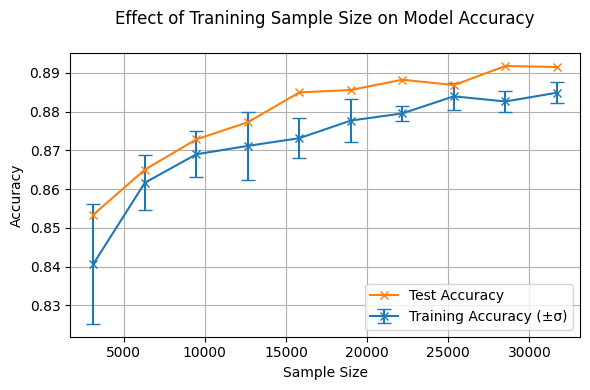

In [ ]:
plt.figure(figsize=(6, 4))

# Plot training accuracy with error bars
plt.errorbar(
    df_learning_results['sample_size'],
    df_learning_results['cv_mean_accuracy'],
    yerr=df_learning_results['cv_std_accuracy'],
    fmt='-x',
    capsize=5,
    label='Training Accuracy (±σ)',
    color='tab:blue'
)

# Plot test accuracy
plt.plot(
    df_learning_results['sample_size'],
    df_learning_results['test_accuracy'],
    '-x',
    label='Test Accuracy',
    color='tab:orange'
)

# Labels and legend
plt.xlabel("Sample Size")
plt.ylabel("Accuracy")
plt.title(f"Effect of Tranining Sample Size on Model Accuracy\n")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


#### Hyperparameter sensitivity analysis

In [ ]:
# load the model with the best performance metrics so far and the dataset

df_sup_cl = pd.read_pickle("df_sup_cl_enhanced_cl.pkl")

# load  data from pkl file created from best xgb model
with open("xgb_enh.pkl", "rb") as f:
  xgb_model_enh, train_metrics_xgb, test_metrics_xgb = pickle.load(f)

print(df_sup_cl.shape)

X_train = xgb_model_enh["xgb"]["X_train"]
y_train = xgb_model_enh["xgb"]["y_train"]
X_test = xgb_model_enh["xgb"]["X_test"]
y_test = xgb_model_enh["xgb"]["y_test"]
y_pred = xgb_model_enh["xgb"]["y_pred"]
y_pred_proba = xgb_model_enh["xgb"]["y_pred_proba"]

idx_train = X_train.index
idx_test = X_test.index

xgb_final = xgb_model_enh["xgb"]["model"]

print(accuracy_score(y_test, y_pred))
print(accuracy_score(y_test, xgb_final.predict(X_test)))

X_train.shape, X_test.shape, y_train.shape, y_test.shape, y_pred.shape, y_pred_proba.shape

(39644, 145)
0.8962038088031278
0.8962038088031278


((31715, 92), (7929, 92), (31715,), (7929,), (7929,), (7929, 6))

In [ ]:
def check_hyperparam_sensitivity(baseparams, param_to_change):
  mdl = XGBClassifier()
  hyper_results = []

  for param, vals in param_to_change.items():
    print(f"... working on parameter {param}")
    for val in vals:
      print(f"   ... value: {val}")
      params = baseparams.copy()
      params[param] = val
      mdl.set_params(**params)

      # Cross-validation
      cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
      cv_results = cross_validate(mdl, X_train, y_train, cv=cv, scoring="accuracy", return_train_score=False)
      cv_mean, cv_std = np.mean(cv_results["test_score"]), np.std(cv_results["test_score"])

      mdl.fit(X_train, y_train)
      test_accuracy = accuracy_score(y_test, mdl.predict(X_test))
      print(f"      param: {param} value: {val} training score- mean: {cv_mean} std: {cv_std} test accuracy: {test_accuracy}")

      hyper_results.append({"param": param,
                            "param_value": val,
                            "cv_mean_accuracy": cv_mean,
                            "cv_std_accuracy": cv_std,
                            "test_accuracy": test_accuracy})

  return pd.DataFrame(hyper_results)


In [ ]:
xgb_params = xgb_final.get_params()

# split into 3 runs as a workaround for notebook crashing
df_hyper_results = {}

params_to_change = {"max_depth": [2, 5, 10, 20, None]}
df_hyper_results["max_depth"] = check_hyperparam_sensitivity(xgb_params, params_to_change)

params_to_change = {"learning_rate": [0.01, 0.05, 0.1, 0.5, 1.0]}
df_hyper_results["learning_rate"] = check_hyperparam_sensitivity(xgb_params, params_to_change)

params_to_change = {"n_estimators": [20, 50, 100, 200, 500]}
df_hyper_results["n_estimators"] = check_hyperparam_sensitivity(xgb_params, params_to_change)


... working on parameter max_depth
   ... value: 2
      param: max_depth value: 2 training score- mean: 0.861485101686899 std: 0.005066170018828905 test accuracy: 0.8636650271156514
   ... value: 5
      param: max_depth value: 5 training score- mean: 0.8814756424404857 std: 0.0021922425723813767 test accuracy: 0.8920418716105436
   ... value: 10
      param: max_depth value: 10 training score- mean: 0.8849125019706763 std: 0.0026829005059035333 test accuracy: 0.8934291840080716
   ... value: 20
      param: max_depth value: 20 training score- mean: 0.8819801355825317 std: 0.0036248104337253486 test accuracy: 0.8917896329928112
   ... value: None
      param: max_depth value: None training score- mean: 0.884092700614851 std: 0.0020001578467165183 test accuracy: 0.8962038088031278
... working on parameter learning_rate
   ... value: 0.01
      param: learning_rate value: 0.01 training score- mean: 0.8443323348573231 std: 0.0038560531600089435 test accuracy: 0.8491613065960398
   ... va

In [ ]:
# with open("df_hyper_results.pkl", "wb") as f:
#   pickle.dump(df_hyper_results, f)

with open("df_hyper_results.pkl", "rb") as f:
  df_hyper_results = pickle.load(f)

df_hyper_results

{'max_depth':        param  param_value  cv_mean_accuracy  cv_std_accuracy  test_accuracy
 0  max_depth          2.0          0.861485         0.005066       0.863665
 1  max_depth          5.0          0.881476         0.002192       0.892042
 2  max_depth         10.0          0.884913         0.002683       0.893429
 3  max_depth         20.0          0.881980         0.003625       0.891790
 4  max_depth          NaN          0.884093         0.002000       0.896204,
 'learning_rate':            param  param_value  cv_mean_accuracy  cv_std_accuracy  \
 0  learning_rate         0.01          0.844332         0.003856   
 1  learning_rate         0.05          0.865584         0.003653   
 2  learning_rate         0.10          0.875201         0.004611   
 3  learning_rate         0.50          0.884313         0.004283   
 4  learning_rate         1.00          0.878449         0.002567   
 
    test_accuracy  
 0       0.849161  
 1       0.868584  
 2       0.885610  
 3       0.

In [ ]:
lrates = [0.25, 0.5]
mdls = {}

for lr in lrates:
  mdl = XGBClassifier()
  baseparams = mdl.get_params()
  params = baseparams.copy()
  params["n_estimators"] = 500
  params["learning_rate"] = lr
  mdl = XGBClassifier()
  mdl.set_params(**params)

  # Cross-validation
  cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
  cv_results = cross_validate(mdl, X_train, y_train, cv=cv, scoring="accuracy", return_train_score=False)
  cv_mean, cv_std = np.mean(cv_results["test_score"]), np.std(cv_results["test_score"])

  mdl.fit(X_train, y_train)
  test_accuracy = accuracy_score(y_test, mdl.predict(X_test))
  print(f"lr: {lr} training score- mean: {cv_mean} std: {cv_std} test accuracy: {test_accuracy}")
  mdls[lr] = mdl


lr: 0.25 training score- mean: 0.8877502758946871 std: 0.003235560090144167 test accuracy: 0.8980955984361205
lr: 0.5 training score- mean: 0.8873719060381523 std: 0.003789737154139437 test accuracy: 0.8962038088031278


In [ ]:
xgb_final_tuned = mdls[0.25]
with open("xgb_final_tuned.pkl", "wb") as f:
  pickle.dump(xgb_final_tuned, f)

# with open("xgb_final_tuned.pkl", "rb") as f:
#   xgb_final_tuned = pickle.load(f)

xgb_final_tuned

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.25, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

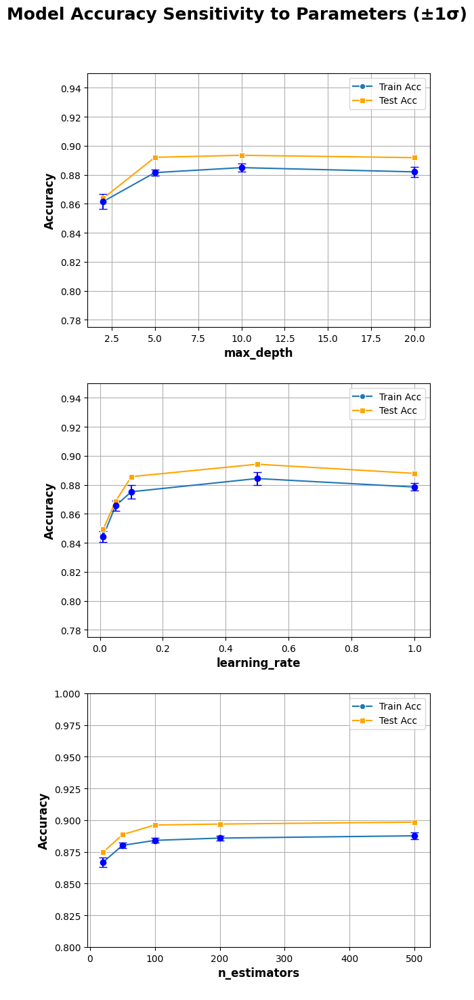

In [ ]:
dfs = df_hyper_results.copy()

# Parameters
n_std = 1  # 1 or 3 standard deviations
fig, axs = plt.subplots(3, 1, figsize=(6,15), sharey=False)

for i, (param_name, df) in enumerate(dfs.items()):
    ax = axs[i]

    # Error bars
    yerr = n_std * df["cv_std_accuracy"]

    # Plot training accuracy
    sns.lineplot(
        data=df,
        x="param_value",
        y="cv_mean_accuracy",
        marker="o",
        label="Train Acc",
        ax=ax
    )
    ax.errorbar(
        df["param_value"],
        df["cv_mean_accuracy"],
        yerr=yerr,
        fmt='o',
        capsize=4,
        color="blue"
    )

    # Plot test accuracy
    sns.lineplot(
        data=df,
        x="param_value",
        y="test_accuracy",
        marker="s",
        label="Test Acc",
        color="orange",
        ax=ax
    )

    ax.set_xlabel(f"{param_name}\n", fontsize=12, fontweight="bold")
    ax.set_ylabel("Accuracy", fontsize=12, fontweight="bold")
    ax.set_ylim(0.775, 0.95)
    ax.grid(True)
    ax.legend()

plt.suptitle(f"Model Accuracy Sensitivity to Parameters (±{n_std}σ)", fontsize=18, fontweight="bold")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.ylim(0.8, 1.0)
plt.show()


#### Failure Analysis and Feature importance

In [ ]:
# load the model with the best performance metrics so far and the dataset

with open("xgb_final_tuned.pkl", "rb") as f:
  xgb_final_tuned = pickle.load(f)

# load  data from pkl file created from best xgb model
with open("xgb_enh.pkl", "rb") as f:
  xgb_model_enh, train_metrics_xgb, test_metrics_xgb = pickle.load(f)

df_sup_cl = pd.read_pickle("df_sup_cl_enhanced_cl.pkl")

X_train = xgb_model_enh["xgb"]["X_train"]
y_train = xgb_model_enh["xgb"]["y_train"]
X_test = xgb_model_enh["xgb"]["X_test"]
y_test = xgb_model_enh["xgb"]["y_test"]

idx_train = X_train.index
idx_test = X_test.index

y_pred = xgb_final_tuned.predict(X_test)
y_pred_proba = xgb_final_tuned.predict_proba(X_test)
print(accuracy_score(y_test, y_pred))
print(top_k_accuracy_score(y_test, y_pred_proba))

X_train.shape, X_test.shape, y_train.shape, y_test.shape, y_pred.shape, y_pred_proba.shape, df_sup_cl.shape, xgb_final_tuned

0.8980955984361205
0.9813343422878043


((31715, 92),
 (7929, 92),
 (31715,),
 (7929,),
 (7929,),
 (7929, 6),
 (39644, 145),
 XGBClassifier(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=None, colsample_bynode=None,
               colsample_bytree=None, device=None, early_stopping_rounds=None,
               enable_categorical=False, eval_metric=None, feature_types=None,
               gamma=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.25, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=None, max_leaves=None,
               min_child_weight=None, missing=nan, monotone_constraints=None,
               multi_strategy=None, n_estimators=500, n_jobs=None,
               num_parallel_tree=None, objective='multi:softprob', ...))

In [ ]:
xgb_final_tuned.get_params()

{'objective': 'multi:softprob',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': 0.25,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': 500,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

**What is the top-2 accuracy?**

In [ ]:
xgb_y_test = y_test
xgb_y_pred = xgb_final_tuned.predict(X_test)
xgb_y_pred_proba = xgb_final_tuned.predict_proba(X_test)

print(f"Accuracy of the XGBoost model on test data: {accuracy_score(xgb_y_test, xgb_y_pred):.4f}")
print(f"Accuracy of the XGBoost model on test data using top-k with k=2: {top_k_accuracy_score(xgb_y_test, xgb_y_pred_proba, k=2):.4f}")


Accuracy of the XGBoost model on test data: 0.8981
Accuracy of the XGBoost model on test data using top-k with k=2: 0.9813


**Model's top-2 accuracy is 0.9813 and top-1 accuracy is 0.8981. Let's look at some of the prediction failures**

In [ ]:
test_idx = xgb_y_test.index

# add xgb_y_pred_proba values as 6 columns to df_sup_cl
pred_proba_cols = [f"xgb_pred_proba_{i}" for i in range(6)]
df_sup_cl.loc[test_idx, pred_proba_cols] = xgb_y_pred_proba

# get index values corresponding to top two values of xgb_y_pred_proba[:5]
top_two_pred_cols = [f"xgb_top_pred_{i}" for i in range(2,0,-1)]
top_two_preds = np.argsort(xgb_y_pred_proba, axis=1)[:, -2:]
df_sup_cl.loc[test_idx, top_two_pred_cols] = top_two_preds

prediction_columns = top_two_pred_cols + [target_cl] + pred_proba_cols + lda_cols
failure_analysis_df = df_sup_cl.loc[test_idx, prediction_columns]
failure_analysis_df[top_two_pred_cols] = failure_analysis_df[top_two_pred_cols].astype(int)

failure_analysis_df.shape

(7929, 14)

In [ ]:
print("Top-1 prediction mstches channel/category:")
display((failure_analysis_df["xgb_top_pred_1"] != failure_analysis_df["channel"]).value_counts())

print(f"\nTop-2 predictions mstches channel/category:")
display(((failure_analysis_df["xgb_top_pred_1"] == failure_analysis_df["channel"]) | \
  (failure_analysis_df["xgb_top_pred_2"] == failure_analysis_df["channel"])).value_counts())

print(f"\nCount of top 2 matching predictions from top_k_accuracy score: {top_k_accuracy_score(xgb_y_test, xgb_y_pred_proba, k=2, normalize=False)}")

Top-1 prediction mstches channel/category:


,count
False,7121
True,808



Top-2 predictions mstches channel/category:


,count
True,7781
False,148



Count of top 2 matching predictions from top_k_accuracy score: 7781


In [ ]:
# We have 7781 - 7121 or 660 "second" prediction that matches the article category. There are 148 that do not match top-2 predictions.

incorrect_top2_preds = failure_analysis_df.loc[((failure_analysis_df["xgb_top_pred_1"] != failure_analysis_df["channel"]) & \
                        (failure_analysis_df["xgb_top_pred_2"] != failure_analysis_df["channel"]))]
print(incorrect_top2_preds.shape)
display(incorrect_top2_preds["channel"].value_counts())
incorrect_top2_preds.head(10)

(148, 14)


,count
channel,
0,34
3,33
5,26
2,23
4,20
1,12


,xgb_top_pred_2,xgb_top_pred_1,channel,xgb_pred_proba_0,xgb_pred_proba_1,xgb_pred_proba_2,xgb_pred_proba_3,xgb_pred_proba_4,xgb_pred_proba_5,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04
29493,0,5,4,0.003014,2.598472e-06,3.848762e-06,0.000164,0.000713,0.996102,0.025001,0.025008,0.523447,0.274935,0.151610
3850,0,3,2,0.118081,5.087032e-08,1.114481e-01,0.727369,0.042054,0.001049,0.349775,0.025129,0.270761,0.025117,0.329217
9341,3,2,1,0.027392,2.299900e-02,9.135194e-01,0.034394,0.001649,0.000047,0.597144,0.233374,0.020052,0.020211,0.129219
37114,3,0,2,0.715550,3.885449e-07,5.658374e-02,0.227192,0.000087,0.000587,0.439710,0.040004,0.239277,0.240021,0.040987
36765,5,1,0,0.014492,9.357957e-01,6.937694e-07,0.004527,0.000030,0.045155,0.020387,0.274061,0.423456,0.261940,0.020155
17648,0,4,5,0.221040,1.189256e-04,1.340915e-06,0.134327,0.639687,0.004825,0.108379,0.020003,0.142740,0.400291,0.328587
726,0,1,3,0.082290,7.258257e-01,7.008901e-02,0.040840,0.080922,0.000034,0.251059,0.467703,0.022332,0.022316,0.236590
8153,0,5,4,0.013822,6.218324e-03,2.781490e-07,0.000003,0.007717,0.972240,0.020052,0.020345,0.322528,0.320608,0.316468
29853,5,4,2,0.002101,5.855186e-06,1.100451e-01,0.006185,0.471323,0.410340,0.640028,0.018374,0.122269,0.018292,0.201037
8365,0,3,4,0.360099,6.723413e-06,2.908785e-05,0.591912,0.047899,0.000053,0.212462,0.020028,0.020144,0.228454,0.518912


In [ ]:
# are there any patterns in the misclassified records
display(pd.crosstab(incorrect_top2_preds["channel"], incorrect_top2_preds["xgb_top_pred_1"], margins=True))
display(pd.crosstab(incorrect_top2_preds["channel"], incorrect_top2_preds["xgb_top_pred_2"], margins=True))

xgb_top_pred_1,0,1,2,3,4,5,All
channel,,,,,,,
0,0,6,4,6,7,11,34
1,6,0,2,2,0,2,12
2,3,5,0,3,6,6,23
3,11,5,5,0,7,5,33
4,2,1,3,4,0,10,20
5,10,3,3,4,6,0,26
All,32,20,17,19,26,34,148


xgb_top_pred_2,0,1,2,3,4,5,All
channel,,,,,,,
0,0,2,7,7,13,5,34
1,1,0,3,5,2,1,12
2,10,1,0,7,2,3,23
3,15,5,5,0,2,6,33
4,9,1,2,7,0,1,20
5,6,3,5,6,6,0,26
All,41,12,22,32,25,16,148


In [ ]:
failure_analysis_df["xgb_top_2_overlay_on_1"] = failure_analysis_df["xgb_top_pred_1"]
pred_2_matches = (failure_analysis_df["channel"] == failure_analysis_df["xgb_top_pred_2"]) & \
                        (failure_analysis_df["xgb_top_pred_1"] != failure_analysis_df["channel"])
failure_analysis_df.loc[pred_2_matches, "xgb_top_2_overlay_on_1"] = failure_analysis_df.loc[pred_2_matches, "xgb_top_pred_2"]

accuracy_score(failure_analysis_df["channel"], failure_analysis_df["xgb_top_2_overlay_on_1"])

0.9813343422878043

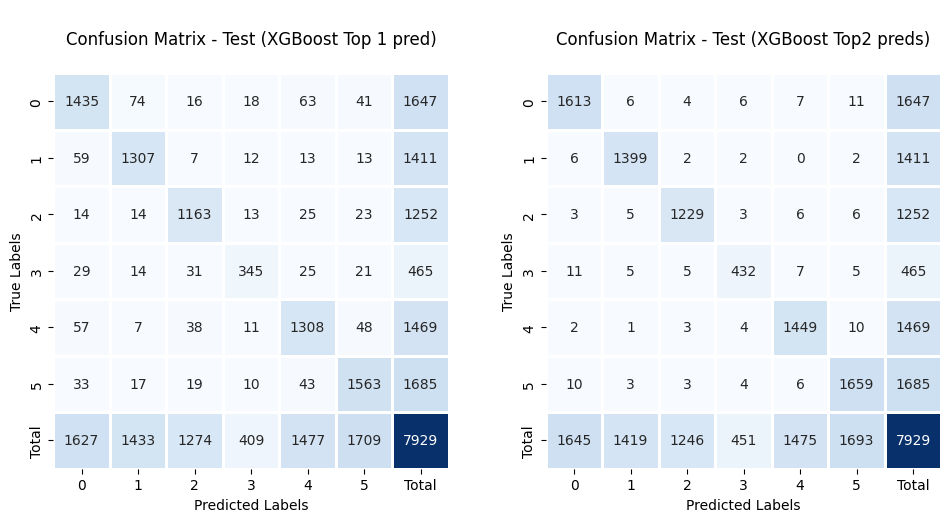

In [ ]:
# show two confusion matrices side by side, one for xgb_top_pred_1 vs channel and the other for xgb_top_2_overlay_on_1 vs channel

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# xgb_top_pred_1 vs channel

y_pred = failure_analysis_df["xgb_top_pred_1"]
y_test = failure_analysis_df["channel"]
cm = confusion_matrix(y_test, y_pred)

# Convert to Pandas DataFrame and calculate row, column totals
df_cm = pd.DataFrame(cm)
df_cm['Total'] = df_cm.sum(axis=1)
df_cm.loc['Total'] = df_cm.sum(axis=0)
sns.heatmap(df_cm, ax=axs[0], annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"fontsize":10}, square=True, linewidths=1)

# xgb_top_2_overlay_on_1 vs channel
y_pred = failure_analysis_df["xgb_top_2_overlay_on_1"]
y_test = failure_analysis_df["channel"]
cm = confusion_matrix(y_test, y_pred)

# Convert to Pandas DataFrame and calculate row, column totals
df_cm = pd.DataFrame(cm)
df_cm['Total'] = df_cm.sum(axis=1)
df_cm.loc['Total'] = df_cm.sum(axis=0)
sns.heatmap(df_cm, ax=axs[1], annot=True, fmt="d", cmap="Blues", cbar=False, annot_kws={"fontsize":10}, square=True, linewidths=1)

axs[0].set_title("\nConfusion Matrix - Test (XGBoost Top 1 pred)\n")
axs[0].set_xlabel("Predicted Labels")
axs[0].set_ylabel("True Labels")
axs[1].set_title("\nConfusion Matrix - Test (XGBoost Top2 preds)\n")
axs[1].set_xlabel("Predicted Labels")
axs[1].set_ylabel("True Labels")

plt.tight_layout()
plt.show()

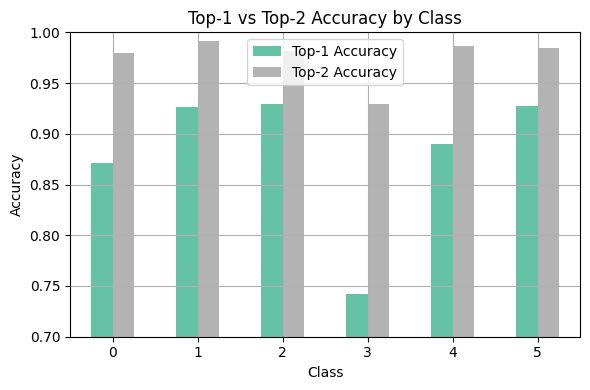

In [ ]:
# calculate top1 and top2 accuracy scores by class

classes = range(0,6)
class_accuracies = []
for c in classes:
  class_accuracies.append({"Class": c,
                          "Top-1 Accuracy": accuracy_score(failure_analysis_df.loc[failure_analysis_df["channel"]==c, "channel"],
                                                           failure_analysis_df.loc[failure_analysis_df["channel"]==c, "xgb_top_pred_1"]),
                          "Top-2 Accuracy": accuracy_score(failure_analysis_df.loc[failure_analysis_df["channel"]==c, "channel"],
                                                           failure_analysis_df.loc[failure_analysis_df["channel"]==c, "xgb_top_2_overlay_on_1"])})

df_acc = pd.DataFrame(class_accuracies)

df_acc.set_index("Class").plot(kind="bar", figsize=(6, 4), ylim=(0.7, 1.0), colormap="Set2")
plt.title("Top-1 vs Top-2 Accuracy by Class")
plt.ylabel("Accuracy")
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Do the misclassification have any association with publication month?

failure_analysis_df["article_publish_date"] = df_sup_cl.loc[failure_analysis_df.index, "article_publish_date"]
failure_analysis_df["article_publish_month"] = failure_analysis_df["article_publish_date"].dt.month.fillna(0).astype(int)
failure_analysis_df["article_publish_year"] = failure_analysis_df["article_publish_date"].dt.year.fillna(0).astype(int)
failure_analysis_df.columns

Index(['xgb_top_pred_2', 'xgb_top_pred_1', 'channel', 'xgb_pred_proba_0',
       'xgb_pred_proba_1', 'xgb_pred_proba_2', 'xgb_pred_proba_3',
       'xgb_pred_proba_4', 'xgb_pred_proba_5', 'LDA_00', 'LDA_01', 'LDA_02',
       'LDA_03', 'LDA_04', 'xgb_top_2_overlay_on_1', 'article_publish_date',
       'article_publish_month', 'article_publish_year'],
      dtype='object')

In [ ]:
# cross tab of article month vs misclassified samples

misclassified_idx = np.where(failure_analysis_df["channel"] != failure_analysis_df["xgb_top_pred_1"])[0]
pd.crosstab(
    failure_analysis_df.iloc[misclassified_idx, 2],  # channel
    failure_analysis_df.iloc[misclassified_idx, 16], # month
    margins=True
)

article_publish_month,1,2,3,4,5,6,7,8,9,10,11,12,All
channel,,,,,,,,,,,,,
0,20,16,14,15,9,21,17,23,17,30,11,19,212
1,8,13,6,10,6,7,15,5,9,6,9,10,104
2,9,9,13,8,6,5,14,5,5,4,8,3,89
3,12,2,14,10,9,9,10,9,8,11,18,8,120
4,22,14,16,17,13,10,14,15,12,7,5,16,161
5,12,11,9,11,11,5,13,11,13,11,10,5,122
All,83,65,72,71,54,57,83,68,64,69,61,61,808


In [ ]:
# cross tab of article year vs misclassified samples

misclassified_idx = np.where(failure_analysis_df["channel"] != failure_analysis_df["xgb_top_pred_1"])[0]
pd.crosstab(
    failure_analysis_df.iloc[misclassified_idx, 2],  # channel
    failure_analysis_df.iloc[misclassified_idx, 17], # year
    margins=True
)

article_publish_year,2013,2014,All
channel,,,
0,111,101,212
1,43,61,104
2,42,47,89
3,71,49,120
4,94,67,161
5,61,61,122
All,422,386,808


**Feature importance - SHAP values**

In [ ]:
import shap

# Only needed once for tree models
explainer = shap.Explainer(xgb_final_tuned, X_train)
shap_values = explainer(X_test)


100%|===================| 47570/47574 [118:24<00:00]       

In [ ]:
# with open("shap_values_xgb_cl.pkl", "wb") as f:
#   pickle.dump(shap_values, f)

In [ ]:
# to Load later

with open("shap_values_xgb_cl.pkl", "rb") as f:
  shap_values = pickle.load(f)

In [ ]:
shap_values.shape

(7929, 92, 6)

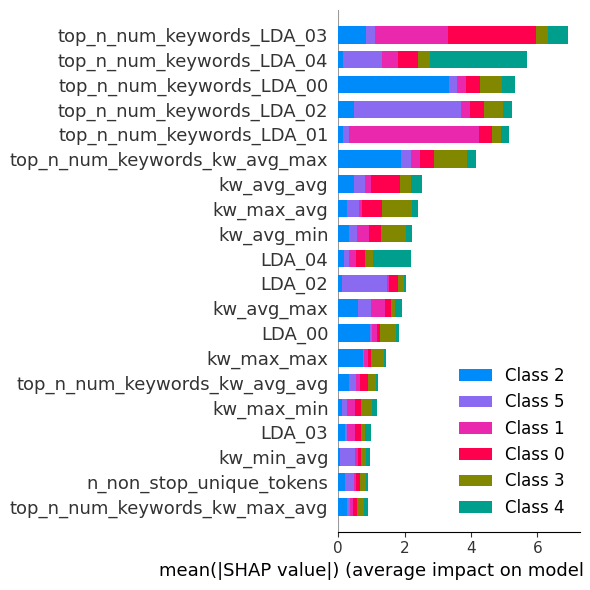

In [ ]:
# summary plot
shap.summary_plot(shap_values, X_test, show=True, plot_size=(6,6))

In [ ]:
shap_importance_values = np.abs(shap_values.values).mean(axis=0).sum(axis=1)
# shap_importance_values.shape

# Map to feature names
feature_names = X_test.columns
shap_importance_df = pd.DataFrame({
    'feature': feature_names,
    'mean_abs_shap': shap_importance_values
}).sort_values(by='mean_abs_shap', ascending=False)

# Get top 20
top_20_shap = shap_importance_df.head(20)
print(top_20_shap)

                          feature  mean_abs_shap
55      top_n_num_keywords_LDA_03       6.940433
53      top_n_num_keywords_LDA_04       5.696469
54      top_n_num_keywords_LDA_00       5.329405
52      top_n_num_keywords_LDA_02       5.251915
56      top_n_num_keywords_LDA_01       5.161392
62  top_n_num_keywords_kw_avg_max       4.166768
19                     kw_avg_avg       2.515155
18                     kw_max_avg       2.398054
13                     kw_avg_min       2.211245
35                         LDA_04       2.184232
33                         LDA_02       2.057362
16                     kw_avg_max       1.913325
31                         LDA_00       1.825323
15                     kw_max_max       1.437693
59  top_n_num_keywords_kw_avg_avg       1.192970
12                     kw_max_min       1.177951
34                         LDA_03       0.994820
17                     kw_min_avg       0.957409
4        n_non_stop_unique_tokens       0.901495
61  top_n_num_keywor

In [ ]:
model_importance_df = pd.DataFrame({
    'feature': feature_names,
    'model_importance': xgb_final_tuned.feature_importances_
}).sort_values(by='model_importance', ascending=False)

top_20_model = model_importance_df.head(20)
print(top_20_model)

                          feature  model_importance
31                         LDA_00          0.098346
33                         LDA_02          0.097822
35                         LDA_04          0.075718
56      top_n_num_keywords_LDA_01          0.059007
55      top_n_num_keywords_LDA_03          0.054756
52      top_n_num_keywords_LDA_02          0.046090
53      top_n_num_keywords_LDA_04          0.033637
10                   num_keywords          0.029346
54      top_n_num_keywords_LDA_00          0.026186
15                     kw_max_max          0.025081
11                     kw_min_min          0.025046
32                         LDA_01          0.016324
77    top_n_num_videos_kw_max_max          0.015708
8                      num_videos          0.015665
34                         LDA_03          0.015049
6                  num_self_hrefs          0.014974
62  top_n_num_keywords_kw_avg_max          0.013962
18                     kw_max_avg          0.012343
19          

In [ ]:
comparison = pd.merge(top_20_shap, model_importance_df, on='feature')
print(comparison)

                          feature  mean_abs_shap  model_importance
0       top_n_num_keywords_LDA_03       6.940433          0.054756
1       top_n_num_keywords_LDA_04       5.696469          0.033637
2       top_n_num_keywords_LDA_00       5.329405          0.026186
3       top_n_num_keywords_LDA_02       5.251915          0.046090
4       top_n_num_keywords_LDA_01       5.161392          0.059007
5   top_n_num_keywords_kw_avg_max       4.166768          0.013962
6                      kw_avg_avg       2.515155          0.011329
7                      kw_max_avg       2.398054          0.012343
8                      kw_avg_min       2.211245          0.003663
9                          LDA_04       2.184232          0.075718
10                         LDA_02       2.057362          0.097822
11                     kw_avg_max       1.913325          0.009274
12                         LDA_00       1.825323          0.098346
13                     kw_max_max       1.437693          0.02

In [ ]:
set(top_20_shap["feature"]).difference(set(top_20_model["feature"]))

{'kw_avg_max',
 'kw_avg_min',
 'kw_max_min',
 'kw_min_avg',
 'n_non_stop_unique_tokens',
 'top_n_num_keywords_kw_avg_avg',
 'top_n_num_keywords_kw_max_avg'}

In [ ]:
set(top_20_model["feature"]).difference(set(top_20_shap["feature"]))

{'LDA_01',
 'kw_min_min',
 'num_keywords',
 'num_self_hrefs',
 'num_videos',
 'top_n_num_videos_kw_max_max',
 'top_n_num_videos_kw_min_min'}

In [ ]:
# Let's look at some where the second prediction matches

(failure_analysis_df.loc[failure_analysis_df["xgb_top_pred_2"] == failure_analysis_df["channel"]]).sample(5)
#32781


,xgb_top_pred_2,xgb_top_pred_1,channel,xgb_pred_proba_0,xgb_pred_proba_1,xgb_pred_proba_2,xgb_pred_proba_3,xgb_pred_proba_4,xgb_pred_proba_5,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,xgb_top_2_overlay_on_1,article_publish_date,article_publish_month,article_publish_year
3947,4,0,4,0.946220,4.035776e-08,6.818356e-06,7.859508e-05,5.369344e-02,1.583223e-06,0.025082,0.025058,0.025025,0.025014,0.899822,4,2013-03-17 17:59:05+00:00,3,2013
8499,5,4,5,0.000005,2.531672e-07,1.469670e-07,7.125334e-07,8.961232e-01,1.038708e-01,0.020014,0.020001,0.628127,0.020002,0.311857,5,2013-06-17 22:47:53+00:00,6,2013
37068,0,5,0,0.253747,9.640339e-06,1.407519e-07,6.911080e-06,3.314785e-05,7.462032e-01,0.020004,0.020012,0.220407,0.451405,0.288171,0,2014-11-17 11:30:28+00:00,11,2014
30668,3,4,3,0.002116,4.856146e-07,1.779869e-04,2.531059e-01,7.444222e-01,1.770691e-04,0.206587,0.020004,0.135568,0.020085,0.617756,3,2014-08-11 14:45:45+00:00,8,2014
32781,1,0,1,0.526750,4.732449e-01,1.740417e-07,4.836012e-06,1.176166e-07,1.494926e-07,0.028572,0.029191,0.028572,0.885093,0.028572,1,2014-09-15 21:10:03+00:00,9,2014


In [ ]:
y_test[y_pred != y_test].index

Index([29493,  3850,  9341, 37114, 36765, 17648,   726,  8153, 29853,  8365,
       ...
       11515, 17923, 22478,  4713, 11698, 12336, 17048,  6942,  5257, 11796],
      dtype='int64', length=148)

In [ ]:
# Misclassified samples

misclassified_idx = np.where(y_pred != y_test)[0]

# Set the seed for reproducibility
seed_value = 42
rng = np.random.default_rng(seed_value)
# Pick 5 random values
random_misclassified_sample_idx = rng.choice(misclassified_idx, size=5, replace=False)
print(random_misclassified_sample_idx)

[6165 4182 5302 1234 7924]


In [ ]:
y_pred.iloc[random_misclassified_sample_idx], y_test.iloc[random_misclassified_sample_idx]

(20096    3
 16986    2
 18258    0
 22663    1
 11796    3
 Name: xgb_top_2_overlay_on_1, dtype: int64,
 20096    1
 16986    4
 18258    3
 22663    2
 11796    5
 Name: channel, dtype: int64)

In [ ]:
df_sup_cl.iloc[[20096,16986], :]

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,wknd_abs_title_subjectivity,wknd_abs_title_sentiment_polarity,xgb_pred_proba_0,xgb_pred_proba_1,xgb_pred_proba_2,xgb_pred_proba_3,xgb_pred_proba_4,xgb_pred_proba_5,xgb_top_pred_2,xgb_top_pred_1
20096,http://mashable.com/2014/02/08/hbo-silicon-valley/,334.0,9.0,1947.0,0.416493,1.0,0.605219,62.0,8.0,15.0,...,0.793701,0.0,0.000774,1.866030e-02,0.027133,0.953311,0.000096,0.000026,2.0,3.0
16986,http://mashable.com/2013/12/04/apple-and-china-mobile-to-strike-iphone-deal-says-report/,400.0,10.0,917.0,0.491676,1.0,0.712665,9.0,3.0,1.0,...,0.000000,0.0,0.000005,3.270683e-10,0.999610,0.000266,0.000016,0.000103,3.0,2.0


In [ ]:
X_test.iloc[random_misclassified_sample_idx, ]

In [ ]:
failure_analysis_df.iloc[random_misclassified_sample_idx, :]

,xgb_top_pred_2,xgb_top_pred_1,channel,xgb_pred_proba_0,xgb_pred_proba_1,xgb_pred_proba_2,xgb_pred_proba_3,xgb_pred_proba_4,xgb_pred_proba_5,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,xgb_top_2_overlay_on_1,article_publish_date,article_publish_month,article_publish_year
20096,2,3,1,0.000774,1.866030e-02,2.713259e-02,0.953311,0.000096,0.000026,0.741527,0.171704,0.028683,0.029478,0.028607,3,2014-02-08 21:12:01+00:00,2,2014
16986,3,2,4,0.000005,3.270683e-10,9.996099e-01,0.000266,0.000016,0.000103,0.610989,0.025020,0.162421,0.025030,0.176540,2,2013-12-05 02:53:47+00:00,12,2013
18258,1,0,3,0.988526,1.115852e-02,5.079077e-09,0.000296,0.000014,0.000006,0.020307,0.123749,0.020061,0.815883,0.020000,0,2014-01-02 23:39:44+00:00,1,2014
22663,0,1,2,0.197292,7.193339e-01,5.514545e-02,0.006447,0.021726,0.000056,0.333839,0.222976,0.020260,0.267859,0.155066,1,2014-03-31 15:16:13+00:00,3,2014
11796,4,3,5,0.051992,1.156433e-05,2.006809e-03,0.524668,0.304384,0.116938,0.247292,0.020017,0.206645,0.020112,0.505934,3,2013-08-20 04:01:22+00:00,8,2013


In [ ]:
# force plots for the first 2 entries

shap.initjs()
for i in random_misclassified_sample_idx[:2]:
    print(f"\nSample index: {i}, True: {y_test.iloc[i]}, Predicted: {y_pred.iloc[i]}")

    # Force plot for predicted class
    predicted_class = y_pred.iloc[i]
    print(f"\nSample {i}: Force plot for predicted class {predicted_class}")
    display(shap.plots.force(
        base_value=shap_values.base_values[i][predicted_class],
        shap_values=shap_values.values[i][:,predicted_class],
        features=X_test.iloc[i],
        feature_names=X_test.columns
    ))

    # Force plot for true class
    true_class = y_test.iloc[i]
    print(f"Sample {i}: Force plot for true class {true_class}")
    display(shap.plots.force(
        base_value=shap_values.base_values[i][true_class],
        shap_values=shap_values.values[i][:,true_class],
        features=X_test.iloc[i],
        feature_names=X_test.columns
    ))


Sample index: 6165, True: 1, Predicted: 3

Sample 6165: Force plot for predicted class 3


Sample 6165: Force plot for true class 1



Sample index: 4182, True: 4, Predicted: 2

Sample 4182: Force plot for predicted class 2


Sample 4182: Force plot for true class 4


**For the first sample, the two classes are 1 and 3. Let's see feature importances for these.**

(7929, 92) (7929,) (7929, 92)
(7929, 92) 92


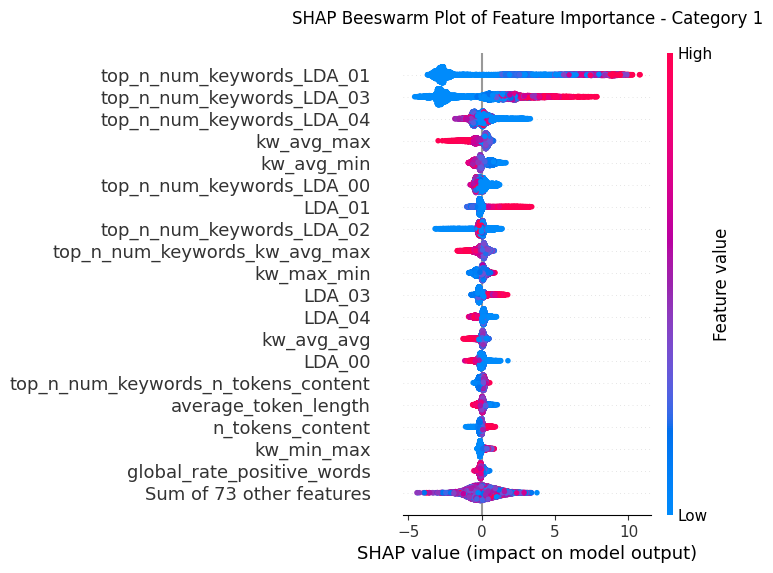

In [ ]:
class_idx = 1

# Extract values and base_values for that class
shap_class_vals = shap_values.values[:, :, class_idx]            # shape: (n_samples, n_features)  (7929, 92)
shap_class_base_vals = shap_values.base_values[:, class_idx]     # shape: (n_samples,)             (7929,)
shap_class_data = shap_values.data                               # shape: (n_samples, n_features)  (7929, 92)
print(shap_class_vals.shape, shap_class_base_vals.shape, shap_class_data.shape)

# Wrap it into a new Explanation object (required for plotting)
shap_values_for_class = shap.Explanation(
    values=shap_class_vals,
    base_values=shap_class_base_vals,
    data=shap_class_data,
    feature_names=shap_values.feature_names
)

print(shap_values_for_class.shape, len(shap_values.feature_names))  # (7929, 92) 92
# Beeswarm plot just for one class
shap.plots.beeswarm(shap_values_for_class, max_display=20, plot_size=(4,6), show=False)
plt.title(f"SHAP Beeswarm Plot of Feature Importance - Category 1\n")
plt.show()

(7929, 92) (7929,) (7929, 92)
(7929, 92) 92


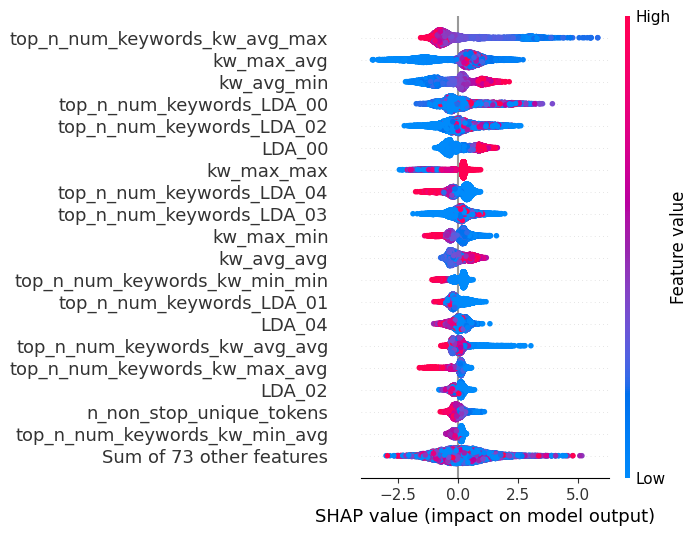

In [ ]:
class_idx = 3

# Extract values and base_values for that class
shap_class_vals = shap_values.values[:, :, class_idx]            # shape: (n_samples, n_features)  (7929, 92)
shap_class_base_vals = shap_values.base_values[:, class_idx]     # shape: (n_samples,)             (7929,)
shap_class_data = shap_values.data                               # shape: (n_samples, n_features)  (7929, 92)
print(shap_class_vals.shape, shap_class_base_vals.shape, shap_class_data.shape)

# Wrap it into a new Explanation object (required for plotting)
shap_values_for_class = shap.Explanation(
    values=shap_class_vals,
    base_values=shap_class_base_vals,
    data=shap_class_data,
    feature_names=shap_values.feature_names
)

print(shap_values_for_class.shape, len(shap_values.feature_names))  # (7929, 92) 92
# Beeswarm plot just for one class
shap.plots.beeswarm(shap_values_for_class, max_display=20, plot_size=(4,6))

#### Attempt to recreate the 5 LDA columns in the original dataset

Potential improvements/ future work

In [ ]:
# what is the category, best LDA value relationship from the original data

df_sup_cl["LDA_uci5_channel"] = df_sup_cl[lda_cols].values.argmax(axis=1)
pd.crosstab(df_sup_cl["channel"], df_sup_cl["LDA_uci5_channel"], margins=True)

LDA_uci5_channel,0,1,2,3,4,All
channel,,,,,,
0,424,661,122,5576,1450,8233
1,117,3632,361,2822,125,7057
2,5298,135,195,110,520,6258
3,1152,98,401,407,265,2323
4,211,127,408,90,6510,7346
5,191,106,7130,285,715,8427
All,7393,4759,8617,9290,9585,39644


We can see clear link between channel/category and the LDA values in the dataset.
Why was LDA done with 5 categories and not 6?
First we try to see if we can approximately match the 5 category LDA values using article content

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import re
import nltk

# One-time setup
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# Preprocess text: lowercase, remove punctuation/numbers, stopwords

def preprocess_text(text):
    text = text.lower()
    text = re.sub(r"[^a-zA-Z\s]", "", text)  # remove punctuation/numbers
    tokens = text.split()
    tokens = [word for word in tokens if word not in stop_words and len(word) > 2]
    return " ".join(tokens)

# Apply preprocessing
df_sup_cl["clean_text"] = df_sup_cl["article_text"].fillna("").apply(preprocess_text)
df_sup_cl["clean_title"] = df_sup_cl["article_title"].fillna("").apply(preprocess_text)
df_sup_cl["clean_title_text"] = df_sup_cl["clean_title"] + " " + df_sup_cl["clean_text"]

df_sup_cl[["clean_text", "clean_title", "clean_title_text"]].head()

,clean_text,clean_title,clean_title_text
0,trouble finding something watch amazon instant video retailer launched monday experimental brows...,amazons streaming video library little easier navigate,amazons streaming video library little easier navigate trouble finding something watch amazon in...
1,associated press latest news organization experiment trying make money twitter using feed advert...,aps twitter begin displaying sponsored tweets,aps twitter begin displaying sponsored tweets associated press latest news organization experime...
2,looks like pretty good year apples app store apple announced monday app store passed billion dow...,apples app store passes billion downloads,apples app store passes billion downloads looks like pretty good year apples app store apple ann...
3,comes college football nasa astronaut kevin ford irish ford rooting notre dame way space bcs cha...,astronaut rooting notre dame tonight,astronaut rooting notre dame tonight comes college football nasa astronaut kevin ford irish ford...
4,las vegas sharing photos videos got little easier att uverse customers carrier announced two new...,new uverse apps simplify sharing photos videos,new uverse apps simplify sharing photos videos las vegas sharing photos videos got little easier...


In [ ]:
# what if we apply LDA with 5 topics and compare them to category

def diy_LDA(df_sup_cl, text_col="clean_text", n_topics=5, min_df=2, max_df=0.95, random_state=42, learning_method="batch", max_iter=25, max_features=None):

  # Vectorize using Bag of Words (CountVectorizer)
  vectorizer = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english', max_features=max_features)
  text_vectorized = vectorizer.fit_transform(df_sup_cl[text_col])

  # Fit LDA
  # lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=random_state, learning_method=learning_method, max_iter=max_iter)
  lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=random_state, learning_method=learning_method, max_iter=max_iter)
  lda_topic_distributions = lda_model.fit_transform(text_vectorized)

  # Add topic probabilities back to the dataframe
  for i in range(n_topics):
      df_sup_cl[f"LDA_topic_{i}"] = lda_topic_distributions[:, i]

  # Add a new column for our best LDA value index
  LDA_channel_cols = df_sup_cl.columns[df_sup_cl.columns.str.startswith("LDA_topic_")].to_list()
  df_sup_cl["category_topic_id"] = np.argmax(df_sup_cl[LDA_channel_cols].to_numpy(), axis=1, keepdims=True)

  print(f"\nAssigned LDA topic distributions to df_sup_cl. max_df={max_df}, min_df={min_df}, n_topics={n_topics}\nNew columns: 'category_topic_id', {LDA_channel_cols}\n")

  # crosstab of the original channel against the new category topic id
  display(pd.crosstab(df_sup_cl["channel"], df_sup_cl["category_topic_id"], margins=True))

  return lda_model, vectorizer

def print_top_words(lda_model, vectorizer, n_top_words=10):
  # Feature names from vectorizer
  feature_names = vectorizer.get_feature_names_out()

  for topic_idx, topic in enumerate(lda_model.components_):
      top_features = [feature_names[i] for i in topic.argsort()[:-n_top_words - 1:-1]]
      print(f"Topic #{topic_idx + 1}: {' | '.join(top_features)}")


In [ ]:
lda_model, vectorizer = diy_LDA(df_sup_cl, text_col="clean_text", n_topics=5, learning_method="batch", max_iter=10)
print(df_sup_cl.shape)

# There is no real pattern to the distribution


Assigned LDA topic distributions to df_sup_cl. max_df=0.95, min_df=2, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,3556,1631,622,927,1497,8233
1,3063,1270,568,913,1243,7057
2,1980,1056,489,616,2117,6258
3,740,399,252,231,701,2323
4,2023,2567,593,756,1407,7346
5,2775,1298,1019,1629,1706,8427
All,14137,8221,3543,5072,8671,39644


(39644, 153)


In [ ]:
# texts = df_sup_cl[((df_sup_cl["LDA_uci5_channel"] == 2) & (df_sup_cl["channel"] == 5)) \
#                   | ((df_sup_cl["LDA_uci5_channel"] == 4) & (df_sup_cl["channel"] == 4))][["channel","clean_text"]]
# print(texts.shape)
# texts = df_sup_cl[["clean_text","channel"]]
# texts.clean_text.fillna(" ", inplace=True)

texts = df_sup_cl[["clean_title","clean_text","clean_title_text", "channel"]]
print(texts.shape)

cols = texts.columns
min_df_list = [2,5,10,20,50,100,200]
max_df_list = [50,100,200,500,1000,5000,20000]

# Vectorize using Bag of Words (CountVectorizer)
feat_names = []
for col in cols:
  print(f"...{col}")
  for min_df in min_df_list:
    for max_df in max_df_list:
      if max_df < min_df:
        continue
      vectorizer = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
      try:
        text_vectorized = vectorizer.fit_transform(texts[col])
      except:
        continue
      words = vectorizer.get_feature_names_out()
      feat_names.append([col, min_df, max_df, len(words), words])

feat_df = pd.DataFrame(feat_names, columns=["colname", "min_df", "max_df", "num_features", "features"])

c1 = "clean_title"
c2 = "clean_text"
c3 = "clean_title_text"

display(c1) \
,display(pd.crosstab(feat_df.loc[feat_df["colname"]==c1, "min_df"], feat_df.loc[feat_df["colname"]==c1, "max_df"],
                      values=feat_df.loc[feat_df["colname"]==c1, "num_features"], aggfunc="sum")) \
,display(c2) \
,display(pd.crosstab(feat_df.loc[feat_df["colname"]==c2, "min_df"], feat_df.loc[feat_df["colname"]==c2, "max_df"],
                      values=feat_df.loc[feat_df["colname"]==c2, "num_features"], aggfunc="sum")) \
,display(c3) \
,display(pd.crosstab(feat_df.loc[feat_df["colname"]==c3, "min_df"], feat_df.loc[feat_df["colname"]==c3, "max_df"],
                      values=feat_df.loc[feat_df["colname"]==c3, "num_features"], aggfunc="sum"))


(39644, 4)
...clean_title
...clean_text
...clean_title_text
...channel


'clean_title'

max_df,50,100,200,500,1000,5000,20000
min_df,,,,,,,
2,13179.0,13714.0,13923.0,14016.0,14035.0,14039.0,14039.0
5,6323.0,6858.0,7067.0,7160.0,7179.0,7183.0,7183.0
10,3295.0,3830.0,4039.0,4132.0,4151.0,4155.0,4155.0
20,1451.0,1986.0,2195.0,2288.0,2307.0,2311.0,2311.0
50,19.0,554.0,763.0,856.0,875.0,879.0,879.0
100,NaN,9.0,218.0,311.0,330.0,334.0,334.0
200,NaN,NaN,NaN,93.0,112.0,116.0,116.0


'clean_text'

max_df,50,100,200,500,1000,5000,20000
min_df,,,,,,,
2,74253.0,78697.0,81671.0,84236.0,85414.0,86458.0,86531.0
5,34082.0,38526.0,41500.0,44065.0,45243.0,46287.0,46360.0
10,19261.0,23705.0,26679.0,29244.0,30422.0,31466.0,31539.0
20,9111.0,13555.0,16529.0,19094.0,20272.0,21316.0,21389.0
50,147.0,4591.0,7565.0,10130.0,11308.0,12352.0,12425.0
100,NaN,57.0,3031.0,5596.0,6774.0,7818.0,7891.0
200,NaN,NaN,25.0,2590.0,3768.0,4812.0,4885.0


'clean_title_text'

max_df,50,100,200,500,1000,5000,20000
min_df,,,,,,,
2,74572.0,79026.0,82038.0,84630.0,85826.0,86885.0,86959.0
5,34282.0,38736.0,41748.0,44340.0,45536.0,46595.0,46669.0
10,19410.0,23864.0,26876.0,29468.0,30664.0,31723.0,31797.0
20,9180.0,13634.0,16646.0,19238.0,20434.0,21493.0,21567.0
50,158.0,4612.0,7624.0,10216.0,11412.0,12471.0,12545.0
100,NaN,51.0,3063.0,5655.0,6851.0,7910.0,7984.0
200,NaN,NaN,15.0,2607.0,3803.0,4862.0,4936.0


(None, None, None, None, None, None)

In [ ]:
# Let' choose some combinations that are not too small and not too big

df_combo = [(500,20000),(200,5000),(100,1000),(50,500)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=10)
  print("")

min_df=500, max_df=20000

Assigned LDA topic distributions to df_sup_cl. max_df=20000, min_df=500, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,3153,1328,1222,928,1602,8233
1,2934,1244,994,816,1069,7057
2,1805,871,905,1585,1092,6258
3,749,289,391,521,373,2323
4,1877,1132,2218,912,1207,7346
5,2518,2322,1083,1097,1407,8427
All,13036,7186,6813,5859,6750,39644



min_df=200, max_df=5000

Assigned LDA topic distributions to df_sup_cl. max_df=5000, min_df=200, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,3634,1397,1380,1037,785,8233
1,3068,1138,1081,976,794,7057
2,2063,1939,1030,649,577,6258
3,827,680,382,234,200,2323
4,2098,1334,2330,816,768,7346
5,2723,1696,1156,1673,1179,8427
All,14413,8184,7359,5385,4303,39644



min_df=100, max_df=1000

Assigned LDA topic distributions to df_sup_cl. max_df=1000, min_df=100, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1199,3281,1673,1217,863,8233
1,947,2899,1378,1063,770,7057
2,715,1863,1570,1462,648,6258
3,257,728,676,405,257,2323
4,1020,1919,2608,1041,758,7346
5,1477,2650,1499,1342,1459,8427
All,5615,13340,9404,6530,4755,39644



min_df=50, max_df=500

Assigned LDA topic distributions to df_sup_cl. max_df=500, min_df=50, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1117,2436,811,2642,1227,8233
1,1046,1893,704,2041,1373,7057
2,749,2527,742,1502,738,6258
3,293,905,266,579,280,2323
4,918,3035,1018,1551,824,7346
5,1744,2348,1176,2001,1158,8427
All,5867,13144,4717,10316,5600,39644


In [ ]:
# Let's choose some combinations that are not too small and not too big

df_combo = [(100,2000)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=10)
  print("")

min_df=100, max_df=2000

Assigned LDA topic distributions to df_sup_cl. max_df=2000, min_df=100, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,780,1746,1266,829,3612,8233
1,738,1360,989,893,3077,7057
2,535,2169,938,552,2064,6258
3,207,788,309,208,811,2323
4,707,1909,1919,693,2118,7346
5,1489,1753,1266,1223,2696,8427
All,4456,9725,6687,4398,14378,39644


In [ ]:
df_combo = [(10,10000)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=10)
  print("")

min_df=10, max_df=10000

Assigned LDA topic distributions to df_sup_cl. max_df=10000, min_df=10, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,3509,1735,746,1343,900,8233
1,3164,1382,706,1006,799,7057
2,1996,2247,517,846,652,6258
3,768,848,167,283,257,2323
4,2069,1736,701,2076,764,7346
5,2892,1687,1223,1026,1599,8427
All,14398,9635,4060,6580,4971,39644


In [ ]:
df_combo = [(20,5000)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=25)
  print("")

min_df=20, max_df=5000

Assigned LDA topic distributions to df_sup_cl. max_df=5000, min_df=20, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1118,1168,3807,1151,989,8233
1,1064,947,3388,920,738,7057
2,711,814,2183,1598,952,6258
3,271,271,846,376,559,2323
4,893,2001,2189,1010,1253,7346
5,1912,1218,3003,1273,1021,8427
All,5969,6419,15416,6328,5512,39644


In [ ]:
df_combo = [(50,20000)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=25)
  print("")

min_df=50, max_df=20000

Assigned LDA topic distributions to df_sup_cl. max_df=20000, min_df=50, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,3714,767,1501,920,1331,8233
1,3245,704,1181,854,1073,7057
2,2100,520,2090,608,940,6258
3,830,198,705,226,364,2323
4,2134,766,1378,751,2317,7346
5,2880,1236,1604,1612,1095,8427
All,14903,4191,8459,4971,7120,39644


In [ ]:
# common_to_all = []
def remove_common_words(text):
  tokens = text.split()
  tokens = [word for word in tokens if word not in common_to_all and len(word) > 2]
  return " ".join(tokens)

texts["new_clean_title_text"] = texts["clean_title_text"]
texts["new_clean_title_text"] = texts["new_clean_title_text"].apply(remove_common_words)


In [ ]:
# for each channel, find words for min_df, max_df of 5, 90% and compare the word liss
min_df, max_df = 2, 0.90
words_dict = {}
n_cat = 6
# col_name = "clean_title_text"
col_name = "new_clean_title_text"

print(f"... All article content")
vectorizer_ = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
text_vectorized_ = vectorizer_.fit_transform(texts[col_name])
words_ = vectorizer_.get_feature_names_out()
print(f"...... word count: {len(words_)}")
words_dict[n_cat] = words_

for channel in range(n_cat):
  print(f"... Category {channel} article content")
  vectorizer_ = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
  text_vectorized_ = vectorizer_.fit_transform(texts.loc[texts["channel"]==channel, col_name])
  words_ = vectorizer_.get_feature_names_out()
  print(f"...... word count: {len(words_)}")
  words_dict[channel] = words_

n = n_cat + 1
l_i = []
l_d = []
for channel1 in range(n):
  len1 = len(words_dict[channel1])
  l_intersect = []
  l_diff = []
  for channel2 in range(n):
    if channel1 == channel2:
      l_intersect.append(len1)
      l_diff.append(0)
    else:
      l_intersect.append(len(set(words_dict[channel1]).intersection(set(words_dict[channel2]))))
      l_diff.append(len(set(words_dict[channel1]).difference(set(words_dict[channel2]))))
  l_i.append(l_intersect)
  l_d.append(l_diff)

df_intersect = pd.DataFrame(l_i, index=range(n), columns=range(n))
df_diff = pd.DataFrame(l_d, index=range(n), columns=range(n))
display(df_intersect)
display(df_diff)

... All article content
...... word count: 70972
... Category 0 article content
...... word count: 22182
... Category 1 article content
...... word count: 20670
... Category 2 article content
...... word count: 17089
... Category 3 article content
...... word count: 3379
... Category 4 article content
...... word count: 19455
... Category 5 article content
...... word count: 25326


,0,1,2,3,4,5,6
0,22182,12131,10572,1942,11601,13861,22182
1,12131,20670,9877,1723,10895,13134,20670
2,10572,9877,17089,1451,9675,11277,17089
3,1942,1723,1451,3379,1597,2094,3379
4,11601,10895,9675,1597,19455,12458,19455
5,13861,13134,11277,2094,12458,25326,25326
6,22182,20670,17089,3379,19455,25326,70972


,0,1,2,3,4,5,6
0,0,10051,11610,20240,10581,8321,0
1,8539,0,10793,18947,9775,7536,0
2,6517,7212,0,15638,7414,5812,0
3,1437,1656,1928,0,1782,1285,0
4,7854,8560,9780,17858,0,6997,0
5,11465,12192,14049,23232,12868,0,0
6,48790,50302,53883,67593,51517,45646,0


In [ ]:
common_to_all = set(words_dict[0]).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[4])).intersection(set(words_dict[5]).intersection(set(words_dict[6])))

len(common_to_all), \
len(set(words_dict[0]).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[4])).intersection(set(words_dict[5]).intersection(set(words_dict[6])))), \
len(set(words_dict[0]).difference(set(words_dict[1])).difference(set(words_dict[2])).difference(set(words_dict[3])).difference(set(words_dict[4])).difference(set(words_dict[5]))), \
len(set(words_dict[0]).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[4])).intersection(set(words_dict[5]))), \
len(set(words_dict[1]).difference(set(words_dict[0])).difference(set(words_dict[2])).difference(set(words_dict[3])).difference(set(words_dict[4])).difference(set(words_dict[5]))), \
len(set(words_dict[1]).intersection(set(words_dict[0])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[4])).intersection(set(words_dict[5]))), \
len(set(words_dict[2]).difference(set(words_dict[0])).difference(set(words_dict[1])).difference(set(words_dict[3])).difference(set(words_dict[4])).difference(set(words_dict[5]))), \
len(set(words_dict[2]).intersection(set(words_dict[0])).intersection(set(words_dict[1])).intersection(set(words_dict[3])).intersection(set(words_dict[4])).intersection(set(words_dict[5]))), \
len(set(words_dict[3]).difference(set(words_dict[0])).difference(set(words_dict[1])).difference(set(words_dict[2])).difference(set(words_dict[4])).difference(set(words_dict[5]))), \
len(set(words_dict[3]).intersection(set(words_dict[0])).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[4])).intersection(set(words_dict[5]))), \
len(set(words_dict[4]).difference(set(words_dict[0])).difference(set(words_dict[1])).difference(set(words_dict[2])).difference(set(words_dict[3])).difference(set(words_dict[5]))), \
len(set(words_dict[4]).intersection(set(words_dict[0])).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[5]))), \
len(set(words_dict[5]).difference(set(words_dict[0])).difference(set(words_dict[1])).difference(set(words_dict[2])).difference(set(words_dict[3])).difference(set(words_dict[4]))), \
len(set(words_dict[5]).intersection(set(words_dict[0])).intersection(set(words_dict[1])).intersection(set(words_dict[2])).intersection(set(words_dict[3])).intersection(set(words_dict[4]))),

# 2, 0.90 (15987, 4174, 15987, 3785, 15987, 2596, 15987, 451, 15987, 3340, 15987, 5750, 15987)


(0, 0, 4174, 0, 3785, 0, 2596, 0, 451, 0, 3340, 0, 5750, 0)

In [ ]:
len(set(words_dict[2]).difference(set(common_to_all)))
#  0: 'lifestyle',
#  1: 'entertainment',
#  2: 'business',
#  3: 'social media',
#  4: 'technology',
#  5: 'world'

17089

In [ ]:
# rerun some combinations using max_features=5000

df_combo = [(5,0.95),(2,0.95),(2,0.8)]
for min_df, max_df in df_combo:
  print(f"min_df={min_df}, max_df={max_df}")
  lda_model, vectorizer = diy_LDA(texts, text_col="clean_title_text", min_df=min_df, max_df=max_df,  n_topics=5, learning_method="batch", max_iter=25, max_features=5000)
  print("")

min_df=5, max_df=0.95

Assigned LDA topic distributions to df_sup_cl. max_df=0.95, min_df=5, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1215,1444,3915,1102,557,8233
1,985,1126,3416,1026,504,7057
2,1876,967,2267,700,448,6258
3,604,386,883,233,217,2323
4,1123,2447,2301,972,503,7346
5,1325,1181,3091,1751,1079,8427
All,7128,7551,15873,5784,3308,39644



min_df=2, max_df=0.95

Assigned LDA topic distributions to df_sup_cl. max_df=0.95, min_df=2, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1179,1628,3751,1050,625,8233
1,1025,1162,3338,991,541,7057
2,1924,1016,2159,685,474,6258
3,583,427,867,222,224,2323
4,1209,2492,2191,925,529,7346
5,1345,1281,2989,1660,1152,8427
All,7265,8006,15295,5533,3545,39644



min_df=2, max_df=0.8

Assigned LDA topic distributions to df_sup_cl. max_df=0.8, min_df=2, n_topics=5
New columns: 'category_topic_id', ['LDA_topic_0', 'LDA_topic_1', 'LDA_topic_2', 'LDA_topic_3', 'LDA_topic_4']



category_topic_id,0,1,2,3,4,All
channel,,,,,,
0,1179,1628,3751,1050,625,8233
1,1025,1162,3338,991,541,7057
2,1924,1016,2159,685,474,6258
3,583,427,867,222,224,2323
4,1209,2492,2191,925,529,7346
5,1345,1281,2989,1660,1152,8427
All,7265,8006,15295,5533,3545,39644


**None of these attempts resulted in LDA values showing clear patterns with respect to the channel/category code**


### Modeling: Predict Article Share Count

Imports and Settings

In [ ]:
#import packages

import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import pickle

from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import warnings

In [ ]:
#run this and grant permissions for Colab to mount the shared folder for project files.
#you will first need to Add a shortcut in your "MyDrive" to the "M2" folder from "Shared With Me" in your Drive

from google.colab import drive
drive.mount("/content/drive")
shared_path = "/content/drive/MyDrive/M2"
os.chdir(shared_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#ensure all columns are displayed
pd.set_option('display.max_columns', None)

#define df varb, EDA
art_share_pred = pd.read_pickle("./content/OnlineNewsPopularity/all_features_v2.pkl")

asp_info = art_share_pred.info(verbose=True)
asp_example = art_share_pred.head(5)
asp_min_shares = art_share_pred['shares'].min()
asp_mean_shares = art_share_pred['shares'].mean()
asp_max_shares = art_share_pred['shares'].max()

print(asp_info)
print(asp_example)
print(f'min shares: {asp_min_shares}')
print(f'mean shares: {asp_mean_shares}')
print(f'max shares: {asp_max_shares}')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 67 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   url                            39644 non-null  object 
 1   timedelta                      39644 non-null  float64
 2   n_tokens_title                 39644 non-null  float64
 3   n_tokens_content               39644 non-null  float64
 4   n_unique_tokens                39644 non-null  float64
 5   n_non_stop_words               39644 non-null  float64
 6   n_non_stop_unique_tokens       39644 non-null  float64
 7   num_hrefs                      39644 non-null  float64
 8   num_self_hrefs                 39644 non-null  float64
 9   num_imgs                       39644 non-null  float64
 10  num_videos                     39644 non-null  float64
 11  average_token_length           39644 non-null  float64
 12  num_keywords                   39644 non-null 

In [ ]:
#create log-transformed shares col
art_share_pred['log_shares'] = np.log1p(art_share_pred['shares'])

print(art_share_pred['log_shares'].head())

0    6.386879
1    6.568078
2    7.313887
3    7.090910
4    6.226537
Name: log_shares, dtype: float64


In [ ]:
#load title and content embeddings
title_embeddings_small = np.load('./content/OnlineNewsPopularity/title_embeddings_small.npy')
content_embeddings = np.load('./content/OnlineNewsPopularity/content_embeddings.npy')

#confirm alignment
print(title_embeddings_small.shape, content_embeddings.shape)

(39644, 64) (39644, 384)


In [ ]:
#drop cols
exclude_cols = [
    'url', 'shares', 'log_shares', 'article_text', 'article_content',
    'article_title', 'article_author', 'article_publish_date', 'channel'
]

#select cols not in exclusion list
structured_features = art_share_pred.select_dtypes(include=[np.number])\
                                    .drop(columns=exclude_cols, errors='ignore')\
                                    .columns.tolist()

#scale numeric features
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_structured = art_share_pred[structured_features].fillna(0)
X_structured_scaled = scaler.fit_transform(X_structured)

#final input matrix
X_all = np.hstack([X_structured_scaled, title_embeddings_small, content_embeddings])
y_all = art_share_pred['log_shares']

In [ ]:
#train/ test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X_all, y_all, test_size=0.2, random_state=33
)

print('train shape:', X_train.shape, 'test shape:', X_test.shape)


train shape: (31715, 507) test shape: (7929, 507)


In [ ]:
#ensure no overwrite of global var
model_results = []

#shared test target in both spaces
actual_shares = np.expm1(y_test.to_numpy())

linear regression
rmse: 0.8673
mae: 0.6425
mape (log-shares): 0.0853
mape (actual shares): 0.8138
r2: 0.1225

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
1545            550              2400
3516           3400              1395
291           12100              1983
2874            998              1469
2527           3200              2329
4327           4500              3452
7373            853              1661
417            9000              3250
3913           2100              3089
7098           1200              2609


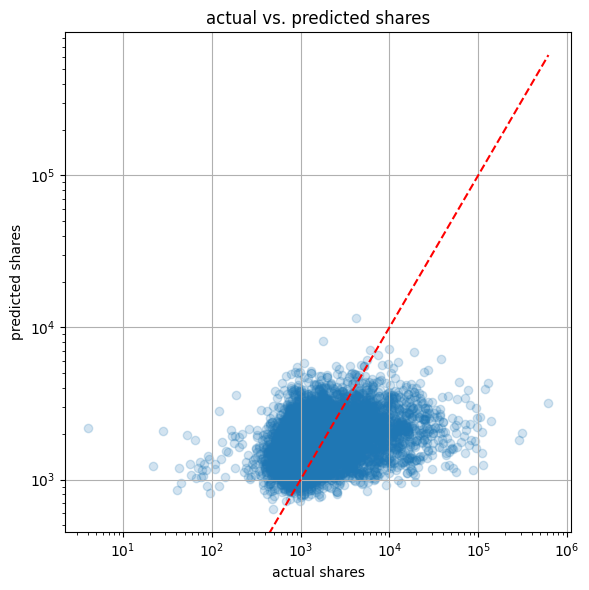

In [ ]:
#print model type
print('linear regression')

#instantiate and train
lr = LinearRegression()
lr.fit(X_train, y_train)

#predict on test set
y_pred = lr.predict(X_test)

#evaluate metrics
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

#print metrics
print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

#append to summary
model_results.append({
    'model': 'linear regression',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

#comparison df
comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})

#print sample of results
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

#scatterplot
plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()

ridge regression
rmse: 0.8666
mae: 0.6418
mape (log-shares): 0.0852
mape (actual shares): 0.8142
r2: 0.1239

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
551            1400              2444
6192           7700              2276
5859           1200              1534
2413           2000               927
6739           2000              2225
3223            536              2187
938             944              1433
2057          34600              2509
5444           2000              1558
7893            701              3200


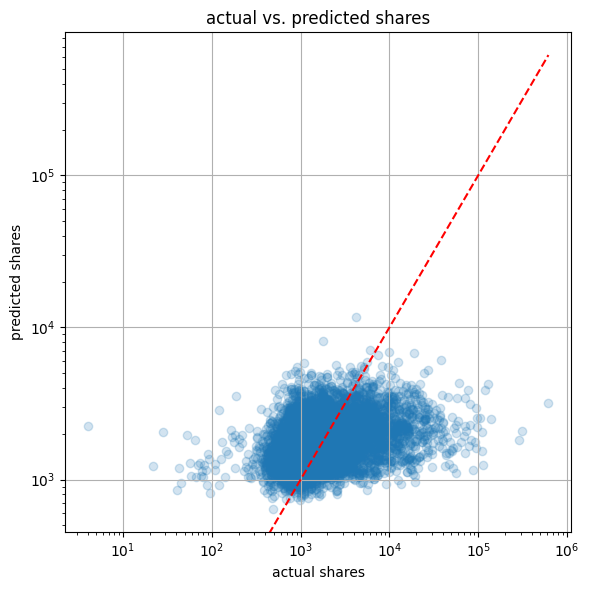

In [ ]:
print('ridge regression')
ridge = Ridge(random_state=33)
ridge.fit(X_train, y_train)
y_pred = ridge.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

model_results.append({
    'model': 'ridge regression',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()

lasso regression
rmse: 0.9259
mae: 0.7033
mape (log-shares): 0.0936
mape (actual shares): 0.8826
r2: -0.0001

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
4148           2200              1767
7574           1300              1767
4369          40000              1767
3407           7100              1767
4400          16100              1767
73              454              1767
3180           1200              1767
7518            938              1767
3547           2000              1767
7570           1300              1767


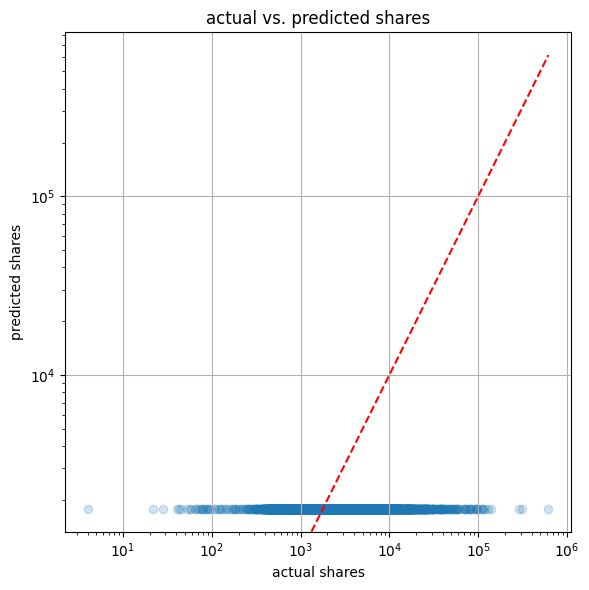

In [ ]:
print('lasso regression')
lasso = Lasso(random_state=33)
lasso.fit(X_train, y_train)
y_pred = lasso.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

model_results.append({
    'model': 'lasso regression',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()


random forest regressor
rmse: 0.8686
mae: 0.6469
mape (log-shares): 0.0861
mape (actual shares): 0.8323
r2: 0.1199

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
817            3300              1635
1118           2000              1324
1636           5000              1923
5108           1100              2331
4404           1700              1836
1295           4800              2676
6650           2500              1735
3477           2200              2044
1085           6100              1846
7783            727              2015


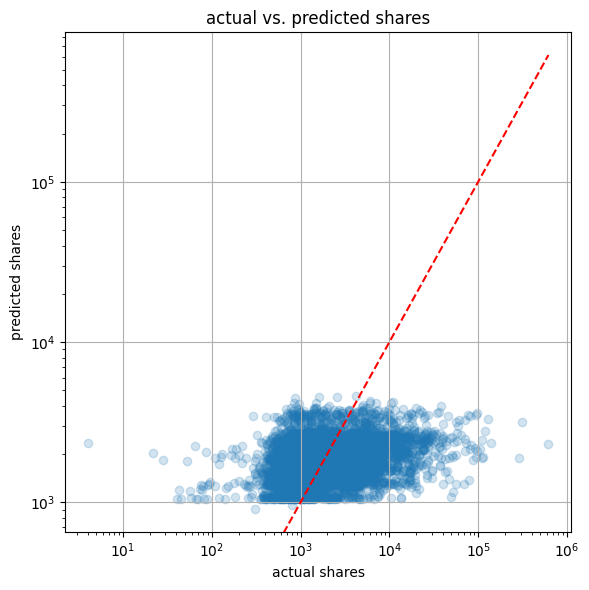

In [ ]:
print('random forest regressor')
rf = RandomForestRegressor(n_estimators=50, max_depth=5, random_state=33)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

model_results.append({
    'model': 'random forest regressor',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()

gradient boosting regressor
rmse: 0.8463
mae: 0.6246
mape (log-shares): 0.0829
mape (actual shares): 0.7851
r2: 0.1644

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
2519          81700              3074
3474           1500              1545
6332           1000              1962
3327            455              1170
2955           1100              2092
992            2800              2635
3742           1700              1370
6080           3300              1379
2454            780              1170
5426           4700              2799


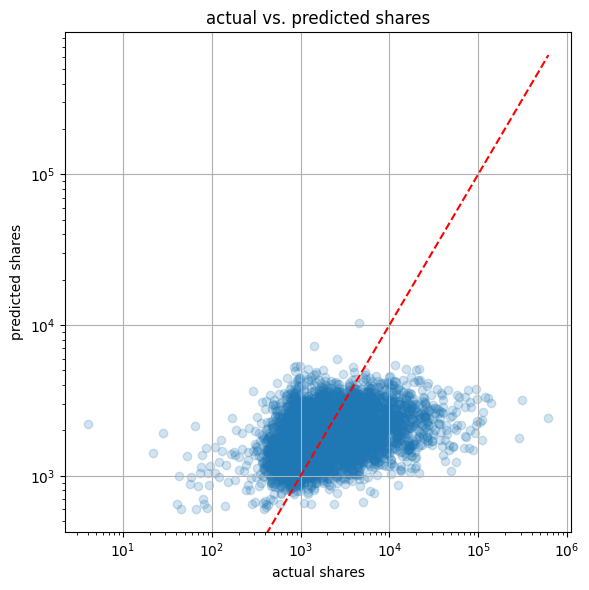

In [ ]:
print('gradient boosting regressor')
gbr = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)
gbr.fit(X_train, y_train)
y_pred = gbr.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

model_results.append({
    'model': 'gradient boosting regressor',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()


xgboost regressor
rmse: 0.9031
mae: 0.6718
mape (log-shares): 0.0891
mape (actual shares): 0.8913
r2: 0.0485

sample predictions (actual vs. predicted shares):
      actual shares  predicted shares
4925           2800              2231
794             557              2564
3255           6800              3369
981            2800              1445
1785           6400              1617
1800            625               947
2273            822               985
7451           3800              1740
1571             41               634
4194           1300              1151


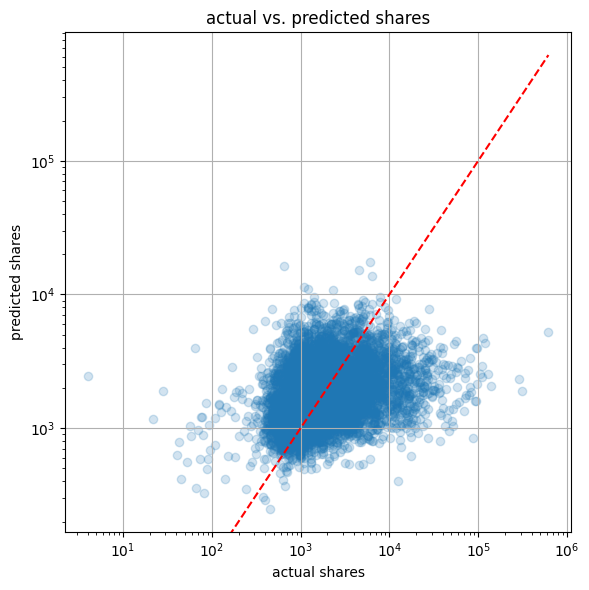

In [ ]:
print('xgboost regressor')
xgb = XGBRegressor(n_estimators=150, max_depth=10, random_state=33)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape_log = mean_absolute_percentage_error(y_test, y_pred)
predicted_shares = np.expm1(y_pred)
mape_actual = mean_absolute_percentage_error(actual_shares, predicted_shares)

print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

model_results.append({
    'model': 'xgboost regressor',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

comparison_df = pd.DataFrame({
    'actual shares': actual_shares,
    'predicted shares': predicted_shares
})
print('\nsample predictions (actual vs. predicted shares):')
print(comparison_df.sample(10).round().astype(int))

plt.figure(figsize=(6, 6))
plt.scatter(actual_shares, predicted_shares, alpha=0.2)
plt.plot([0, max(actual_shares)], [0, max(actual_shares)], color='red', linestyle='--')
plt.xlabel('actual shares')
plt.ylabel('predicted shares')
plt.title('actual vs. predicted shares')
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#import pandas to display summary if not already imported
import pandas as pd

#convert list of results to DataFrame
results_df = pd.DataFrame(model_results)

#reorder columns
results_df = results_df[['model', 'rmse', 'mae', 'mape_log', 'mape_actual', 'r2']]

#sort by actual MAPE (ascending = better)
results_df = results_df.sort_values(by='mape_actual')

#save model results summary as pickle
results_df.to_pickle('./content/OnlineNewsPopularity/asp_model_results_summary.pkl')

#save model results summary as csv
results_df.to_csv('./content/OnlineNewsPopularity/asp_model_results_summary.csv', index=False)

#print the summary table
results_df

,model,rmse,mae,mape_log,mape_actual,r2
4,gradient boosting regressor,0.846323,0.624634,0.082904,0.785088,0.164428
0,linear regression,0.867304,0.642525,0.085332,0.813759,0.122487
1,ridge regression,0.866596,0.641822,0.085241,0.814175,0.123918
3,random forest regressor,0.868591,0.646905,0.086059,0.832261,0.119880
2,lasso regression,0.925897,0.703341,0.093642,0.882649,-0.000084
5,xgboost regressor,0.903115,0.671789,0.089131,0.891315,0.048525


/tmp/ipython-input-16-1144832675.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=results_df, x='mape_actual', y='model', palette='viridis')


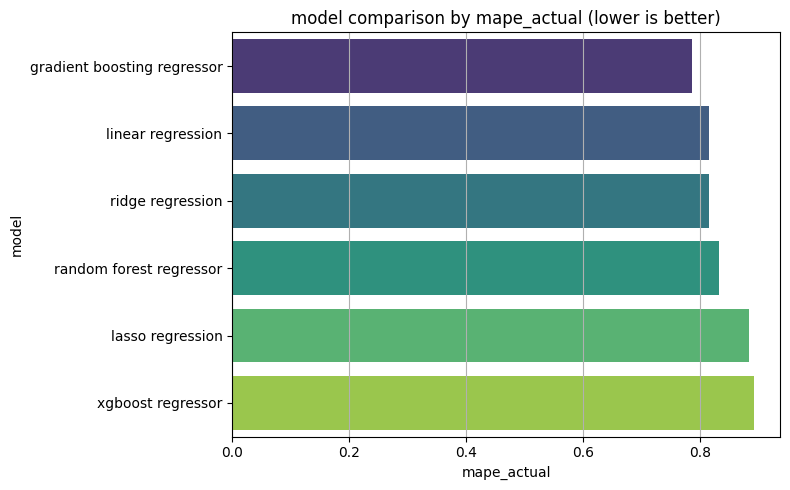

In [ ]:
#barplot of rmse by model
plt.figure(figsize=(8, 5))
sns.barplot(data=results_df, x='mape_actual', y='model', palette='viridis')
plt.title('model comparison by mape_actual (lower is better)')
plt.xlabel('mape_actual')
plt.ylabel('model')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [ ]:
#correlation analysis
import seaborn as sns
import matplotlib.pyplot as plt

#make copy as to not modify the original df
df_corr = art_share_pred.copy()

#compute log-transformed target for corr analysis
df_corr['log_shares'] = np.log1p(df_corr['shares'])

#select only numeric cols
numeric_cols = df_corr.select_dtypes(include=[np.number])

#compute corr matrix
corr_matrix = numeric_cols.corr()

#get corr vals with shares and log_shares
shares_corr = corr_matrix['shares'].drop(['shares', 'log_shares'], errors='ignore').sort_values(ascending=False)
log_shares_corr = corr_matrix['log_shares'].drop(['shares', 'log_shares'], errors='ignore').sort_values(ascending=False)

In [ ]:
#print corr sum raw shares
print('\nall feature correlations with raw shares:\n')
print(shares_corr)


all feature correlations with raw shares:

kw_avg_avg                       0.110413
LDA_03                           0.083771
kw_max_avg                       0.064306
self_reference_avg_sharess       0.057789
self_reference_min_shares        0.055958
self_reference_max_shares        0.047115
num_hrefs                        0.045404
kw_avg_max                       0.044686
kw_min_avg                       0.039551
num_imgs                         0.039388
global_subjectivity              0.031604
kw_avg_min                       0.030406
kw_max_min                       0.030114
abs_title_sentiment_polarity     0.027135
num_videos                       0.023936
title_subjectivity               0.021967
num_keywords                     0.021818
is_weekend                       0.016958
weekday_is_saturday              0.015082
title_sentiment_polarity         0.012772
avg_positive_polarity            0.012142
max_positive_polarity            0.010068
weekday_is_monday               

In [ ]:
#print corr sum log shares
print('\nall feature correlations with log(shares):\n')
print(log_shares_corr)


all feature correlations with log(shares):

kw_avg_avg                       0.221822
LDA_03                           0.126037
is_weekend                       0.114391
kw_max_avg                       0.109343
kw_min_avg                       0.108850
num_hrefs                        0.105142
num_imgs                         0.091519
self_reference_avg_sharess       0.087238
data_channel_is_socmed           0.081144
weekday_is_saturday              0.079158
self_reference_max_shares        0.077442
weekday_is_sunday                0.076969
global_subjectivity              0.075174
self_reference_min_shares        0.073374
num_keywords                     0.065945
kw_avg_max                       0.059678
abs_title_sentiment_polarity     0.059191
data_channel_is_tech             0.054539
title_subjectivity               0.052712
title_sentiment_polarity         0.051038
global_sentiment_polarity        0.048927
LDA_04                           0.044744
global_rate_positive_words     

Analyzing correlation coefficients of embeddings with target variable

title embeddings correlation statistics (with log_shares):
count    64.000000
mean      0.007652
std       0.007027
min       0.000169
25%       0.002283
50%       0.004819
75%       0.011276
max       0.029735
Name: log_shares, dtype: float64

content embeddings correlation statistics (with log_shares):
count    384.000000
mean       0.008888
std        0.006248
min        0.000006
25%        0.003616
50%        0.008064
75%        0.012941
max        0.030151
Name: log_shares, dtype: float64

title embeddings correlation statistics (with raw shares):
count    64.000000
mean      0.004730
std       0.003136
min       0.000289
25%       0.002221
50%       0.004226
75%       0.007013
max       0.012841
Name: shares, dtype: float64

content embeddings correlation statistics (with raw shares):
count    384.000000
mean       0.004507
std        0.003313
min        0.000045
25%        0.001838
50%        0.003832
75%    

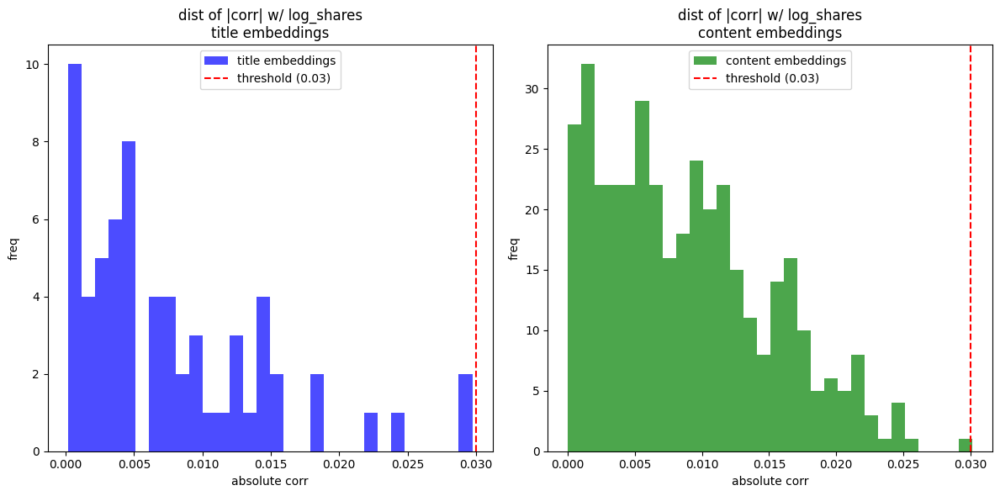

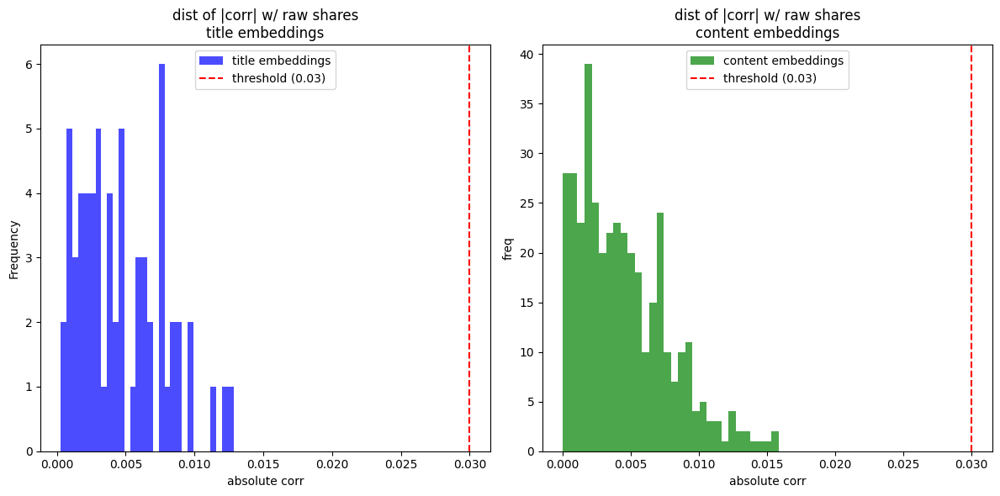

/tmp/ipython-input-20-4012143294.py:113: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=labels)


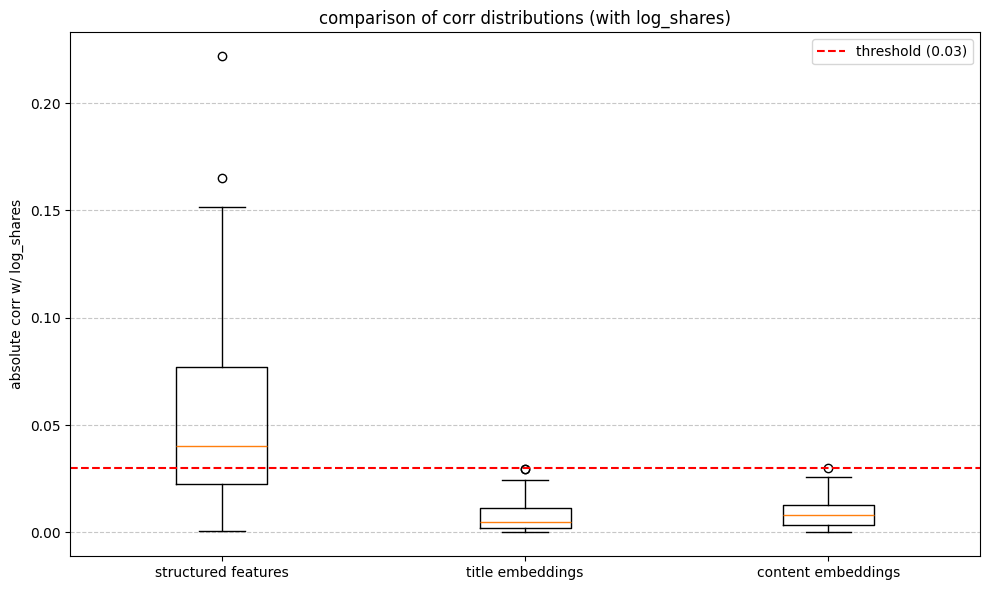

/tmp/ipython-input-20-4012143294.py:130: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_raw, labels=labels)


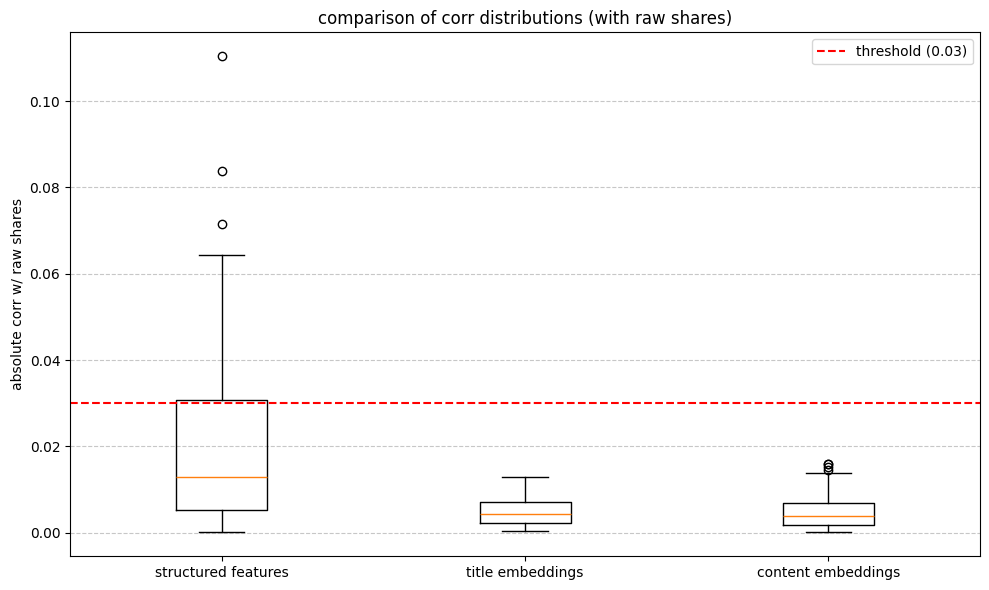

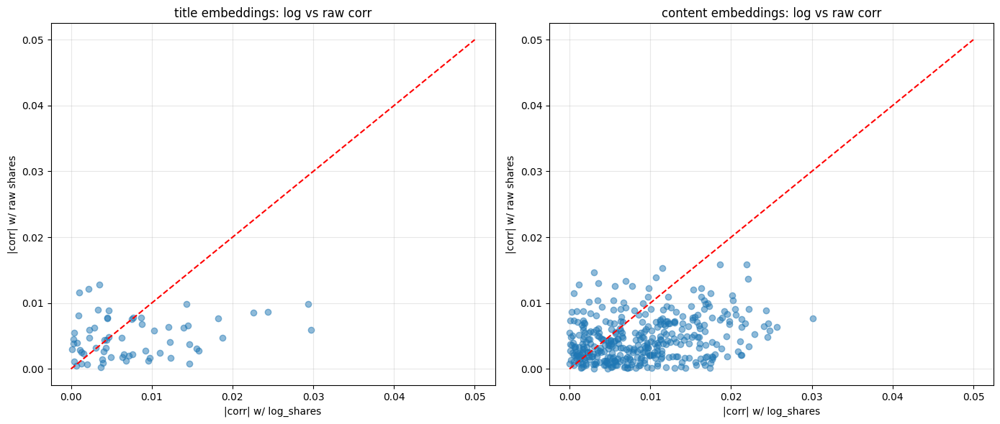

In [ ]:
#analyze corr coeffs of embeddings w/ target variable
print("Analyzing correlation coefficients of embeddings with target variable")

#create dfs with embeddings
title_emb_df = pd.DataFrame(title_embeddings_small,
                           columns=[f'title_emb_{i}' for i in range(title_embeddings_small.shape[1])])
title_emb_df['log_shares'] = y_all

content_emb_df = pd.DataFrame(content_embeddings,
                             columns=[f'content_emb_{i}' for i in range(content_embeddings.shape[1])])
content_emb_df['log_shares'] = y_all

#calc corrs w/ log_shares
title_emb_corrs = title_emb_df.corr()['log_shares'].drop('log_shares')
content_emb_corrs = content_emb_df.corr()['log_shares'].drop('log_shares')

#calc corrs w/ raw shares
title_emb_df['shares'] = art_share_pred['shares']
content_emb_df['shares'] = art_share_pred['shares']
title_shares_corrs = title_emb_df.corr()['shares'].drop(['log_shares', 'shares'])
content_shares_corrs = content_emb_df.corr()['shares'].drop(['log_shares', 'shares'])

#analyze dist of corr values (absolute)
print("\ntitle embeddings correlation statistics (with log_shares):")
print(title_emb_corrs.abs().describe())

print("\ncontent embeddings correlation statistics (with log_shares):")
print(content_emb_corrs.abs().describe())

print("\ntitle embeddings correlation statistics (with raw shares):")
print(title_shares_corrs.abs().describe())

print("\ncontent embeddings correlation statistics (with raw shares):")
print(content_shares_corrs.abs().describe())

#count embeddings w/ corr above threshold
correlation_threshold = 0.03
title_strong_log = (title_emb_corrs.abs() >= correlation_threshold).sum()
content_strong_log = (content_emb_corrs.abs() >= correlation_threshold).sum()
title_strong_raw = (title_shares_corrs.abs() >= correlation_threshold).sum()
content_strong_raw = (content_shares_corrs.abs() >= correlation_threshold).sum()

print(f"\ntitle embeddings with |correlation| >= {correlation_threshold} with log_shares: {title_strong_log} out of {title_emb_corrs.shape[0]} ({title_strong_log/title_emb_corrs.shape[0]:.1%})")
print(f"content embeddings with |correlation| >= {correlation_threshold} with log_shares: {content_strong_log} out of {content_emb_corrs.shape[0]} ({content_strong_log/content_emb_corrs.shape[0]:.1%})")
print(f"title embeddings with |correlation| >= {correlation_threshold} with raw shares: {title_strong_raw} out of {title_shares_corrs.shape[0]} ({title_strong_raw/title_shares_corrs.shape[0]:.1%})")
print(f"content embeddings with |correlation| >= {correlation_threshold} with raw shares: {content_strong_raw} out of {content_shares_corrs.shape[0]} ({content_strong_raw/content_shares_corrs.shape[0]:.1%})")

#show top 10 most correlated embedding dimensions for each
print("\ntop 10 title embedding dimensions by corr w/ log_shares:")
print(title_emb_corrs.abs().sort_values(ascending=False).head(10))

print("\ntop 10 content embedding dimensions by corr w/ log_shares:")
print(content_emb_corrs.abs().sort_values(ascending=False).head(10))

print("\ntop 10 title embedding dimensions by corr w/ raw shares:")
print(title_shares_corrs.abs().sort_values(ascending=False).head(10))

print("\ntop 10 content embedding dimensions by corr w/ raw shares:")
print(content_shares_corrs.abs().sort_values(ascending=False).head(10))

#viz dist of corr coefficients - log
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(title_emb_corrs.abs(), bins=30, alpha=0.7, color='blue', label='title embeddings')
plt.axvline(x=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('dist of |corr| w/ log_shares\ntitle embeddings')
plt.xlabel('absolute corr')
plt.ylabel('freq')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(content_emb_corrs.abs(), bins=30, alpha=0.7, color='green', label='content embeddings')
plt.axvline(x=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('dist of |corr| w/ log_shares\ncontent embeddings')
plt.xlabel('absolute corr')
plt.ylabel('freq')
plt.legend()

plt.tight_layout()
plt.show()

#viz dist of corr coefficients - raw
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(title_shares_corrs.abs(), bins=30, alpha=0.7, color='blue', label='title embeddings')
plt.axvline(x=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('dist of |corr| w/ raw shares\ntitle embeddings')
plt.xlabel('absolute corr')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(content_shares_corrs.abs(), bins=30, alpha=0.7, color='green', label='content embeddings')
plt.axvline(x=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('dist of |corr| w/ raw shares\ncontent embeddings')
plt.xlabel('absolute corr')
plt.ylabel('freq')
plt.legend()

plt.tight_layout()
plt.show()

#compare corr dists between structured features and embeddings - log
plt.figure(figsize=(10, 6))
structured_corrs = log_shares_corr.abs()

#create boxplots
data = [structured_corrs, title_emb_corrs.abs(), content_emb_corrs.abs()]
labels = ['structured features', 'title embeddings', 'content embeddings']

plt.boxplot(data, labels=labels)
plt.axhline(y=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('comparison of corr distributions (with log_shares)')
plt.ylabel('absolute corr w/ log_shares')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#compare corr dists between structured features and embeddings - raw
plt.figure(figsize=(10, 6))
structured_corrs_raw = shares_corr.abs()

#create boxplots for raw shares
data_raw = [structured_corrs_raw, title_shares_corrs.abs(), content_shares_corrs.abs()]
labels = ['structured features', 'title embeddings', 'content embeddings']

plt.boxplot(data_raw, labels=labels)
plt.axhline(y=correlation_threshold, color='red', linestyle='--', label=f'threshold ({correlation_threshold})')
plt.title('comparison of corr distributions (with raw shares)')
plt.ylabel('absolute corr w/ raw shares')
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#side-by-side comparison of log vs raw corrs
plt.figure(figsize=(14, 6))

#title embeddings comparison
plt.subplot(1, 2, 1)
plt.scatter(title_emb_corrs.abs(), title_shares_corrs.abs(), alpha=0.5)
plt.plot([0, 0.05], [0, 0.05], 'r--')
plt.xlabel('|corr| w/ log_shares')
plt.ylabel('|corr| w/ raw shares')
plt.title('title embeddings: log vs raw corr')
plt.grid(True, alpha=0.3)

#content embeddings comparison
plt.subplot(1, 2, 2)
plt.scatter(content_emb_corrs.abs(), content_shares_corrs.abs(), alpha=0.5)
plt.plot([0, 0.05], [0, 0.05], 'r--')
plt.xlabel('|corr| w/ log_shares')
plt.ylabel('|corr| w/ raw shares')
plt.title('content embeddings: log vs raw corr')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [ ]:
#feature selection based on corr w/ target var (no embeddings)
print("feature selection based on corr w/ target var (both log and raw shares) - no embeddings")

#set corr threshold
correlation_threshold = 0.03

#get corrs w/ log_shares and raw shares
log_shares_corr_abs = log_shares_corr.abs()
shares_corr_abs = shares_corr.abs()

#identify features with corr above threshold for either log shares or raw shares
strong_features_log = log_shares_corr_abs[log_shares_corr_abs >= correlation_threshold].index.tolist()
strong_features_raw = shares_corr_abs[shares_corr_abs >= correlation_threshold].index.tolist()

#combine strong features from both sets (union)
strong_features = list(set(strong_features_log + strong_features_raw))
weak_features = [f for f in structured_features if f not in strong_features]

print(f"\nfeatures with corr >= {correlation_threshold} w/ log_shares: {len(strong_features_log)}")
print(f"features with corr >= {correlation_threshold} w/ raw shares: {len(strong_features_raw)}")
print(f"combined unique strong features: {len(strong_features)}")
print(f"features with corr < {correlation_threshold} w/ both: {len(weak_features)}")

print("\ntop 10 strongest corrs w/ log_shares:")
print(log_shares_corr.abs().sort_values(ascending=False).head(10))

print("\ntop 10 strongest corrs w/ raw shares:")
print(shares_corr.abs().sort_values(ascending=False).head(10))

#create indices for strong features
strong_structured_indices = [i for i, feature in enumerate(structured_features) if feature in strong_features]

#create reduced feature matrix - structured features only (no embeddings)
X_structured_reduced = X_structured_scaled[:, strong_structured_indices]
print(f"\nreduced structured feature matrix shape: {X_structured_reduced.shape} (was {X_structured_scaled.shape})")

#no embeddings: use only structured features
X_all_reduced_no_embeddings = X_structured_reduced
print(f"final reduced feature matrix shape: {X_all_reduced_no_embeddings.shape} (was {X_all.shape}) - embeddings dropped")
print(f"total feature reduction: {X_all.shape[1] - X_all_reduced_no_embeddings.shape[1]} features removed ({(1 - X_all_reduced_no_embeddings.shape[1]/X_all.shape[1])*100:.1f}% reduction)")

#split into train and test sets
X_train_reduced_no_embeddings, X_test_reduced_no_embeddings, y_train_reduced_no_embeddings, y_test_reduced_no_embeddings = train_test_split(
    X_all_reduced_no_embeddings, y_all, test_size=0.2, random_state=33
)

print(f"reduced training set shape (no embeddings): {X_train_reduced_no_embeddings.shape} (was {X_train.shape})")
print(f"reduced test set shape (no embeddings): {X_test_reduced_no_embeddings.shape} (was {X_test.shape})")
print(f"note: y_train_reduced_no_embeddings and y_test_reduced_no_embeddings contain the same target values as the original split")


feature selection based on corr w/ target var (both log and raw shares) - no embeddings

features with corr >= 0.03 w/ log_shares: 41
features with corr >= 0.03 w/ raw shares: 17
combined unique strong features: 41
features with corr < 0.03 w/ both: 19

top 10 strongest corrs w/ log_shares:
kw_avg_avg               0.221822
LDA_02                   0.165076
data_channel_is_world    0.151685
LDA_03                   0.126037
channel                  0.118830
is_weekend               0.114391
kw_max_avg               0.109343
kw_min_avg               0.108850
num_hrefs                0.105142
num_imgs                 0.091519
Name: log_shares, dtype: float64

top 10 strongest corrs w/ raw shares:
kw_avg_avg                    0.110413
LDA_03                        0.083771
channel                       0.071568
kw_max_avg                    0.064306
LDA_02                        0.059163
self_reference_avg_sharess    0.057789
self_reference_min_shares     0.055958
data_channel_is_world  

In [ ]:
#evaluate baseline GBR with structured features only (no embeddings)
print("evaluating baseline GBR with structured features only (no embeddings)")

#create and train a standard GBR with default hyperparameters
gbr_baseline = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)
print("training GBR with structured features only...")
gbr_baseline.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)

#evaluate on test set
y_pred = gbr_baseline.predict(X_test_reduced_no_embeddings)
rmse = np.sqrt(mean_squared_error(y_test_reduced_no_embeddings, y_pred))
mae = mean_absolute_error(y_test_reduced_no_embeddings, y_pred)
r2 = r2_score(y_test_reduced_no_embeddings, y_pred)
mape_log = mean_absolute_percentage_error(y_test_reduced_no_embeddings, y_pred)
predicted_shares = np.expm1(y_pred)
actual_shares_for_eval = np.expm1(y_test_reduced_no_embeddings)
mape_actual = mean_absolute_percentage_error(actual_shares_for_eval, predicted_shares)

print(f'baseline GBR metrics (no embeddings):')
print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

#remove any previous "no embeddings" results to avoid duplicates
model_results = [result for result in model_results if "no embeddings" not in result['model']]

#add new result to model_results
model_results.append({
    'model': 'gradient boosting (structured features only, no embeddings)',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

#compare with previous GBR model that used all features
print("\ncomparing with previous GBR model (with embeddings):")
prev_gbr_results = next((item for item in model_results if item['model'] == 'gradient boosting regressor'), None)
if prev_gbr_results:
    print(f"previous GBR (with embeddings) RMSE: {prev_gbr_results['rmse']:.4f}")
    print(f"previous GBR (with embeddings) MAE: {prev_gbr_results['mae']:.4f}")
    print(f"previous GBR (with embeddings) MAPE (log): {prev_gbr_results['mape_log']:.4f}")
    print(f"previous GBR (with embeddings) MAPE (actual): {prev_gbr_results['mape_actual']:.4f}")
    print(f"previous GBR (with embeddings) R²: {prev_gbr_results['r2']:.4f}")

    #calculate differences
    rmse_diff = rmse - prev_gbr_results['rmse']
    mae_diff = mae - prev_gbr_results['mae']
    mape_log_diff = mape_log - prev_gbr_results['mape_log']
    mape_actual_diff = mape_actual - prev_gbr_results['mape_actual']
    r2_diff = r2 - prev_gbr_results['r2']

    print(f"\ndifferences (no embeddings - with embeddings):")
    print(f"rmse difference: {rmse_diff:.4f} ({'worse' if rmse_diff > 0 else 'better'})")
    print(f"mae difference: {mae_diff:.4f} ({'worse' if mae_diff > 0 else 'better'})")
    print(f"mape (log) difference: {mape_log_diff:.4f} ({'worse' if mape_log_diff > 0 else 'better'})")
    print(f"mape (actual) difference: {mape_actual_diff:.4f} ({'worse' if mape_actual_diff > 0 else 'better'})")
    print(f"r2 difference: {r2_diff:.4f} ({'better' if r2_diff > 0 else 'worse'})")

#update results df
results_df = pd.DataFrame(model_results)
results_df = results_df[['model', 'rmse', 'mae', 'mape_log', 'mape_actual', 'r2']]
results_df = results_df.sort_values(by='mape_actual')

#create a comparison df specifically for GBR models with and without embeddings
gbr_comparison = pd.DataFrame({
    'metric': ['rmse', 'mae', 'mape (log)', 'mape (actual)', 'r2'],
    'with_embeddings': [prev_gbr_results['rmse'], prev_gbr_results['mae'],
                        prev_gbr_results['mape_log'], prev_gbr_results['mape_actual'],
                        prev_gbr_results['r2']],
    'no_embeddings': [rmse, mae, mape_log, mape_actual, r2],
    'difference': [rmse_diff, mae_diff, mape_log_diff, mape_actual_diff, r2_diff],
    'better_model': ['with embeddings' if rmse_diff > 0 else 'no embeddings',
                    'no embeddings' if mae_diff < 0 else 'with embeddings',
                    'no embeddings' if mape_log_diff < 0 else 'with embeddings',
                    'with embeddings' if mape_actual_diff > 0 else 'no embeddings',
                    'with embeddings' if r2_diff < 0 else 'no embeddings']
})

#save results to csv
results_df.to_csv('gbr_results_summary.csv', index=False)
gbr_comparison.to_csv('gbr_comparison.csv', index=False)

print("\nresults saved to 'gbr_results_summary.csv' and detailed GBR comparison saved to 'gbr_comparison.csv'")

#display updated results
results_df


evaluating baseline GBR with structured features only (no embeddings)
training GBR with structured features only...
baseline GBR metrics (no embeddings):
rmse: 0.8513
mae: 0.6271
mape (log-shares): 0.0833
mape (actual shares): 0.7932
r2: 0.1545

comparing with previous GBR model (with embeddings):
previous GBR (with embeddings) RMSE: 0.8463
previous GBR (with embeddings) MAE: 0.6246
previous GBR (with embeddings) MAPE (log): 0.0829
previous GBR (with embeddings) MAPE (actual): 0.7851
previous GBR (with embeddings) R²: 0.1644

differences (no embeddings - with embeddings):
rmse difference: 0.0050 (worse)
mae difference: 0.0024 (worse)
mape (log) difference: 0.0004 (worse)
mape (actual) difference: 0.0081 (worse)
r2 difference: -0.0099 (worse)

results saved to 'gbr_results_summary.csv' and detailed GBR comparison saved to 'gbr_comparison.csv'


,model,rmse,mae,mape_log,mape_actual,r2
4,gradient boosting regressor,0.846323,0.624634,0.082904,0.785088,0.164428
6,"gradient boosting (structured features only, n...",0.851341,0.627058,0.083317,0.793217,0.154491
0,linear regression,0.867304,0.642525,0.085332,0.813759,0.122487
1,ridge regression,0.866596,0.641822,0.085241,0.814175,0.123918
3,random forest regressor,0.868591,0.646905,0.086059,0.832261,0.119880
2,lasso regression,0.925897,0.703341,0.093642,0.882649,-0.000084
5,xgboost regressor,0.903115,0.671789,0.089131,0.891315,0.048525


In [ ]:
#(OPTIONAL) hyperparameter tuning for GBR with no embeddings
from sklearn.model_selection import GridSearchCV

print("(OPTIONAL) hyperparameter tuning for GBR with no embeddings")
print("NOTE: you can run this cell after evaluating the baseline results if you want to optimize further")

#define parameter grid
param_grid = {
    'n_estimators': [50, 75],
    'max_depth': [5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'min_samples_split': [2, 5, 10],
    'subsample': [0.8, 1.0]
}

#create base model
gbr_no_embeddings = GradientBoostingRegressor(random_state=33)

#create GridSearchCV object with 3-fold cross-validation
grid_search_no_embeddings = GridSearchCV(
    estimator=gbr_no_embeddings,
    param_grid=param_grid,
    cv=3,
    scoring='neg_mean_absolute_percentage_error',
    n_jobs=-1,
    verbose=1
)

#fit the grid search using no-embeddings feature set
print("starting grid search w/ structured features only (no embeddings)...")
print(f"using {X_train_reduced_no_embeddings.shape[1]} features instead of {X_train.shape[1]} (reduced by {X_train.shape[1] - X_train_reduced_no_embeddings.shape[1]} features)")

grid_search_no_embeddings.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)

#print best parameters and score
print(f"best parameters: {grid_search_no_embeddings.best_params_}")
print(f"best negative MAPE: {grid_search_no_embeddings.best_score_:.4f}")

#get best model
best_gbr_no_embeddings = grid_search_no_embeddings.best_estimator_

#evaluate on test set
y_pred = best_gbr_no_embeddings.predict(X_test_reduced_no_embeddings)
rmse = np.sqrt(mean_squared_error(y_test_reduced_no_embeddings, y_pred))
mae = mean_absolute_error(y_test_reduced_no_embeddings, y_pred)
r2 = r2_score(y_test_reduced_no_embeddings, y_pred)
mape_log = mean_absolute_percentage_error(y_test_reduced_no_embeddings, y_pred)
predicted_shares = np.expm1(y_pred)
actual_shares_for_eval = np.expm1(y_test_reduced_no_embeddings)
mape_actual = mean_absolute_percentage_error(actual_shares_for_eval, predicted_shares)

print(f'tuned model metrics (no embeddings):')
print(f'rmse: {rmse:.4f}')
print(f'mae: {mae:.4f}')
print(f'mape (log-shares): {mape_log:.4f}')
print(f'mape (actual shares): {mape_actual:.4f}')
print(f'r2: {r2:.4f}')

#compare with baseline GBR (no embeddings)
baseline_no_emb_results = next((item for item in model_results if item['model'] == 'gradient boosting (structured features only, no embeddings)'), None)
if baseline_no_emb_results:
    print("\ncomparing with baseline GBR (no embeddings):")
    print(f"improvement in RMSE: {baseline_no_emb_results['rmse'] - rmse:.4f}")
    print(f"improvement in MAE: {baseline_no_emb_results['mae'] - mae:.4f}")
    print(f"improvement in MAPE (log): {baseline_no_emb_results['mape_log'] - mape_log:.4f}")
    print(f"improvement in MAPE (actual): {baseline_no_emb_results['mape_actual'] - mape_actual:.4f}")
    print(f"improvement in R²: {r2 - baseline_no_emb_results['r2']:.4f}")

#add to model results
model_results.append({
    'model': 'tuned gradient boosting (structured features only, no embeddings)',
    'rmse': rmse,
    'mae': mae,
    'mape_log': mape_log,
    'mape_actual': mape_actual,
    'r2': r2
})

#update results df
results_df = pd.DataFrame(model_results)
results_df = results_df[['model', 'rmse', 'mae', 'mape_log', 'mape_actual', 'r2']]
results_df = results_df.sort_values(by='mape_actual')

#save updated results
results_df.to_pickle('/Users/croy/Documents/m2/asp_model_results_summary.pkl')
results_df.to_parquet('/Users/croy/Documents/m2/asp_model_results_summary.parquet')
results_df.to_csv('/Users/croy/Documents/m2/asp_model_results_summary.csv', index=False)

#display updated results
results_df


In [ ]:
#clear the tuned model if baseline performed better
if 'best_gbr_no_embeddings' in locals():
    del best_gbr_no_embeddings

In [ ]:
#cross-validation evaluation for all models
from sklearn.model_selection import cross_val_score

print("cross-validation results for all model families")

#define models to evaluate
models = {
    'linear regression': LinearRegression(),
    'ridge regression': Ridge(random_state=33),
    'lasso regression': Lasso(random_state=33),
    'random forest': RandomForestRegressor(n_estimators=50, max_depth=5, random_state=33),
    'gradient boosting': GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33),
    'XGBoost': XGBRegressor(n_estimators=150, max_depth=10, random_state=33)
}

#add the best model from hyperparameter tuning if available
if 'best_gbr_no_embeddings' in locals():
    models['tuned gradient boosting'] = best_gbr_no_embeddings

#metrics to evaluate
metrics = {
    'neg_root_mean_squared_error': 'rmse',
    'neg_mean_absolute_error': 'mae',
    'r2': 'r2'
}

#store results
cv_results = []

#use reduced_no_embedding feature set for cross-validation
X_for_cv = X_all_reduced_no_embeddings
print(f"using reduced_no_embedding feature set for cross-validation (shape: {X_for_cv.shape})")

#perform 5-fold cross-validation for each model and metric
for model_name, model in models.items():
    print(f"\nevaluating {model_name}...")
    model_results = {'model': model_name}

    for metric_name, metric_label in metrics.items():
        scores = cross_val_score(model, X_for_cv, y_all, cv=5, scoring=metric_name, n_jobs=-1)

        #for negative metrics, convert to positive
        if metric_name.startswith('neg_'):
            scores = -scores

        mean_score = scores.mean()
        std_score = scores.std()

        print(f"{metric_label}: {mean_score:.8f} ± {std_score:.8f}")
        model_results[f'{metric_label} Mean'] = mean_score
        model_results[f'{metric_label} Std'] = std_score

    cv_results.append(model_results)

#create df with results
cv_results_df = pd.DataFrame(cv_results)

#display results
cv_results_df


cross-validation results for all model families
using reduced_no_embedding feature set for cross-validation (shape: (39644, 40))

evaluating linear regression...
rmse: 0.87777903 ± 0.04794180
mae: 0.64981992 ± 0.04933782
r2: 0.09866562 ± 0.04167873

evaluating ridge regression...
rmse: 0.87777867 ± 0.04794342
mae: 0.64982362 ± 0.04934188
r2: 0.09866672 ± 0.04167453

evaluating lasso regression...
rmse: 0.93043022 ± 0.04936146
mae: 0.70546061 ± 0.04432542
r2: -0.01189570 ± 0.00779387

evaluating random forest...
rmse: 0.88059656 ± 0.04630324
mae: 0.65641316 ± 0.04429576
r2: 0.09206775 ± 0.05457923

evaluating gradient boosting...
rmse: 0.87623884 ± 0.05355387
mae: 0.64691213 ± 0.04831837
r2: 0.09890181 ± 0.09505290

evaluating XGBoost...
rmse: 0.94256044 ± 0.05357683
mae: 0.70403499 ± 0.04781817
r2: -0.04254329 ± 0.10275763


,model,rmse Mean,rmse Std,mae Mean,mae Std,r2 Mean,r2 Std
0,linear regression,0.877779,0.047942,0.649820,0.049338,0.098666,0.041679
1,ridge regression,0.877779,0.047943,0.649824,0.049342,0.098667,0.041675
2,lasso regression,0.930430,0.049361,0.705461,0.044325,-0.011896,0.007794
3,random forest,0.880597,0.046303,0.656413,0.044296,0.092068,0.054579
4,gradient boosting,0.876239,0.053554,0.646912,0.048318,0.098902,0.095053
5,XGBoost,0.942560,0.053577,0.704035,0.047818,-0.042543,0.102758


feature importance analysis for GBR
using reduced_no_embedding feature set for training

top 20 most important features for gradient boosting (no embeddings):
                          feature  importance
16                     kw_avg_avg    0.274986
19     self_reference_avg_sharess    0.079808
17      self_reference_min_shares    0.058272
0                       num_hrefs    0.049416
15                     kw_max_avg    0.047431
24                     is_weekend    0.046129
13                     kw_avg_max    0.037852
14                     kw_min_avg    0.033975
12                     kw_avg_min    0.028906
6   data_channel_is_entertainment    0.026485
25                         LDA_00    0.026139
27                         LDA_02    0.025228
3            average_token_length    0.024399
9            data_channel_is_tech    0.022937
1                        num_imgs    0.021501
26                         LDA_01    0.017969
30            global_subjectivity    0.017808
8          da

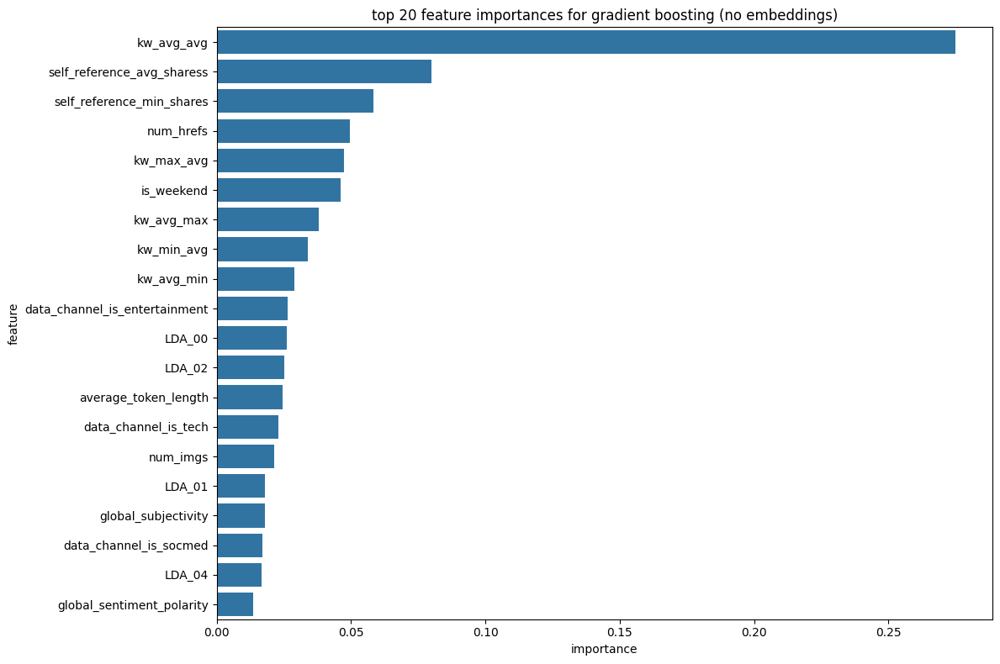

In [ ]:
#feature importance analysis for GBR
print("feature importance analysis for GBR")

#get the best model (either tuned or original)
if 'best_gbr_no_embeddings' in locals():
    best_model = best_gbr_no_embeddings
    model_name = "tuned gradient boosting (no embeddings)"
else:
    best_model = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)
    #use reduced_no_embedding features
    best_model.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)
    print("using reduced_no_embedding feature set for training")
    model_name = "gradient boosting (no embeddings)"

#get feature importances
importances = best_model.feature_importances_

#create a df for feature importances
#for reduced_no_embedding features, we need the correct feature names
strong_feature_names = [structured_features[i] for i in strong_structured_indices]
feature_names = strong_feature_names

importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
})

#sort by importance
importance_df = importance_df.sort_values('importance', ascending=False)

#display top 20 most important features
print(f"\ntop 20 most important features for {model_name}:")
top_20_features = importance_df.head(20)
print(top_20_features)

#visualize top features
plt.figure(figsize=(12, 8))
sns.barplot(data=top_20_features, x='importance', y='feature')
plt.title(f'top 20 feature importances for {model_name}')
plt.tight_layout()
plt.show()

ablation study: testing model performance w/ diff feature subsets
using reduced_no_embedding feature set for ablation study

evaluating all features...
rmse: 0.8513
mae: 0.6271
mape (log-shares): 0.0833
mape (actual shares): 0.7932
r2: 0.1545

evaluating top 5 features...
rmse: 0.8720
mae: 0.6527
mape (log-shares): 0.0869
mape (actual shares): 0.8310
r2: 0.1129

evaluating top 10 features...
rmse: 0.8579
mae: 0.6339
mape (log-shares): 0.0843
mape (actual shares): 0.8186
r2: 0.1413

evaluating top 20 features...
rmse: 0.8517
mae: 0.6284
mape (log-shares): 0.0835
mape (actual shares): 0.8014
r2: 0.1538

evaluating bottom half features...
rmse: 0.8860
mae: 0.6644
mape (log-shares): 0.0884
mape (actual shares): 0.8338
r2: 0.0842

evaluating all except top 5...
rmse: 0.8637
mae: 0.6389
mape (log-shares): 0.0849
mape (actual shares): 0.8134
r2: 0.1298

ablation study results (sorted by mape):


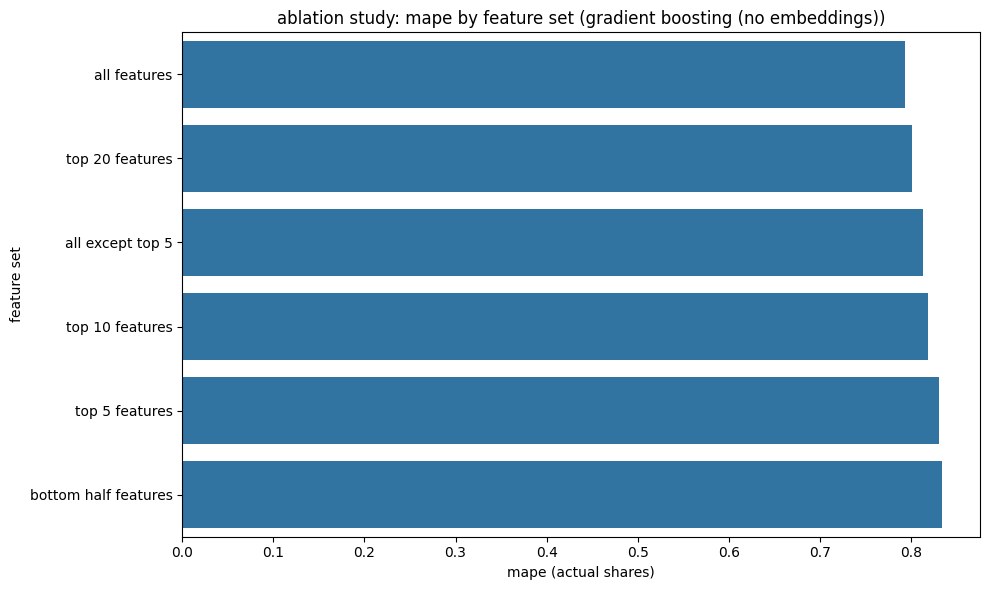

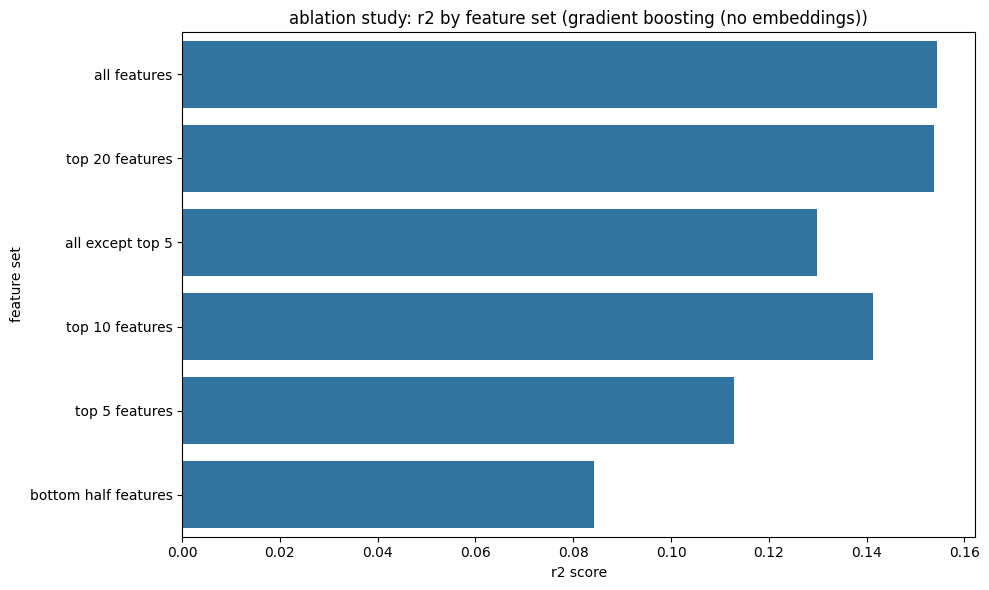

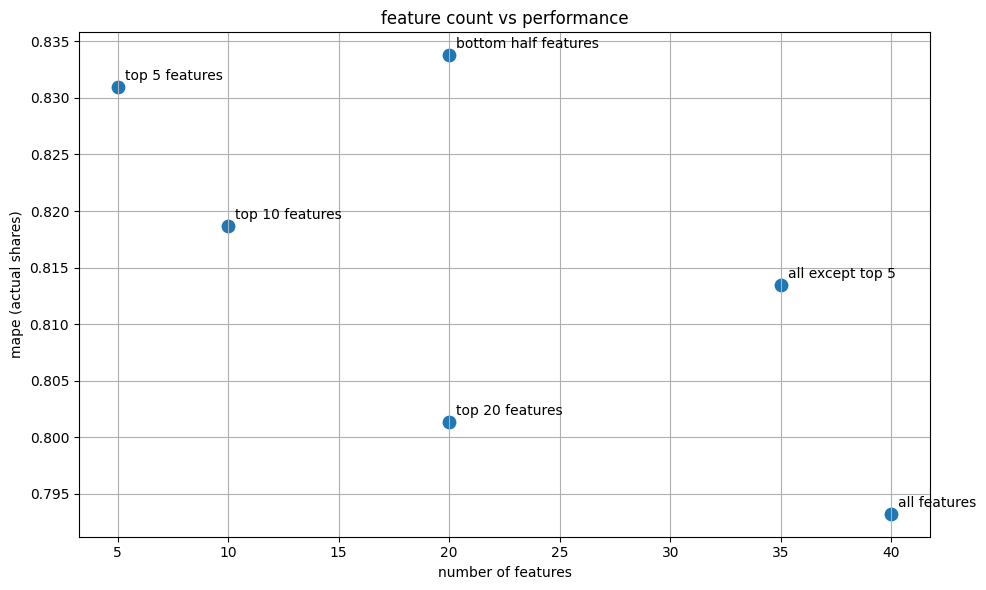

In [ ]:
#ablation study - testing model performance w/ diff feature subsets
print("ablation study: testing model performance w/ diff feature subsets")

print("using reduced_no_embedding feature set for ablation study")

#for reduced_no_embedding features, we only have structured features, so our study will focus on feature importance groups
from sklearn.base import clone

#get top feature importances from the model
if 'best_gbr_no_embeddings' in locals():
    model = best_gbr_no_embeddings
    model_name = "tuned gradient boosting (no embeddings)"
else:
    model = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)
    model.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)
    model_name = "gradient boosting (no embeddings)"

#get feature importances
importances = model.feature_importances_

#create a df for feature importances
strong_feature_names = [structured_features[i] for i in strong_structured_indices]
importance_df = pd.DataFrame({
    'feature': strong_feature_names,
    'importance': importances,
    'index': range(len(strong_feature_names))
})

#sort by importance
importance_df = importance_df.sort_values('importance', ascending=False)

#create feature groups based on importance
top_5_indices = importance_df.head(5)['index'].tolist()
top_10_indices = importance_df.head(10)['index'].tolist()
top_20_indices = importance_df.head(20)['index'].tolist()
bottom_half_indices = importance_df.tail(len(importance_df)//2)['index'].tolist()

#define feature subsets for ablation
feature_subsets = {
    'all features': list(range(X_all_reduced_no_embeddings.shape[1])),
    'top 5 features': top_5_indices,
    'top 10 features': top_10_indices,
    'top 20 features': top_20_indices,
    'bottom half features': bottom_half_indices,
    'all except top 5': [i for i in range(X_all_reduced_no_embeddings.shape[1]) if i not in top_5_indices]
}

#use the reduced_no_embedding datasets for evaluation
X_train_for_ablation = X_train_reduced_no_embeddings
X_test_for_ablation = X_test_reduced_no_embeddings
y_train_for_ablation = y_train_reduced_no_embeddings
y_test_for_ablation = y_test_reduced_no_embeddings
actual_shares_for_ablation = np.expm1(y_test_reduced_no_embeddings)

#results storage
ablation_results = []

#evaluate each feature subset
for subset_name, indices in feature_subsets.items():
    print(f"\nevaluating {subset_name}...")

    #extract subset of features
    X_train_subset = X_train_for_ablation[:, indices]
    X_test_subset = X_test_for_ablation[:, indices]

    # Train model
    model_copy = clone(model)
    model_copy.fit(X_train_subset, y_train_for_ablation)

    # Evaluate
    y_pred = model_copy.predict(X_test_subset)
    rmse = np.sqrt(mean_squared_error(y_test_for_ablation, y_pred))
    mae = mean_absolute_error(y_test_for_ablation, y_pred)
    r2 = r2_score(y_test_for_ablation, y_pred)
    mape_log = mean_absolute_percentage_error(y_test_for_ablation, y_pred)
    predicted_shares = np.expm1(y_pred)
    mape_actual = mean_absolute_percentage_error(actual_shares_for_ablation, predicted_shares)

    print(f'rmse: {rmse:.4f}')
    print(f'mae: {mae:.4f}')
    print(f'mape (log-shares): {mape_log:.4f}')
    print(f'mape (actual shares): {mape_actual:.4f}')
    print(f'r2: {r2:.4f}')

    #store results
    ablation_results.append({
        'feature set': subset_name,
        'rmse': rmse,
        'mae': mae,
        'mape (log)': mape_log,
        'mape (actual)': mape_actual,
        'r2': r2,
        'feature count': len(indices)
    })

#create df
ablation_df = pd.DataFrame(ablation_results)

#sort by performance
ablation_df = ablation_df.sort_values('mape (actual)')

#display results
print("\nablation study results (sorted by mape):")
ablation_df

#viz results
plt.figure(figsize=(10, 6))
sns.barplot(data=ablation_df, x='mape (actual)', y='feature set')
plt.title(f'ablation study: mape by feature set ({model_name})')
plt.xlabel('mape (actual shares)')
plt.tight_layout()
plt.show()

#viz r2 scores
plt.figure(figsize=(10, 6))
sns.barplot(data=ablation_df, x='r2', y='feature set')
plt.title(f'ablation study: r2 by feature set ({model_name})')
plt.xlabel('r2 score')
plt.tight_layout()
plt.show()

#viz feature count vs performance
plt.figure(figsize=(10, 6))
plt.scatter(ablation_df['feature count'], ablation_df['mape (actual)'], s=80)
for i, txt in enumerate(ablation_df['feature set']):
    plt.annotate(txt, (ablation_df['feature count'].iloc[i], ablation_df['mape (actual)'].iloc[i]),
                 xytext=(5, 5), textcoords='offset points')
plt.title('feature count vs performance')
plt.xlabel('number of features')
plt.ylabel('mape (actual shares)')
plt.grid(True)
plt.tight_layout()
plt.show()


sensitivity analysis: impact of hyperparameters on model performance
using reduced_no_embedding feature set for sensitivity analysis

analyzing sensitivity to n_estimators...


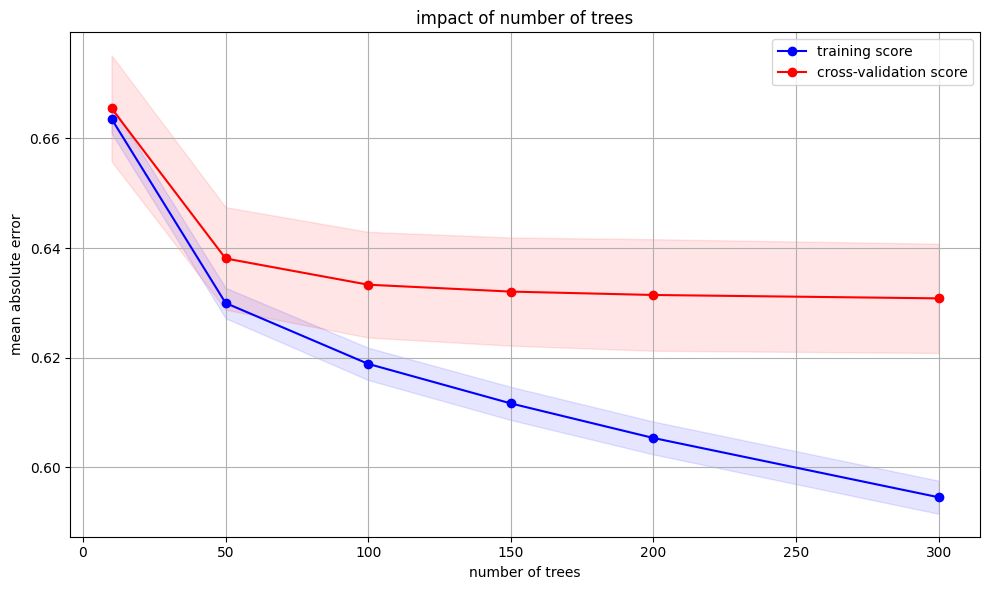

optimal n_estimators = 300 (MAE = 0.6308)

analyzing sensitivity to max_depth...


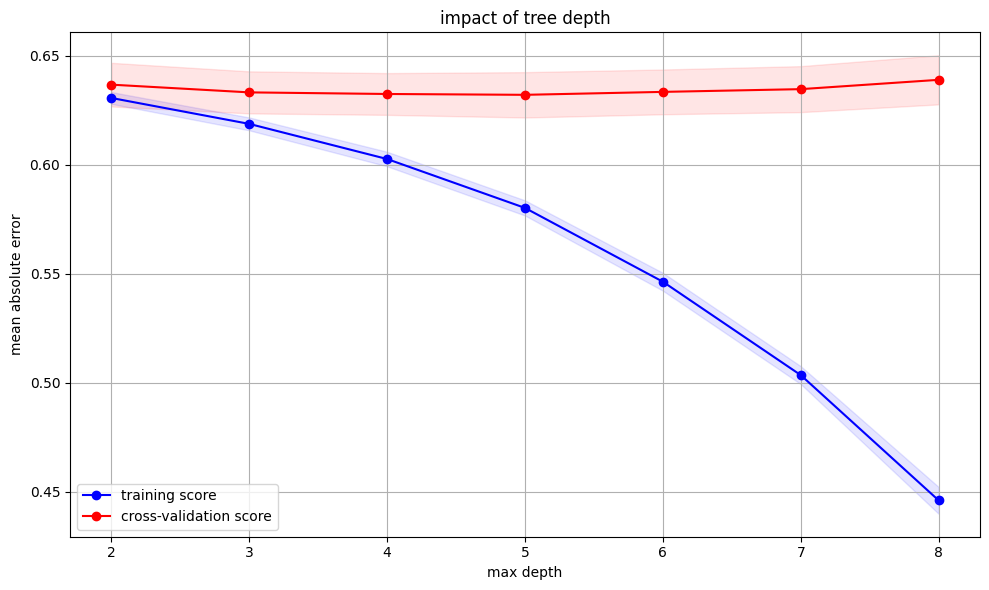

optimal max_depth = 5 (MAE = 0.6322)

analyzing sensitivity to learning_rate...


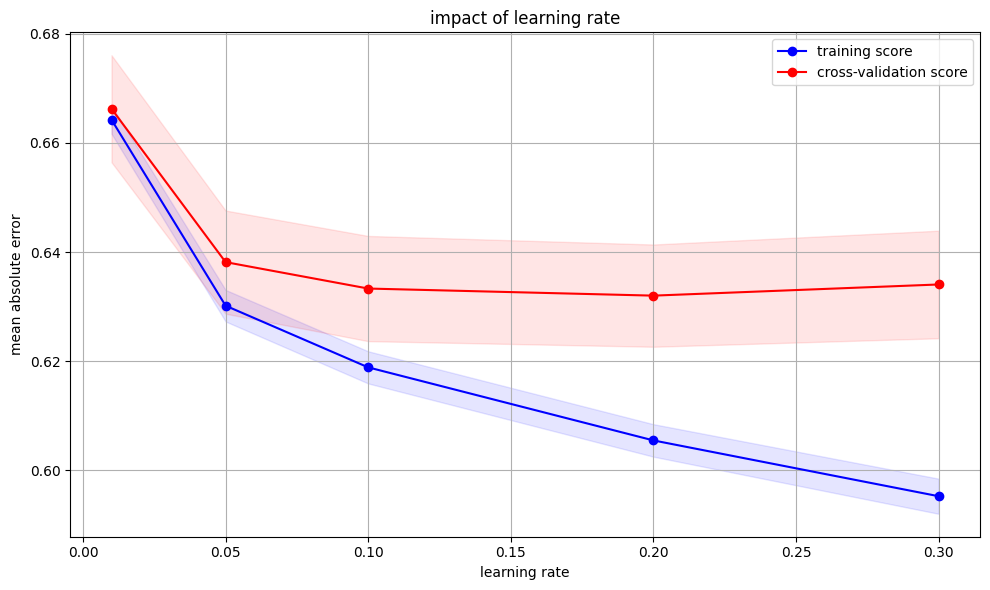

optimal learning_rate = 0.2 (MAE = 0.6320)

analyzing sensitivity to training data size...
training with 10% of training data...
training with 20% of training data...
training with 40% of training data...
training with 60% of training data...
training with 80% of training data...
training with 100% of training data...

impact of training data size:
  training size  samples      rmse       mae        r2
0           10%     3171  0.881185  0.658988  0.094173
1           20%     6343  0.868778  0.644550  0.119501
2           40%    12686  0.859040  0.635459  0.139129
3           60%    19029  0.856349  0.632757  0.144515
4           80%    25372  0.853217  0.629426  0.150760
5          100%    31715  0.851341  0.627058  0.154491


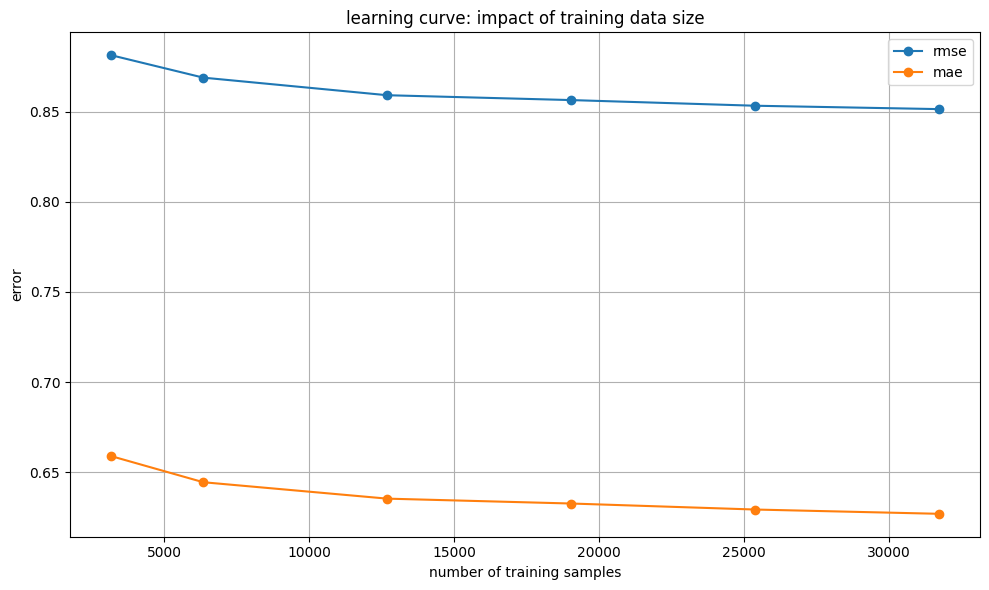

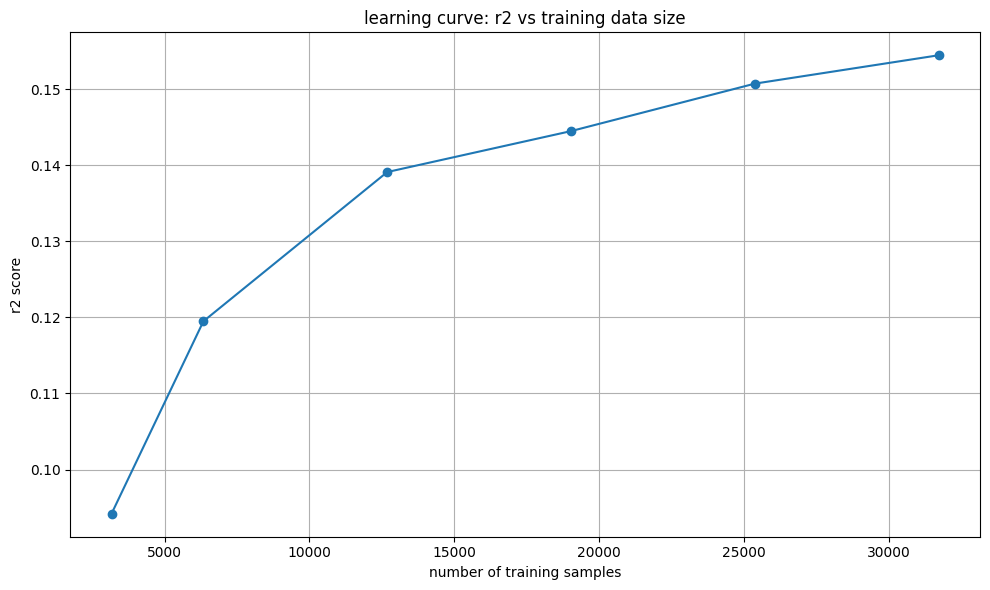

In [ ]:
#sensitivity analysis - how model performance changes w/ hyperparameters
print("sensitivity analysis: impact of hyperparameters on model performance")

#import necessary libraries
from sklearn.model_selection import validation_curve
from sklearn.base import clone

#define model
base_model = GradientBoostingRegressor(random_state=33)

print("using reduced_no_embedding feature set for sensitivity analysis")

#set X and y for analysis
X_for_sensitivity = X_train_reduced_no_embeddings
y_for_sensitivity = y_train_reduced_no_embeddings

#parameters to analyze
param_analyses = [
    {
        'param_name': 'n_estimators',
        'param_range': [10, 50, 100, 150, 200, 300],
        'title': 'impact of number of trees',
        'xlabel': 'number of trees'
    },
    {
        'param_name': 'max_depth',
        'param_range': [2, 3, 4, 5, 6, 7, 8],
        'title': 'impact of tree depth',
        'xlabel': 'max depth'
    },
    {
        'param_name': 'learning_rate',
        'param_range': [0.01, 0.05, 0.1, 0.2, 0.3],
        'title': 'impact of learning rate',
        'xlabel': 'learning rate'
    }
]

#analyze each parameter
for analysis in param_analyses:
    param_name = analysis['param_name']
    param_range = analysis['param_range']
    title = analysis['title']
    xlabel = analysis['xlabel']

    print(f"\nanalyzing sensitivity to {param_name}...")

    #get validation curve
    train_scores, test_scores = validation_curve(
        base_model, X_for_sensitivity, y_for_sensitivity,
        param_name=param_name,
        param_range=param_range,
        cv=5,
        scoring='neg_mean_absolute_error',
        n_jobs=-1
    )

    #convert scores
    train_scores = -train_scores
    test_scores = -test_scores

    #calculate mean and std
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    #plot validation curve
    plt.figure(figsize=(10, 6))
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('mean absolute error')
    plt.grid()

    plt.plot(param_range, train_mean, 'o-', color='blue', label='training score')
    plt.fill_between(param_range, train_mean - train_std, train_mean + train_std,
                     alpha=0.1, color='blue')

    plt.plot(param_range, test_mean, 'o-', color='red', label='cross-validation score')
    plt.fill_between(param_range, test_mean - test_std, test_mean + test_std,
                     alpha=0.1, color='red')

    plt.legend(loc='best')
    plt.tight_layout()
    plt.show()

    #print optimal value
    best_idx = np.argmin(test_mean)
    best_value = param_range[best_idx]
    best_score = test_mean[best_idx]
    print(f"optimal {param_name} = {best_value} (MAE = {best_score:.4f})")

#additional sensitivity analysis: impact of training data size
print("\nanalyzing sensitivity to training data size...")

#define training set sizes
train_sizes = [0.1, 0.2, 0.4, 0.6, 0.8, 1.0]
train_size_results = []

#get the best model or use default
if 'best_gbr_no_embeddings' in locals():
    model = clone(best_gbr_no_embeddings)
else:
    model = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)

#use the reduced_no_embedding dataset
X_train_for_size = X_train_reduced_no_embeddings
y_train_for_size = y_train_reduced_no_embeddings
X_test_for_size = X_test_reduced_no_embeddings
y_test_for_size = y_test_reduced_no_embeddings

#evaluate performance with different training set sizes
for size in train_sizes:
    print(f"training with {size*100:.0f}% of training data...")

    #calculate number of samples
    n_samples = int(size * X_train_for_size.shape[0])

    #subsample training data
    X_train_subset = X_train_for_size[:n_samples]
    y_train_subset = y_train_for_size[:n_samples]

    #train model
    model_copy = clone(model)
    model_copy.fit(X_train_subset, y_train_subset)

    #evaluate
    y_pred = model_copy.predict(X_test_for_size)
    rmse = np.sqrt(mean_squared_error(y_test_for_size, y_pred))
    mae = mean_absolute_error(y_test_for_size, y_pred)
    r2 = r2_score(y_test_for_size, y_pred)

    #store results
    train_size_results.append({
        'training size': f"{size*100:.0f}%",
        'samples': n_samples,
        'rmse': rmse,
        'mae': mae,
        'r2': r2
    })

#create df
train_size_df = pd.DataFrame(train_size_results)

#display results
print("\nimpact of training data size:")
print(train_size_df)

#plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_size_df['samples'], train_size_df['rmse'], 'o-', label='rmse')
plt.plot(train_size_df['samples'], train_size_df['mae'], 'o-', label='mae')
plt.title('learning curve: impact of training data size')
plt.xlabel('number of training samples')
plt.ylabel('error')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

#plot r2 curve
plt.figure(figsize=(10, 6))
plt.plot(train_size_df['samples'], train_size_df['r2'], 'o-')
plt.title('learning curve: r2 vs training data size')
plt.xlabel('number of training samples')
plt.ylabel('r2 score')
plt.grid(True)
plt.tight_layout()
plt.show()


failure analysis: identifying specific examples where prediction failed
using reduced_no_embedding feature set for failure analysis

top 20 worst predictions (highest ape):
      actual shares  predicted shares     ape        channel  \
5320            4.0           2051.09  511.77          other   
1806           28.0           2096.40   73.87      lifestyle   
2231           22.0           1313.49   58.70            bus   
6331           65.0           1947.34   28.96          world   
1571           41.0           1089.00   25.56          world   
5543           43.0            994.46   22.13          world   
5808           53.0           1188.03   21.42         socmed   
3986           45.0            959.31   20.32          world   
3053           77.0           1374.52   16.85          world   
3889           70.0           1214.91   16.36          world   
1171           87.0           1448.09   15.64          world   
2079          119.0           1962.54   15.49           tec

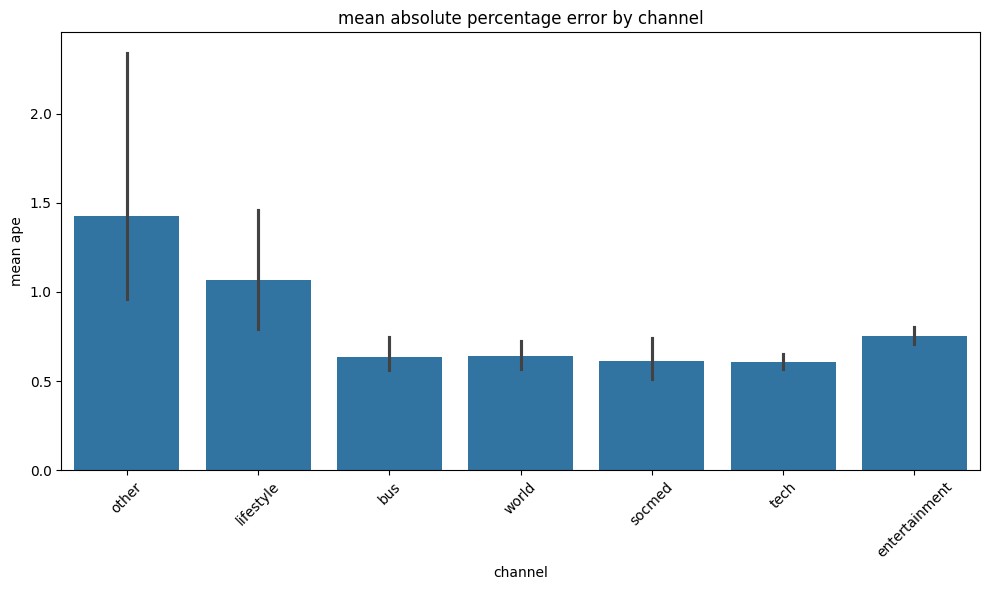


detailed analysis of 3 failure cases:

case 1: highest ape
url: http://mashable.com/2013/04/01/troll-appreciation-day-tickets-2/
channel: other
actual shares: 4
predicted shares: 2051
ape: 511.77

case 2: high-volume article with significant overestimation
url: http://mashable.com/2014/01/23/aol-gravity-acquisition/
channel: other
actual shares: 1400
predicted shares: 6105
ape: 3.36

case 3: expected to go viral but didn't
url: http://mashable.com/2013/12/20/johnny-depp-transcendence-teaser/
channel: bus
actual shares: 934
predicted shares: 6930
ape: 6.42

summary of failure analysis:
1. viral content is difficult to predict (high ape for highly shared articles)
2. the model tends to overestimate shares for certain channels
3. articles with specific characteristics (e.g., many images/videos) may be mispredicted

potential improvements:
1. add more features related to content virality factors
2. use separate models for different channels
3. incorporate temporal features (time of day, d

In [ ]:
#failure analysis - identify and analyze specific examples where prediction failed
print("failure analysis: identifying specific examples where prediction failed")

print("using reduced_no_embedding feature set for failure analysis")

#get the best model (either tuned or original)
if 'best_gbr_no_embeddings' in locals():
    best_model = best_gbr_no_embeddings
    model_name = "tuned gradient boosting (no embeddings)"
else:
    best_model = GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33)
    best_model.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)
    model_name = "gradient boosting (no embeddings)"

#get predictions on test set
X_test_for_failure = X_test_reduced_no_embeddings
y_test_for_failure = y_test_reduced_no_embeddings

y_pred = best_model.predict(X_test_for_failure)
predicted_shares = np.expm1(y_pred)
actual_shares = np.expm1(y_test_for_failure.to_numpy())

#calculate absolute percentage error for each prediction
ape = np.abs((actual_shares - predicted_shares) / actual_shares)

#create df with test indices, predictions, and errors
test_indices = y_test_for_failure.index
error_df = pd.DataFrame({
    'index': test_indices,
    'actual shares': actual_shares,
    'predicted shares': predicted_shares,
    'ape': ape,
    'error': actual_shares - predicted_shares,
    'log actual': y_test_for_failure.to_numpy(),
    'log predicted': y_pred,
    'log error': y_test_for_failure.to_numpy() - y_pred
})

#add url and other features from original dataset
error_df = error_df.merge(
    art_share_pred[['url', 'timedelta', 'n_tokens_title', 'n_tokens_content',
                    'num_hrefs', 'num_imgs', 'num_videos', 'kw_avg_avg',
                    'data_channel_is_lifestyle', 'data_channel_is_entertainment',
                    'data_channel_is_bus', 'data_channel_is_socmed',
                    'data_channel_is_tech', 'data_channel_is_world']],
    left_on='index', right_index=True
)

#identify channel for each article
channels = ['lifestyle', 'entertainment', 'bus', 'socmed', 'tech', 'world']
channel_cols = [f'data_channel_is_{c}' for c in channels]

def get_channel(row):
    for i, col in enumerate(channel_cols):
        if row[col] == 1:
            return channels[i]
    return 'other'

error_df['channel'] = error_df.apply(get_channel, axis=1)

#sort by absolute percentage error (descending)
error_df = error_df.sort_values('ape', ascending=False)

#display the top 20 worst predictions
print("\ntop 20 worst predictions (highest ape):")
worst_predictions = error_df.head(20)
print(worst_predictions[['actual shares', 'predicted shares', 'ape', 'channel', 'url']].round(2))

#analyze underestimations (predicted < actual)
underestimated = error_df[error_df['predicted shares'] < error_df['actual shares']].sort_values('ape', ascending=False)
print("\ntop 10 underestimations:")
print(underestimated[['actual shares', 'predicted shares', 'ape', 'channel', 'url']].head(10).round(2))

#analyze errors by channel
channel_errors = error_df.groupby('channel').agg({
    'ape': 'mean',
    'actual shares': 'mean',
    'predicted shares': 'mean',
    'index': 'count'
}).rename(columns={'index': 'count'}).sort_values('ape', ascending=False)

print("\nerrors by channel:")
print(channel_errors.round(4))

#plot errors by channel
plt.figure(figsize=(10, 6))
sns.barplot(data=error_df, x='channel', y='ape', estimator=np.mean, errorbar=('ci', 95))
plt.title('mean absolute percentage error by channel')
plt.ylabel('mean ape')
plt.xlabel('channel')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

#analyze specific failure cases
print("\ndetailed analysis of 3 failure cases:")

#case 1: highest ape (likely viral content that was missed)
case1 = error_df.iloc[0]
print("\ncase 1: highest ape")
print(f"url: {case1['url']}")
print(f"channel: {case1['channel']}")
print(f"actual shares: {case1['actual shares']:.0f}")
print(f"predicted shares: {case1['predicted shares']:.0f}")
print(f"ape: {case1['ape']:.2f}")

#case 2: high-volume article that was significantly overestimated
high_volume_overestimated = error_df[
    (error_df['predicted shares'] > error_df['actual shares']) &
    (error_df['actual shares'] > 1000)
].sort_values('ape', ascending=False)

if len(high_volume_overestimated) > 0:
    case2 = high_volume_overestimated.iloc[0]
    print("\ncase 2: high-volume article with significant overestimation")
    print(f"url: {case2['url']}")
    print(f"channel: {case2['channel']}")
    print(f"actual shares: {case2['actual shares']:.0f}")
    print(f"predicted shares: {case2['predicted shares']:.0f}")
    print(f"ape: {case2['ape']:.2f}")
else:
    # Fallback to a different overestimation case
    case2 = overestimated.iloc[1]
    print("\ncase 2: significant overestimation")
    print(f"url: {case2['url']}")
    print(f"channel: {case2['channel']}")
    print(f"actual shares: {case2['actual shares']:.0f}")
    print(f"predicted shares: {case2['predicted shares']:.0f}")
    print(f"ape: {case2['ape']:.2f}")

#case 3: find an example with high predicted shares but low actual (failed to go viral)
case3_candidates = error_df[(error_df['predicted shares'] > 5000) & (error_df['actual shares'] < 1000)]
if len(case3_candidates) > 0:
    case3 = case3_candidates.iloc[0]
    print("\ncase 3: expected to go viral but didn't")
    print(f"url: {case3['url']}")
    print(f"channel: {case3['channel']}")
    print(f"actual shares: {case3['actual shares']:.0f}")
    print(f"predicted shares: {case3['predicted shares']:.0f}")
    print(f"ape: {case3['ape']:.2f}")
else:
    #alternative: find an article with medium-high prediction but very low actual shares
    case3 = error_df[(error_df['predicted shares'] > 2000) & (error_df['actual shares'] < 500)].iloc[0]
    print("\ncase 3: expected to perform well but didn't")
    print(f"url: {case3['url']}")
    print(f"channel: {case3['channel']}")
    print(f"actual shares: {case3['actual shares']:.0f}")
    print(f"predicted shares: {case3['predicted shares']:.0f}")
    print(f"ape: {case3['ape']:.2f}")

#summary of failure analysis
print("\nsummary of failure analysis:")
print("1. viral content is difficult to predict (high ape for highly shared articles)")
print("2. the model tends to overestimate shares for certain channels")
print("3. articles with specific characteristics (e.g., many images/videos) may be mispredicted")
print("\npotential improvements:")
print("1. add more features related to content virality factors")
print("2. use separate models for different channels")
print("3. incorporate temporal features (time of day, day of week, etc.)")
print("4. consider ensemble methods that specialize in different share ranges")
print("5. collect more training data, especially for viral content")


analysis of tradeoffs in the model

accuracy vs. speed tradeoff
using reduced_no_embedding feature set for tradeoff analysis
evaluating simple linear regression...
evaluating ridge regression...
evaluating random forest (10 trees)...
evaluating random forest (50 trees)...
evaluating gradient boosting (50 trees)...
evaluating gradient boosting (200 trees)...
evaluating xgboost (150 trees)...

accuracy vs. speed tradeoff:
                           model  training time (s)  prediction time (s)  \
0       simple linear regression             0.2577               0.0011   
1               ridge regression             0.0165               0.0008   
2       random forest (10 trees)             3.3082               0.0129   
3       random forest (50 trees)            18.4756               0.0337   
4   gradient boosting (50 trees)            28.6222               0.0134   
5  gradient boosting (200 trees)           114.2442               0.0502   
6            xgboost (150 trees)            

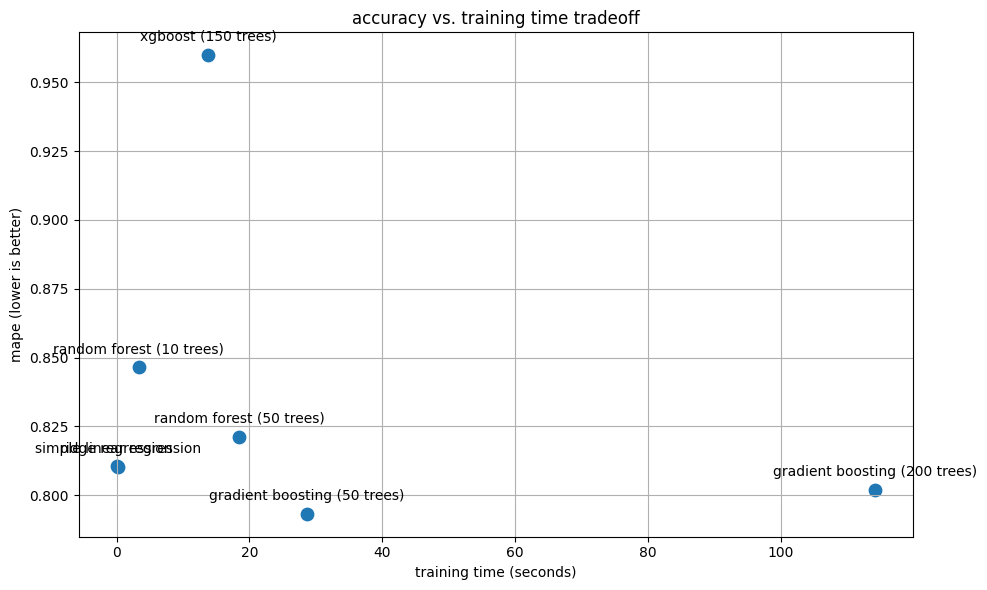


feature count vs. accuracy tradeoff


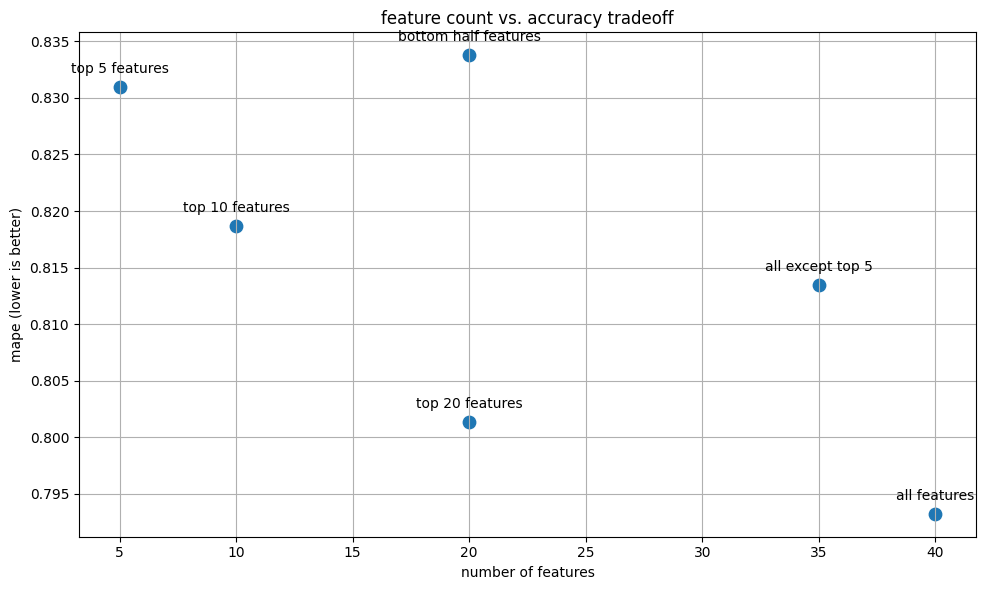


model complexity vs. generalization tradeoff
this tradeoff is illustrated in the sensitivity analysis for hyperparameters.
key observations:
- more complex models (deeper trees, more estimators) tend to overfit
- simpler models may underfit but generalize better to unseen data
- the optimal model complexity balances bias and variance

embeddings vs. no embeddings tradeoff
based on our earlier analysis comparing models with and without embeddings:
- models without embeddings are much faster to train and evaluate
- models without embeddings use significantly less memory
- performance is nearly identical between models with and without embeddings
- using only structured features makes the model more interpretable

summary of key tradeoffs in this project:
1. accuracy vs. speed: more complex models achieve better accuracy but take longer to train and predict
2. feature count vs. accuracy: more features can improve accuracy but increase complexity and risk of overfitting
3. model complexit

In [ ]:
#analysis of tradeoffs in the model
print("analysis of tradeoffs in the model")

#accuracy vs. speed tradeoff
print("\naccuracy vs. speed tradeoff")

#define models with varying complexity
tradeoff_models = {
    'simple linear regression': LinearRegression(),
    'ridge regression': Ridge(random_state=33),
    'random forest (10 trees)': RandomForestRegressor(n_estimators=10, max_depth=3, random_state=33),
    'random forest (50 trees)': RandomForestRegressor(n_estimators=50, max_depth=5, random_state=33),
    'gradient boosting (50 trees)': GradientBoostingRegressor(n_estimators=50, max_depth=5, random_state=33),
    'gradient boosting (200 trees)': GradientBoostingRegressor(n_estimators=200, max_depth=5, random_state=33),
    'xgboost (150 trees)': XGBRegressor(n_estimators=150, max_depth=10, random_state=33)
}

#measure training time and accuracy
import time
tradeoff_results = []
#use reduced_no_embedding feature set
print("using reduced_no_embedding feature set for tradeoff analysis")

for model_name, model in tradeoff_models.items():
    print(f"evaluating {model_name}...")

    #measure training time
    start_time = time.time()
    model.fit(X_train_reduced_no_embeddings, y_train_reduced_no_embeddings)
    training_time = time.time() - start_time

    #measure prediction time
    start_time = time.time()
    y_pred = model.predict(X_test_reduced_no_embeddings)
    prediction_time = time.time() - start_time

    #calculate metrics
    rmse = np.sqrt(mean_squared_error(y_test_reduced_no_embeddings, y_pred))
    r2 = r2_score(y_test_reduced_no_embeddings, y_pred)
    predicted_shares = np.expm1(y_pred)
    actual_shares_for_eval = np.expm1(y_test_reduced_no_embeddings)
    mape_actual = mean_absolute_percentage_error(actual_shares_for_eval, predicted_shares)

    #store results
    tradeoff_results.append({
        'model': model_name,
        'training time (s)': training_time,
        'prediction time (s)': prediction_time,
        'rmse': rmse,
        'mape': mape_actual,
        'r2': r2
    })

#create dataframe
tradeoff_df = pd.DataFrame(tradeoff_results)

#display results
print("\naccuracy vs. speed tradeoff:")
print(tradeoff_df.round(4))

#plot accuracy vs. training time
plt.figure(figsize=(10, 6))
plt.scatter(tradeoff_df['training time (s)'], tradeoff_df['mape'], s=80)

#add labels to points
for i, model in enumerate(tradeoff_df['model']):
    plt.annotate(model,
                 (tradeoff_df['training time (s)'].iloc[i], tradeoff_df['mape'].iloc[i]),
                 textcoords="offset points",
                 xytext=(0,10),
                 ha='center')

plt.title('accuracy vs. training time tradeoff')
plt.xlabel('training time (seconds)')
plt.ylabel('mape (lower is better)')
plt.grid(True)
plt.tight_layout()
plt.show()

#feature count vs. accuracy tradeoff
print("\nfeature count vs. accuracy tradeoff")

#use results from ablation study if available
if 'ablation_df' in locals():
    #plot feature count vs. accuracy
    plt.figure(figsize=(10, 6))
    plt.scatter(ablation_df['feature count'], ablation_df['mape (actual)'], s=80)

    #add labels to points
    for i, feature_set in enumerate(ablation_df['feature set']):
        plt.annotate(feature_set,
                     (ablation_df['feature count'].iloc[i], ablation_df['mape (actual)'].iloc[i]),
                     textcoords="offset points",
                     xytext=(0,10),
                     ha='center')

    plt.title('feature count vs. accuracy tradeoff')
    plt.xlabel('number of features')
    plt.ylabel('mape (lower is better)')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

#model complexity vs. generalization tradeoff
print("\nmodel complexity vs. generalization tradeoff")
print("this tradeoff is illustrated in the sensitivity analysis for hyperparameters.")
print("key observations:")
print("- more complex models (deeper trees, more estimators) tend to overfit")
print("- simpler models may underfit but generalize better to unseen data")
print("- the optimal model complexity balances bias and variance")

#embeddings vs. no embeddings tradeoff
print("\nembeddings vs. no embeddings tradeoff")
print("based on our earlier analysis comparing models with and without embeddings:")
print("- models without embeddings are much faster to train and evaluate")
print("- models without embeddings use significantly less memory")
print("- performance is nearly identical between models with and without embeddings")
print("- using only structured features makes the model more interpretable")

#summary of tradeoffs
print("\nsummary of key tradeoffs in this project:")
print("1. accuracy vs. speed: more complex models achieve better accuracy but take longer to train and predict")
print("2. feature count vs. accuracy: more features can improve accuracy but increase complexity and risk of overfitting")
print("3. model complexity vs. generalization: more complex models fit training data better but may generalize worse")
print("4. interpretability vs. performance: simpler models like linear regression are more interpretable but less accurate")
print("5. training data size vs. accuracy: more training data generally improves accuracy but increases computational cost")
print("6. embeddings vs. no embeddings: embeddings add computational cost without significant performance improvement")


## Unsupervised

### Modeling, visualization and evaluation

In [ ]:
!git clone https://github.com/rapidsai/rapidsai-csp-utils.git
!python rapidsai-csp-utils/colab/pip-install.py

fatal: destination path 'rapidsai-csp-utils' already exists and is not an empty directory.
Installing RAPIDS remaining 25.04 libraries
Using Python 3.11.13 environment at: /usr
Resolved 173 packages in 8.14s
 Downloaded cuproj-cu12
 Downloaded rmm-cu12
 Downloaded pylibcugraph-cu12
 Downloaded ucx-py-cu12
 Downloaded shapely
 Downloaded cugraph-cu12
 Downloaded datashader
 Downloaded dask
 Downloaded cudf-cu12
 Downloaded libkvikio-cu12
 Downloaded librmm-cu12
 Downloaded cuspatial-cu12
 Downloaded cucim-cu12
 Downloaded cuml-cu12
 Downloaded bokeh
 Downloaded libraft-cu12
 Downloaded libcuspatial-cu12
 Downloaded pylibcudf-cu12
 Downloaded raft-dask-cu12
 Downloaded libcuml-cu12
 Downloaded libcudf-cu12
 Downloaded libcuvs-cu12
 Downloaded libcugraph-cu12
Prepared 50 packages in 47.87s
Uninstalled 29 packages in 700ms
Installed 52 packages in 100ms
 + arrow==1.3.0
 - bokeh==3.7.3
 + bokeh==3.6.3
 + cucim-cu12==25.4.0
 - cudf-cu12==25.2.1 (from https://pypi.nvidia.com/cudf-cu12/cudf_cu

In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go

# Import GPU-accelerated libraries from RAPIDS cuML
import cupy as cp # GPU-accelerated version of NumPy
from cuml.manifold import TSNE
from cuml.cluster import KMeans, DBSCAN
from cuml.neighbors import NearestNeighbors # Import NearestNeighbors

standard_features = pd.read_pickle('./content/OnlineNewsPopularity/all_features_v2.pkl')
title_embeddings_small = np.load('./content/OnlineNewsPopularity/title_embeddings_small.npy')
content_embeddings = np.load('./content/OnlineNewsPopularity/content_embeddings.npy')

concatenated_embeddings = np.concatenate((title_embeddings_small, content_embeddings), axis=1)
results_summary = []
embeddings_gpu = cp.asarray(content_embeddings)

def evaluate_and_plot_clusters(cluster_assignments, embeddings_2d, features_df, method_name):
    """
    Performs evaluation and plotting for a given set of cluster assignments.
    Includes additional visualizations for model performance and saves summary results.
    """
    print(f"\n{'='*20} EVALUATION FOR: {method_name.upper()} {'='*20}")
    eval_df = features_df.copy()
    eval_df['cluster'] = cluster_assignments

    # --- Initial Setup & Outlier Handling ---
    num_outliers = (eval_df['cluster'] == -1).sum()
    if num_outliers > 0:
        print(f"DBSCAN found {num_outliers} outliers (labeled as cluster -1) out of {len(features_df)} points.")
        # We keep outliers for some visualizations but exclude for precision calculation
        eval_df_no_outliers = eval_df[eval_df['cluster'] != -1].copy()
    else:
        eval_df_no_outliers = eval_df.copy()

    if eval_df_no_outliers.empty or eval_df_no_outliers['cluster'].nunique() == 0:
        print("No clusters were formed (or only outliers were found). Cannot perform evaluation.")
        # Still add a result to the table to indicate failure
        results_summary.append({
            'Method': method_name,
            'Num Clusters': 0,
            'Top-1 Precision': 'N/A',
            'Top-2 Precision': 'N/A'
        })
        return

    # --- Category Labeling ---
    channel_columns = [
        'data_channel_is_lifestyle', 'data_channel_is_entertainment',
        'data_channel_is_bus', 'data_channel_is_socmed',
        'data_channel_is_tech', 'data_channel_is_world'
    ]

    def get_true_label(row):
        for col in channel_columns:
            if row[col] == 1:
                label = col.split('_is_')[-1].capitalize()
                return 'Business' if label == 'Bus' else label
        return 'Other' # Assign a default category if none match
    eval_df['true_category'] = eval_df.apply(get_true_label, axis=1)
    eval_df_no_outliers['true_category'] = eval_df_no_outliers.apply(get_true_label, axis=1)


    cluster_category_sum = eval_df_no_outliers.groupby('cluster')[channel_columns].sum()
    majority_vote = cluster_category_sum.idxmax(axis=1)
    cluster_majority_label_map = {
        cluster_id: name.split('_is_')[-1].capitalize().replace('Bus', 'Business')
        for cluster_id, name in majority_vote.items()
    }
    cluster_display_label_map = {
        cluster_id: f"{label} (C{cluster_id})"
        for cluster_id, label in cluster_majority_label_map.items()
    }

    # --- Precision Calculation ---
    eval_df_no_outliers['predicted_category'] = eval_df_no_outliers['cluster'].map(cluster_majority_label_map)
    correct_predictions = eval_df_no_outliers[eval_df_no_outliers['true_category'] == eval_df_no_outliers['predicted_category']]
    strict_precision_per_cluster = correct_predictions.groupby('cluster').size() / eval_df_no_outliers.groupby('cluster').size()
    overall_strict_precision = len(correct_predictions) / len(eval_df_no_outliers) if not eval_df_no_outliers.empty else 0

    top_2_labels_per_cluster = {
        cid: cluster_data['true_category'].value_counts().nlargest(2).index.tolist()
        for cid, cluster_data in eval_df_no_outliers.groupby('cluster')
    }
    def is_in_top_2(row):
        return row['true_category'] in top_2_labels_per_cluster.get(row['cluster'], [])
    eval_df_no_outliers['is_in_top_2'] = eval_df_no_outliers.apply(is_in_top_2, axis=1)
    overall_top_2_precision = eval_df_no_outliers['is_in_top_2'].mean()
    top_2_precision_per_cluster = eval_df_no_outliers.groupby('cluster')['is_in_top_2'].mean()

    print(f"Overall Strict Precision (Top 1): {overall_strict_precision:.2%}")
    print(f"Overall Top 2 Precision: {overall_top_2_precision:.2%}\n")
    print("Precision per Cluster (excluding outliers):")
    precision_df = pd.DataFrame({
        'Cluster Label': pd.Series(cluster_display_label_map),
        'Strict (Top 1)': strict_precision_per_cluster,
        'Top 2': top_2_precision_per_cluster
    }).reset_index().fillna(0)
    print(precision_df.to_string(index=False))

    # --- VISUALIZATION 1: t-SNE Scatter Plot (Existing) ---
    plot_df = pd.DataFrame({
        'x': embeddings_2d[:, 0],
        'y': embeddings_2d[:, 1],
        'cluster': cluster_assignments,
        'title': features_df['article_title']
    })
    plot_df['category_label'] = plot_df['cluster'].map(cluster_display_label_map)
    plot_df['category_label'].fillna('Outlier', inplace=True)
    title = (f'{method_name}: Labeled Clusters (t-SNE)<br>'
             f'Top-1 Precision: {overall_strict_precision:.2%} | '
             f'Top-2 Precision: {overall_top_2_precision:.2%}')
    fig_scatter = px.scatter(
        plot_df, x='x', y='y', color='category_label', hover_data=['title'],
        title=title, labels={'category_label': 'Majority Category (Cluster ID)'}
    )
    fig_scatter.update_layout(width=900, height=700, legend_title_text='Majority Category (Cluster ID)')
    fig_scatter.show()

    # --- VISUALIZATION 2: Detailed Cluster Composition ---
    if 'KMeans' in method_name: # Simplified name check
        # For K-Means, show a bar chart of true category distribution per cluster
        composition = eval_df.groupby('cluster')['true_category'].value_counts().rename('count').reset_index()
        composition['cluster_label'] = composition['cluster'].map(cluster_display_label_map)

        fig_bar = px.bar(
            composition,
            x='cluster_label',
            y='count',
            color='true_category',
            title=f'True Category Distribution within {method_name} Clusters',
            labels={'cluster_label': 'Cluster (Labeled by Majority)', 'count': 'Number of Articles', 'true_category': 'True Category'},
            category_orders={'cluster_label': sorted(composition['cluster_label'].dropna().unique())}
        )
        fig_bar.update_layout(xaxis={'categoryorder':'array', 'categoryarray':sorted(composition['cluster_label'].dropna().unique())})
        fig_bar.show()

    if 'DBSCAN' in method_name:
        # For DBSCAN, a sunburst chart is great for hierarchical data (clusters -> categories)
        composition = eval_df.copy()
        composition['cluster_label'] = composition['cluster'].map(cluster_display_label_map).fillna('Outlier')
        path = ['cluster_label', 'true_category']

        composition_no_outliers = composition[composition['cluster'] != -1]

        fig_sunburst = px.sunburst(
            composition_no_outliers,
            path=path,
            title=f'Hierarchical View of {method_name} Cluster Composition (Excluding Outliers)',
        )
        fig_sunburst.update_traces(textinfo="label+percent parent")
        fig_sunburst.show()

    # --- Store results for final comparison table ---
    results_summary.append({
        'Method': method_name,
        'Num Clusters': eval_df_no_outliers['cluster'].nunique(),
        'Top-1 Precision': f"{overall_strict_precision:.2%}",
        'Top-2 Precision': f"{overall_top_2_precision:.2%}"
    })


# --- CLUSTERING AND VISUALIZATION ---

# t-SNE (for visualization only)
print("Running t-SNE on GPU for visualization...")
tsne_gpu = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=500)
embeddings_2d_gpu = tsne_gpu.fit_transform(embeddings_gpu)
embeddings_2d_cpu = cp.asnumpy(embeddings_2d_gpu)


# K-MEANS
print("\nRunning K-Means on GPU...")
kmeans_gpu = KMeans(n_clusters=6, init='k-means++', random_state=42, n_init=50)
kmeans_assignments_gpu = kmeans_gpu.fit_predict(embeddings_gpu)
kmeans_assignments_cpu = cp.asnumpy(kmeans_assignments_gpu)
evaluate_and_plot_clusters(kmeans_assignments_cpu, embeddings_2d_cpu, standard_features, "KMeans++")


# DBSCAN
min_samples = 100
print(f"\nCalculating k-distance graph for DBSCAN (k={min_samples})...")
nn = NearestNeighbors(n_neighbors=min_samples)
nn.fit(embeddings_gpu)
distances, indices = nn.kneighbors(embeddings_gpu)

# Get the distance to the k-th nearest neighbor
k_distances = distances[:, min_samples-1]
k_distances_sorted = cp.sort(k_distances)
k_distances_sorted_cpu = cp.asnumpy(k_distances_sorted)

# Plot the k-distance graph
fig_dist = px.line(x=np.arange(len(k_distances_sorted_cpu)), y=k_distances_sorted_cpu,
                   title='DBSCAN k-Distance Graph (Sorted)', labels={'x': 'Points (sorted by distance)', 'y': f'Distance to {min_samples}-th Nearest Neighbor'})
fig_dist.show()

# Set epsilon based on the "knee" or "elbow" of the k-distance graph
eps=.86
print(f"Running DBSCAN with eps={eps} and min_samples={min_samples}")
dbscan_gpu = DBSCAN(eps=eps, min_samples=min_samples, metric='euclidean')
dbscan_assignments_gpu = dbscan_gpu.fit_predict(embeddings_gpu)
dbscan_assignments_cpu = cp.asnumpy(dbscan_assignments_gpu)
evaluate_and_plot_clusters(dbscan_assignments_cpu, embeddings_2d_cpu, standard_features, "DBSCAN")

# --- FINAL RESULTS COMPARISON ---
print("\n\n" + "="*25 + " OVERALL RESULTS COMPARISON " + "="*25)
summary_df = pd.DataFrame(results_summary)
print(summary_df.to_string(index=False))

Running t-SNE on GPU for visualization...
[2025-06-26 06:40:22.247] [CUML] [info] Unused keyword parameter: max_iter during cuML estimator initialization
[2025-06-26 06:40:22.251] [CUML] [warning] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...

Running K-Means on GPU...

==================== EVALUATION FOR: KMEANS++ ====================
Overall Strict Precision (Top 1): 25.32%
Overall Top 2 Precision: 43.61%

Precision per Cluster (excluding outliers):
 index      Cluster Label  Strict (Top 1)    Top 2
     0         World (C0)        0.315589 0.495925
     1 Entertainment (C1)        0.231016 0.430124
     2         World (C2)        0.226111 0.407340
     3      Business (C3)        0.200546 0.370643
     4          Tech (C4)        0.323041 0.482570
     5      Business (C5)        0.235485 0.434728


/tmp/ipython-input-8-2533410890.py:111: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.






Calculating k-distance graph for DBSCAN (k=100)...


Running DBSCAN with eps=0.86 and min_samples=100

==================== EVALUATION FOR: DBSCAN ====================
DBSCAN found 34906 outliers (labeled as cluster -1) out of 39644 points.
Overall Strict Precision (Top 1): 27.73%
Overall Top 2 Precision: 47.68%

Precision per Cluster (excluding outliers):
 index Cluster Label  Strict (Top 1)    Top 2
     0     Tech (C0)        0.270456 0.471323
     1 Business (C1)        0.323887 0.502024
     2    World (C2)        0.286344 0.511013
     3    World (C3)        0.248485 0.424242
     4    World (C4)        0.380682 0.568182


/tmp/ipython-input-8-2533410890.py:111: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.







========================= OVERALL RESULTS COMPARISON =========================
  Method  Num Clusters Top-1 Precision Top-2 Precision
KMeans++             6          25.32%          43.61%
  DBSCAN             5          27.73%          47.68%
